<a href="https://colab.research.google.com/github/MatiasCovarrubias/jaxecon/blob/main/RbcProdNet_Analysis_Sep23_2025_volcomparative.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DEQN Solution Analysis

This notebook loads a trained neural net and evaluate it in a model.

In [ ]:
# First, uninstall current versions to avoid conflicts
!pip uninstall -y jax jaxlib

# Install the latest JAX (this will get you the newest stable version)
# !pip install --upgrade jax jaxlib

# Or if you want to specify JAX 0.6.0 exactly:
!pip install --upgrade jax[cuda12]
# !pip install jax[cuda12]
# !pip install jaxlib==0.7.2

# PRECISION
from jax import numpy as jnp, lax, random, config
double_precision = True
if double_precision:
  config.update("jax_enable_x64", True)
  precision = jnp.float64
else:
  precision = jnp.float32

# IMPORTS
import matplotlib.pyplot as plt, seaborn as sns, numpy as np, pandas as pd, jax, flax, optax, os, json
import flax.linen as nn
from flax.training.train_state import TrainState  # Useful dataclass to keep train state
from flax.training import checkpoints
from flax.core import freeze, unfreeze
import optax
from time import time
from typing import Sequence
config.update("jax_debug_nans", True)

print("DEVICES: ", jax.devices())

# MOUNT GOOGLE DRIVE (a pop up will appear, follow instructions)
from google.colab import drive
drive.mount('/content/drive')

# DEFINE WORKING DIR
working_dir = "/content/drive/MyDrive/Jaxecon/RbcProdNet/"

Found existing installation: jax 0.5.3
Uninstalling jax-0.5.3:
  Successfully uninstalled jax-0.5.3
Found existing installation: jaxlib 0.5.3
Uninstalling jaxlib-0.5.3:
  Successfully uninstalled jaxlib-0.5.3
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 68.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.7/132.7 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.2/78.2 MB 27.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 98.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 MB 26.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.1/139.1 MB 8.3 MB/s eta 0:00:00
  Attempting uninstall: jax-cuda12-pjrt
    Found existing installation: jax-cuda12-pjrt 0.5.3
    Uninstalling jax-cuda12-pjrt-0.5.3:
      Successfully uninstalled jax-cuda12-pjrt-0.5.3
  Attempting uninstall: nvidia-cuda-nvcc-cu12
    Found existing installation: nvidia-cuda-nvcc-cu12 12.5.82
    Uninstalling nvid

In [ ]:
!nvidia-smi

Thu Sep 18 09:25:36 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      Off |   00000000:00:03.0 Off |                    0 |
| N/A   59C    P0             30W /   72W |   17271MiB /  23034MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
from functools import partial

In [ ]:
# Plot parameters
sns.set_style("whitegrid") # Set seaborn style and color palette

palette = "dark" # or try "colorblind", "bright", "dark", "pastel"
sns.set_palette(palette)
colors = sns.color_palette(palette, 10)
print(colors)


SMALL_SIZE = 12
MEDIUM_SIZE = 14
LARGE_SIZE = 16


# Set font family and sizes globally
plt.rc("font", family="sans-serif", size=SMALL_SIZE)
plt.rcParams["font.sans-serif"] = ["DejaVu Sans", "Arial", "Helvetica", "sans-serif"]

plt.rc("axes", titlesize=LARGE_SIZE)  # fontsize of the axes title
plt.rc("axes", labelsize=MEDIUM_SIZE)  # fontsize of the x and y labels
plt.rc("xtick", labelsize=SMALL_SIZE)  # fontsize of the tick labels
plt.rc("ytick", labelsize=SMALL_SIZE)  # fontsize of the tick labels
plt.rc("legend", fontsize=SMALL_SIZE)  # legend fontsize
plt.rc("figure", titlesize=LARGE_SIZE)

# For math rendering - using DejaVu which is always available
plt.rc("mathtext", fontset="dejavusans")  # DejaVu math fonts

[(0.0, 0.10980392156862745, 0.4980392156862745), (0.6941176470588235, 0.25098039215686274, 0.050980392156862744), (0.07058823529411765, 0.44313725490196076, 0.10980392156862745), (0.5490196078431373, 0.03137254901960784, 0.0), (0.34901960784313724, 0.11764705882352941, 0.44313725490196076), (0.34901960784313724, 0.1843137254901961, 0.050980392156862744), (0.6352941176470588, 0.20784313725490197, 0.5098039215686274), (0.23529411764705882, 0.23529411764705882, 0.23529411764705882), (0.7215686274509804, 0.5215686274509804, 0.0392156862745098), (0.0, 0.38823529411764707, 0.4549019607843137)]


# Import data of experiment to analyze

In [ ]:
save_dir = working_dir + "Experiments/"
# restore_exper_name = "baselinev3_truedrive_v2"
restore_exper_name = "baseline_stackv2_64periods_long_antitheticMC"
restore_exper_name_lowvol = "baseline_stackv2_64periods_low"
restore_exper_name_lowmedvol = "baseline_stackv2_64periods_lowmed"
restore_exper_name_highmedvol = "baseline_stackv2_64periods_highmed"
restore_exper_name_highvol = "baseline_stackv2_64periods_high"


# OPEN CONFIG OF THAT EXPERIMENT
exper_results_json = open(save_dir+restore_exper_name+"/results.json")
exper_results = json.load(exper_results_json)
exper_config =exper_results["config"]
model_name = exper_config["model_name"]

exper_results_json_lowvol = open(save_dir+restore_exper_name_lowvol+"/results.json")
exper_results_lowvol = json.load(exper_results_json_lowvol)
exper_config_lowvol =exper_results_lowvol["config"]
model_name_lowvol = exper_config_lowvol["model_name"]

exper_results_json_lowmedvol = open(save_dir+restore_exper_name_lowmedvol+"/results.json")
exper_results_lowmedvol = json.load(exper_results_json_lowmedvol)
exper_config_lowmedvol =exper_results_lowmedvol["config"]
model_name_lowmedvol = exper_config_lowmedvol["model_name"]

exper_results_json_highmedvol = open(save_dir+restore_exper_name_highmedvol+"/results.json")
exper_results_highmedvol = json.load(exper_results_json_highmedvol)
exper_config_highmedvol =exper_results_highmedvol["config"]
model_name_highmedvol = exper_config_highmedvol["model_name"]

exper_results_json_highvol = open(save_dir+restore_exper_name_highvol+"/results.json")
exper_results_highvol = json.load(exper_results_json_highvol)
exper_config_highvol =exper_results_highvol["config"]
model_name_highvol = exper_config_highvol["model_name"]


# Create Neural Net Policy

First, we use Flax to create the Neural Net, Notice that we activate the last layer using Softplus to guarantee that we get possitive outputs.

See https://flax.readthedocs.io/en/latest/getting_started.html

In [ ]:
class NeuralNet(nn.Module):
  features: Sequence[int]
  C: jnp.ndarray  # shape (n_states, n_states)
  policies_sd: jnp.ndarray  # shape (n_policies,)
  param_dtype = precision

  @nn.compact
  def __call__(self, x):
    # Ensure 2D for consistent slicing
    x_2d = x.reshape(-1, x.shape[-1])  # Always (batch, 111)

    # Baseline loglinear policy
    baseline = x @ self.C.T
    baseline = baseline * self.policies_sd[None, :]  # (batch, n_states)

    # Residual MLP
    h = x_2d
    for feat in self.features:
        h = nn.relu(nn.Dense(feat, param_dtype=self.param_dtype)(h))

    residual = nn.Dense(
        self.C.shape[0],
        kernel_init=nn.initializers.zeros,
        bias_init=nn.initializers.zeros,
        param_dtype=self.param_dtype
    )(h)

    output = baseline + residual

    # Reshape output to match input shape structure
    if x.ndim == 1:
        output = output.reshape(-1)

    return output

# Create Economic Model

We will represent our model as clas with four main methods (or functions): initial_obs to get first observation; step to advance a period, expectation to get the expectation term given a state, policy, and shock; and a loss funciton that gets as the loss given a state, policy and expectation term.

## Import Parameters of the Model

In [ ]:
import scipy.io as sio
model_name = "Feb21_24_baselinev3.mat"
model_data = sio.loadmat(working_dir + "Model_Data/RbcProdNet_SolData_" + model_name, simplify_cells=True)
modparams = model_data["SolData"]["parameters"]  # dictionary with model parameters of the model
policies_ss = model_data["SolData"]["policies_ss"]  # dictionary with model parameters of the model
k_ss = model_data["SolData"]["k_ss"]
policies_sd = model_data["SolData"]["policies_sd"]  # dictionary with model parameters of the model
states_sd = model_data["SolData"]["states_sd"]  # dictionary with model parameters of the model
shocks_sd = model_data["SolData"]["shocks_sd"]  # dictionary with model parameters of the model
A = model_data["SolData"]["A"]
B = model_data["SolData"]["B"]
C = model_data["SolData"]["C"]
D = model_data["SolData"]["D"]
n_sectors = modparams["parn_sectors"]
print(modparams)


{'parn_sectors': 37, 'parbeta': 0.96, 'pareps_c': 0.5, 'pareps_l': 0.5, 'parphi': 2, 'partheta': 282791.12733419565, 'parsigma_c': 0.5, 'parsigma_m': 0.1, 'parsigma_q': 0.5, 'parsigma_y': 0.8, 'parsigma_I': 0.5, 'parsigma_l': 0.5, 'paralpha': array([0.76246851, 0.81447933, 0.2173877 , 0.35041499, 0.51072498,
       0.49043508, 0.43432306, 0.48266322, 0.46770221, 0.45357891,
       0.50864942, 0.45744396, 0.30623142, 0.49284854, 0.61563524,
       0.33601341, 0.27585449, 0.55552307, 0.23069028, 0.65399183,
       0.72390174, 0.48730601, 0.54020845, 0.47152072, 0.42829889,
       0.70186202, 0.59354188, 0.96764559, 0.57588724, 0.20876475,
       0.33779216, 0.16464859, 0.45550776, 0.57440692, 0.4837216 ,
       0.4069147 , 0.41336966]), 'pardelta': array([0.07113207, 0.03325417, 0.12865278, 0.08514028, 0.07672778,
       0.05764028, 0.07075   , 0.08320417, 0.13533333, 0.10309861,
       0.15317917, 0.11067917, 0.08234722, 0.0942625 , 0.06625972,
       0.06867222, 0.06729028, 0.08019444,

In [ ]:
IRs_All = sio.loadmat(working_dir + "Model_Data/AllSectors_IRS__Mar_25.mat", simplify_cells=True)["AllIRS"]
# import IRs

IRs_Min = IRs_All["Sector_1"]
IRs_Cons = IRs_All["Sector_3"]
IRs_RT = IRs_All["Sector_24"]
traject_PF_Min = jnp.transpose(IRs_Min["IRSDeterm"])[1:80,:]
traject_PF_Cons = jnp.transpose(IRs_Cons["IRSDeterm"])[1:80,:]
traject_PF_RT = jnp.transpose(IRs_RT["IRSDeterm"])[1:80,:]
peak_values_loglin = IRs_All["peak_values_loglin"]
peak_values_determ = IRs_All["peak_values_determ"]
peak_periods_shock = IRs_All["peak_periods_shock"]
peak_periods_loglin = IRs_All["peak_periods_loglin"]
peak_periods_determ = IRs_All["peak_periods_determ"]
half_lives_shock = IRs_All["half_lives_shock"]
half_lives_loglin = IRs_All["half_lives_loglin"]
half_lives_determ = IRs_All["half_lives_determ"]
IRs_All["amplification"] = (peak_values_determ-peak_values_loglin)/peak_values_loglin

## Create Model class

In [ ]:
class Model():
  """A JAX implementation of an RBC model."""

  def __init__(self,
    modparams = modparams, k_ss=k_ss, policies_ss=policies_ss, state_sd=states_sd,
    shocks_sd=shocks_sd, policies_sd=policies_sd, A=A, B=B, C=C, D=D):

    self.alpha = jnp.array(modparams["paralpha"], dtype = precision)
    self.beta = jnp.array(modparams["parbeta"], dtype = precision)
    self.delta = jnp.array(modparams["pardelta"], dtype = precision)
    self.rho = jnp.array(modparams["parrho"], dtype = precision)
    self.eps_c = jnp.array(modparams["pareps_c"], dtype = precision)
    self.eps_l = jnp.array(modparams["pareps_l"], dtype = precision)
    self.phi = jnp.array(modparams["parphi"], dtype = precision)
    self.theta = jnp.array(modparams["partheta"], dtype = precision)
    self.sigma_c = jnp.array(modparams["parsigma_c"], dtype = precision)
    self.sigma_m = jnp.array(modparams["parsigma_m"], dtype = precision)
    self.sigma_q = jnp.array(modparams["parsigma_q"], dtype = precision)
    self.sigma_y = jnp.array(modparams["parsigma_y"], dtype = precision)
    self.sigma_I = jnp.array(modparams["parsigma_I"], dtype = precision)
    self.sigma_l = jnp.array(modparams["parsigma_l"], dtype = precision)
    self.xi = jnp.array(modparams["parxi"], dtype = precision)
    self.mu = jnp.array(modparams["parmu"], dtype = precision)
    self.Gamma_M = jnp.array(modparams["parGamma_M"], dtype = precision)
    self.Gamma_I = jnp.array(modparams["parGamma_I"], dtype = precision)
    self.Sigma_A = jnp.array(modparams["parSigma_A"], dtype = precision)
    self.n_sectors = modparams["parn_sectors"]
    self.state_ss = jnp.concatenate([k_ss,jnp.zeros(shape=(1*self.n_sectors,), dtype = precision)])
    self.policies_ss = jnp.array(policies_ss, dtype = precision)

    self.A = A
    self.B = B
    self.C = C
    self.D = D
    self.state_sd = jnp.array(state_sd, dtype = precision)
    self.policies_sd = jnp.array(policies_sd, dtype = precision)
    self.dim_policies = len(policies_ss)
    self.dim_states = len(self.state_ss)
    self.n_actions = len(policies_ss)
    self.L_cholesky = jnp.linalg.cholesky(self.Sigma_A)

  def initial_obs(self, rng, range=1):
    """ Get initial obs given first shock """

    rng_k, rng_a, rng_e, rng_c = random.split(rng,4)
    e = self.sample_shock(rng)                                                  # sample a realization of the shock
    k_ss = self.state_ss[:self.n_sectors]                                         # get log K in StSt
    a_ss = self.state_ss[self.n_sectors:]                         # get log A in StSt
    K_init = random.uniform(rng_k, shape=(self.n_sectors,), minval=(1-range/100)*jnp.exp(self.state_ss[:self.n_sectors]),maxval = (1+range/300)*jnp.exp(self.state_ss[:self.n_sectors]))
    A_init = random.uniform(rng_a, shape=(self.n_sectors,), minval=(1-range/100),maxval = (1+range/100))
    state_init_notnorm = jnp.concatenate([jnp.log(K_init),jnp.log(A_init)])
    state_init = (state_init_notnorm-self.state_ss)/self.state_sd                       # normalize
    return random.choice(rng_c,jnp.array([state_init]))


  def step(self, state, policy, shock):
    """ A period step of the model, given current obs, the shock and policy_params """

    state_notnorm = state*self.state_sd + self.state_ss                                 # denormalize obs
    K = jnp.exp(state_notnorm[:self.n_sectors])                                   # extract k and put in levels
    a = state_notnorm[self.n_sectors:]
    a_next = self.rho*a + shock
    policy_notnorm = jnp.exp(policy*self.policies_sd+self.policies_ss)                           # denormalize policy

    I = policy_notnorm[6*self.n_sectors:7*self.n_sectors]
    K_tplus1 = (1-self.delta)*K + I - (self.phi/2) * (I/K - self.delta)**2 * K     # update K
    state_next_notnorm = jnp.concatenate([jnp.log(K_tplus1),a_next])            # calculate next obs not notrm
    state_next = (state_next_notnorm-self.state_ss)/self.state_sd                       # normalize

    return state_next


  def expect_realization(self, obs_next, policy_next):
    """ A realization (given a shock) of the expectation terms in system of equation """

    # Process observation
    obs_next_notnorm = obs_next*self.state_sd + self.state_ss# denormalize
    K_next = jnp.exp(obs_next_notnorm[:self.n_sectors]) # put in levels
    a_next = obs_next_notnorm[self.n_sectors:2*self.n_sectors]
    A_next = jnp.exp(a_next)

    # Calculate tplus1 policies
    policy_next_notnorm = jnp.exp(policy_next*self.policies_sd+self.policies_ss)                           # denormalize policy
    Pk_next = policy_next_notnorm[2*self.n_sectors:3*self.n_sectors]
    I_next = policy_next_notnorm[6*self.n_sectors:7*self.n_sectors]
    P_next = policy_next_notnorm[8*self.n_sectors:9*self.n_sectors]
    Q_next = policy_next_notnorm[9*self.n_sectors:10*self.n_sectors]
    Y_next = policy_next_notnorm[10*self.n_sectors:11*self.n_sectors]

    # Solve for the expectation term in the FOC for Ktplus1
    expect_realization = (P_next*A_next**((self.sigma_y-1)/self.sigma_y) * (self.mu*Q_next/Y_next)**(1/self.sigma_q) *(self.alpha*Y_next/K_next)**(1/self.sigma_y)
      + Pk_next*((1-self.delta) + self.phi/2*(I_next**2 / K_next**2-self.delta**2)))

    return jax.lax.stop_gradient(expect_realization)

  def loss(self, state, expect, policy):
    """ Calculate loss associated with observing obs, having policy_params, and expectation exp """

    # Process observation
    state_notnorm = state*self.state_sd + self.state_ss# denormalize
    K = jnp.exp(state_notnorm[:self.n_sectors]) # put in levels
    a = state_notnorm[self.n_sectors:]
    A = jnp.exp(a)

    # Process policy
    policy_notnorm = jnp.exp(policy*self.policies_sd+self.policies_ss)                           # denormalize policy
    C = policy_notnorm[:self.n_sectors]
    L = policy_notnorm[self.n_sectors:2*self.n_sectors]
    Pk = policy_notnorm[2*self.n_sectors:3*self.n_sectors]
    Pm = policy_notnorm[3*self.n_sectors:4*self.n_sectors]
    M = policy_notnorm[4*self.n_sectors:5*self.n_sectors]
    Mout = policy_notnorm[5*self.n_sectors:6*self.n_sectors]
    I = policy_notnorm[6*self.n_sectors:7*self.n_sectors]
    Iout = policy_notnorm[7*self.n_sectors:8*self.n_sectors]
    P = policy_notnorm[8*self.n_sectors:9*self.n_sectors]
    Q = policy_notnorm[9*self.n_sectors:10*self.n_sectors]
    Y = policy_notnorm[10*self.n_sectors:11*self.n_sectors]
    Cagg = policy_notnorm[11*self.n_sectors]
    Lagg = policy_notnorm[11*self.n_sectors+1]
    Yagg = policy_notnorm[11*self.n_sectors+2]
    Iagg = policy_notnorm[11*self.n_sectors+3]
    Magg = policy_notnorm[11*self.n_sectors+4]

    # get steady state prices to aggregate Y, I and M
    Pss = jnp.exp(policies_ss[8*self.n_sectors:9*self.n_sectors])
    Pkss = jnp.exp(policies_ss[2*self.n_sectors:3*self.n_sectors])
    Pmss = jnp.exp(policies_ss[3*self.n_sectors:4*self.n_sectors])
    capadj_term = 1-self.phi*(I/K-self.delta)

    # auxialiry variables
    Pagg = (self.xi.T @ P ** (1 - self.sigma_c)) ** (1 / (1 - self.sigma_c))
    MgUtCagg = (Cagg - self.theta * 1 / (1 + self.eps_l ** (-1)) * Lagg ** (1 + self.eps_l ** (-1))) ** (-self.eps_c ** (-1))

    # key variables for loss function
    MgUtCmod = MgUtCagg * (Cagg * self.xi / C) ** (1 / self.sigma_c)
    MgUtLmod = MgUtCagg * self.theta * Lagg ** (self.eps_l ** -1) * (L / Lagg) ** (1 / self.sigma_l)
    MPLmod = P * A**((self.sigma_y-1)/self.sigma_y) * (self.mu * Q / Y) ** (1 / self.sigma_q) * ((1 - self.alpha) * Y / L) ** (1 / self.sigma_y)
    MPKmod = self.beta * expect
    Pmdef = (self.Gamma_M.T @ P ** (1 - self.sigma_m)) ** (1 / (1 - self.sigma_m))
    Mmod = (1 - self.mu) * (Pm / P) ** (-self.sigma_q) * Q
    Moutmod = P ** (-self.sigma_m) * jnp.dot(self.Gamma_M, Pm**self.sigma_m * M)
    Pkdef = (self.Gamma_I.T @ P ** (1 - self.sigma_I)) ** (1 / (1 - self.sigma_I)) * capadj_term**(-1)
    Ioutmod = P ** (-self.sigma_I) * jnp.dot( self.Gamma_I,Pk**self.sigma_I * I * capadj_term**(self.sigma_I) )
    Qrc = C + Mout + Iout
    Qdef = ( self.mu**(1/self.sigma_q) * Y**((self.sigma_q-1)/self.sigma_q) + (1-self.mu)**(1/self.sigma_q) * M**((self.sigma_q-1)/self.sigma_q) ) ** (self.sigma_q/(self.sigma_q-1))
    Ydef = A * ( self.alpha**(1/self.sigma_y) * K**((self.sigma_y-1)/self.sigma_y) + (1-self.alpha)**(1/self.sigma_y) * L**((self.sigma_y-1)/self.sigma_y) ) ** (self.sigma_y/(self.sigma_y-1))
    Caggdef = ( (self.xi**(1/self.sigma_c)).T @ C**((self.sigma_c-1)/self.sigma_c) ) ** (self.sigma_c/(self.sigma_c-1))
    Laggdef = jnp.sum( L**((self.sigma_l+1)/self.sigma_l) ) ** (self.sigma_l/(self.sigma_l+1))
    Yaggdef = jnp.sum(Y * Pss)
    Iaggdef = jnp.sum(I * Pkss)
    Maggdef = jnp.sum(M * Pmss)

    C_loss = P/MgUtCmod - 1;
    L_loss = MgUtLmod/MPLmod - 1;
    K_loss = Pk/MPKmod - 1;
    Pm_loss = Pm/Pmdef - 1;
    M_loss = M/Mmod - 1;
    Mout_loss = Mout/Moutmod - 1;
    Pk_loss = Pk/Pkdef - 1;
    Iout_loss = Iout/Ioutmod - 1;
    Qrc_loss = Q/Qrc - 1;
    Qdef_loss = Q/Qdef - 1;
    Ydef_loss = Y/Ydef - 1;
    Caggdef_loss = jnp.array([Cagg/Caggdef - 1]);
    Laggdef_loss = jnp.array([Lagg/Laggdef - 1]);
    Yaggdef_loss = jnp.array([Yagg/Yaggdef - 1]);
    Iaggdef_loss = jnp.array([Iagg/Iaggdef - 1]);
    Maggdef_loss = jnp.array([Magg/Maggdef - 1]);

    losses_array = jnp.concatenate([C_loss,L_loss,K_loss,Pm_loss,M_loss,Mout_loss,Pk_loss,
                              Iout_loss,Qrc_loss,Qdef_loss,Ydef_loss,Caggdef_loss,
                              Laggdef_loss,Yaggdef_loss,Iaggdef_loss,Maggdef_loss], axis =0)

    # Calculate aggregate losses and metrics
    mean_loss = jnp.mean(losses_array**2)
    mean_accuracy = jnp.mean(1-jnp.abs(losses_array))
    min_accuracy = jnp.min(1-jnp.abs(losses_array))
    mean_accuracies_focs = jnp.array([jnp.mean(1-jnp.abs(C_loss)),jnp.mean(1-jnp.abs(L_loss)),jnp.mean(1-jnp.abs(K_loss)),jnp.mean(1-jnp.abs(Pm_loss)),jnp.mean(1-jnp.abs(M_loss)),jnp.mean(1-jnp.abs(Mout_loss)),jnp.mean(1-jnp.abs(Pk_loss)),
                              jnp.mean(1-jnp.abs(Iout_loss)),jnp.mean(1-jnp.abs(Qrc_loss)),jnp.mean(1-jnp.abs(Qdef_loss)),jnp.mean(1-jnp.abs(Ydef_loss)),jnp.mean(1-jnp.abs(Caggdef_loss)),
                              jnp.mean(1-jnp.abs(Laggdef_loss)),jnp.mean(1-jnp.abs(Yaggdef_loss)),jnp.mean(1-jnp.abs(Iaggdef_loss)),jnp.mean(1-jnp.abs(Maggdef_loss))])

    min_accuracies_focs = jnp.array([jnp.min(1-jnp.abs(C_loss)),jnp.min(1-jnp.abs(L_loss)),jnp.min(1-jnp.abs(K_loss)),jnp.min(1-jnp.abs(Pm_loss)),jnp.min(1-jnp.abs(M_loss)),jnp.min(1-jnp.abs(Mout_loss)),jnp.min(1-jnp.abs(Pk_loss)),
                              jnp.min(1-jnp.abs(Iout_loss)),jnp.min(1-jnp.abs(Qrc_loss)),jnp.min(1-jnp.abs(Qdef_loss)),jnp.min(1-jnp.abs(Ydef_loss)),jnp.min(1-jnp.abs(Caggdef_loss)),
                              jnp.min(1-jnp.abs(Laggdef_loss)),jnp.min(1-jnp.abs(Yaggdef_loss)),jnp.min(1-jnp.abs(Iaggdef_loss)),jnp.min(1-jnp.abs(Maggdef_loss))])

    return mean_loss, mean_accuracy, min_accuracy, mean_accuracies_focs, min_accuracies_focs

  # def sample_shock(self, rng):
  #   """ sample one realization of the shock """
  #   z = jax.random.normal(rng, shape=(self.n_sectors,))
  #   shock = self.L_cholesky @ z
  #   return shock

  # def mc_shocks(self, rng=random.PRNGKey(0), mc_draws=8):
  #   """ sample mc_draws realizations of the shock (for monte-carlo) """
  #   z = jax.random.normal(rng, shape=(mc_draws, self.n_sectors))
  #   mc_shocks = jax.vmap(lambda zi: self.L_cholesky @ zi)(z)
  #   return mc_shocks

  def sample_shock(self, rng):
    """ sample one realization of the shock """
    return jax.random.multivariate_normal(rng, jnp.zeros((self.n_sectors,)), self.Sigma_A)

  def mc_shocks(self, rng=random.PRNGKey(0), mc_draws=8):
    """
    Optimized for highly nonlinear functions using:
    - Antithetic variates (always helps with symmetric distributions)
    - Latin Hypercube Sampling (better than simple stratification for nonlinear cases)
    - Optional importance sampling direction (if you know where nonlinearity is strongest)
    """

    # Latin Hypercube Sampling for better space-filling with nonlinear functions
    def latin_hypercube_sample(key, n_samples, n_dims):
        """Generate Latin Hypercube samples"""
        keys = random.split(key, n_dims)

        # Create permutations for each dimension
        perms = jnp.stack([
            random.permutation(keys[i], n_samples)
            for i in range(n_dims)
        ], axis=1)

        # Add uniform noise within each cell
        key_uniform = random.fold_in(key, 1)
        uniform_noise = random.uniform(
            key_uniform,
            shape=(n_samples, n_dims)
        )

        # Create LHS samples in [0,1]^d
        lhs_samples = (perms + uniform_noise) / n_samples
        return lhs_samples

    # Decide on sampling strategy
    use_antithetic = (mc_draws % 2 == 0)

    if use_antithetic:
        # Generate half samples with LHS, create antithetic pairs
        n_base = mc_draws // 2
        key1, key2 = random.split(rng)

        # Latin hypercube sampling for base samples
        u_lhs = latin_hypercube_sample(key1, n_base, self.n_sectors)

        # Transform to standard normal
        u_lhs = jnp.clip(u_lhs, 1e-6, 1 - 1e-6)
        z_base = jax.scipy.stats.norm.ppf(u_lhs)

        # Create antithetic pairs (works well even for nonlinear functions)
        z = jnp.vstack([z_base, -z_base])

    else:
        # Full Latin Hypercube Sampling
        u_lhs = latin_hypercube_sample(rng, mc_draws, self.n_sectors)
        u_lhs = jnp.clip(u_lhs, 1e-6, 1 - 1e-6)
        z = jax.scipy.stats.norm.ppf(u_lhs)

    # Optional: Add controlled noise for highly discontinuous functions
    # This can help explore around discontinuities
    # key_noise = random.fold_in(rng, 2)
    # noise = 0.1 * random.normal(key_noise, shape=z.shape)
    # z = z + noise

    # Transform to target distribution
    if hasattr(self, 'L_cholesky'):
        mc_shocks = jax.vmap(lambda zi: self.L_cholesky @ zi)(z)
    else:
        L_cholesky = jnp.linalg.cholesky(self.Sigma_A)
        mc_shocks = jax.vmap(lambda zi: L_cholesky @ zi)(z)

    return mc_shocks


  def ir_shocks(self):
    """ (Optional) Define a set of shocks sequences that are of interest"""
    # ir_shock_1 = jnp.array([-1]+[0 for i in range(40)])
    # ir_shock_2 = jnp.array([1]+[0 for i in range(40)])
    ir_shock_1 = jnp.zeros(shape=(40,self.n_sectors), dtype = precision).at[0,0].set(-1)
    ir_shock_2 = jnp.zeros(shape=(40,self.n_sectors), dtype = precision).at[0,0].set(1)

    return jnp.array([ir_shock_1, ir_shock_2])


# Plot upstreamness

Row sums of Delta_M: [0.83625321 0.56483696 0.15517305 0.8754457  0.89546152 0.95899977
 0.87192518 0.28381668 0.39486617 0.50871079 0.39428069 0.31402499
 0.22773816 0.37073474 0.46144746 0.78303573 0.21568877 0.87979337
 0.91226877 0.54498914 0.67619039 0.81528013 0.58388673 0.10447452
 0.67408359 0.41717445 0.56923647 0.32179959 0.58977295 0.97234693
 0.86046638 0.07537526 0.01841416 0.25418357 0.39533231 0.2059625
 0.30784548]
Column sums of Delta_M: [0.4251063  0.37635701 1.40812548 0.39079781 0.24946112 0.68896384
 0.55059764 0.61884818 0.50515398 0.26413576 1.12138142 0.2954947
 0.22675373 0.30874682 1.57417524 0.48871666 0.56356883 0.52807252
 0.1674024  0.60808451 0.71783954 0.26943354 0.53508867 0.69491428
 0.69636142 0.62285634 0.70088812 0.62721631 0.8837107  0.15673884
 0.24662017 0.11675578 0.62452529 0.13823292 0.0779181  0.34972867
 0.47254364]
Row sums of Delta_I: [0.11980525 0.00497471 0.84471047 0.07290175 0.01434391 0.00440076
 0.05865185 0.57007841 0.34481357 0.155

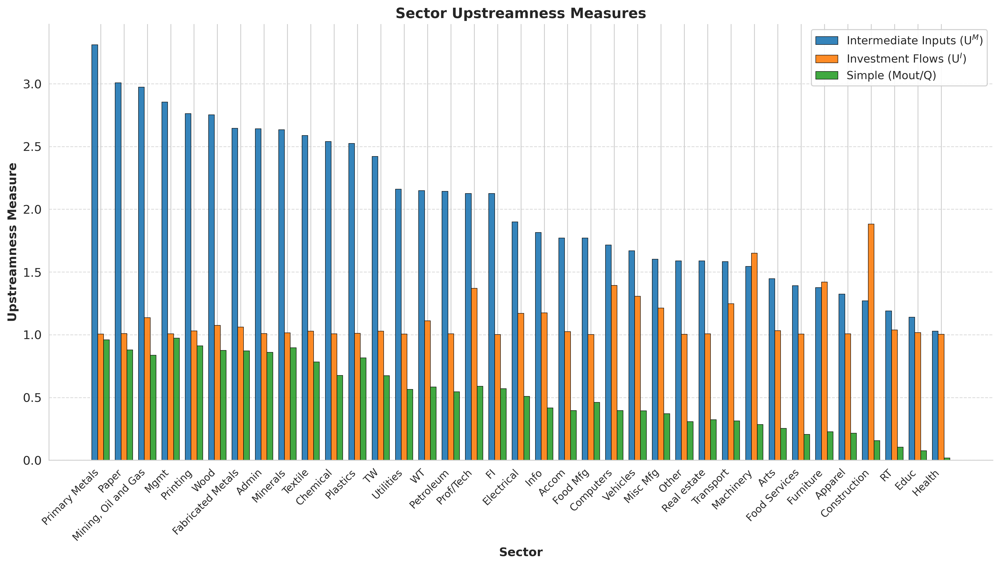

In [ ]:

def plot_upstreamness(upstreamness_data, figsize=(14, 8), save_path=None):
    """
    Create a publication-quality bar graph of upstreamness measures.

    Parameters:
    -----------
    upstreamness_data : dict
        Dictionary containing 'sectors', 'U_M', 'U_I', and 'U_simple' as returned by the upstreamness() method
    figsize : tuple, optional
        Figure size (width, height) in inches
    save_path : str, optional
        If provided, save the figure to this path

    Returns:
    --------
    fig, ax : matplotlib figure and axis objects
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import matplotlib.ticker as mtick

    # Extract data
    sectors = upstreamness_data['sectors']
    U_M = upstreamness_data['U_M']
    U_I = upstreamness_data['U_I']
    U_simple = upstreamness_data['U_simple']

    # Sort sectors by U_M upstreamness for better visualization
    sorted_indices = np.argsort(U_M)[::-1]  # Sort in descending order
    sorted_sectors = [sectors[i] for i in sorted_indices]
    sorted_U_M = U_M[sorted_indices]
    sorted_U_I = U_I[sorted_indices]
    sorted_U_simple = U_simple[sorted_indices]

    # Create figure and axis
    fig, ax = plt.subplots(figsize=figsize, dpi=300)

    # Set bar width and positions
    bar_width = 0.25
    x = np.arange(len(sorted_sectors))

    # Create bars
    bars1 = ax.bar(x - bar_width, sorted_U_M, bar_width, label='Intermediate Inputs (U$^M$)',
                  color='#1f77b4', alpha=0.9, edgecolor='black', linewidth=0.5)
    bars2 = ax.bar(x, sorted_U_I, bar_width, label='Investment Flows (U$^I$)',
                  color='#ff7f0e', alpha=0.9, edgecolor='black', linewidth=0.5)
    bars3 = ax.bar(x + bar_width, sorted_U_simple, bar_width, label='Simple (Mout/Q)',
                  color='#2ca02c', alpha=0.9, edgecolor='black', linewidth=0.5)

    # Add sector labels on x-axis
    ax.set_xticks(x)
    ax.set_xticklabels(sorted_sectors, rotation=45, ha='right', fontsize=10)

    # Add grid for y-axis only
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    # Set labels and title
    ax.set_xlabel('Sector', fontsize=12, fontweight='bold')
    ax.set_ylabel('Upstreamness Measure', fontsize=12, fontweight='bold')
    ax.set_title('Sector Upstreamness Measures', fontsize=14, fontweight='bold')

    # Add legend
    ax.legend(fontsize=11, frameon=True, framealpha=0.9, loc='upper right')

    # Style the figure
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.tight_layout()

    # Optional: Save figure
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    return fig, ax

# Compute upstreamness measures
model = Model()
upstreamness_data = model.upstreamness()

# Create and display the plot
fig, ax = plot_upstreamness(upstreamness_data, figsize=(14, 8))
plt.show()

# Optionally save the figure
# fig.savefig('sector_upstreamness.pdf', bbox_inches='tight')

# Create Simulation function

In [ ]:
def create_episode_simul_fn(env, config):

  if config["proxy_sampler"]:
    def sample_epis_obs(train_state, epis_rng):
      "sample obs of an episode"
      init_obs = env.initial_obs(epis_rng, config["init_range"])
      period_rngs = random.split(epis_rng, config["periods_per_epis"])
      def period_step(env_obs, period_rng):
        policy = train_state.apply_fn(train_state.params, env_obs)
        period_shock = config["simul_vol_scale"]*env.sample_shock(period_rng)     # Sample next obs
        obs_next = env.step_loglinear(env_obs, period_shock)                      # apply period steps.
        return obs_next, (obs_next, policy) # we pass it two times because of the syntax of the lax.scan loop
      _, (epis_obs, policies) = lax.scan(period_step, init_obs, jnp.stack(period_rngs)) # we get the obs_batch
      return (epis_obs, policies)

  elif config["loglinear_policy"]:
    def sample_epis_obs(train_state, epis_rng):
      "sample obs of an episode"
      init_obs = env.initial_obs(epis_rng, config["init_range"])
      period_rngs = random.split(epis_rng, config["periods_per_epis"])
      def period_step(env_obs, period_rng):
        policy = env.policy_loglinear(env_obs)
        period_shock = config["simul_vol_scale"]*env.sample_shock(period_rng)     # Sample next obs
        obs_next = env.step_loglinear(env_obs, period_shock)                      # apply period steps.
        return obs_next, (obs_next, policy) # we pass it two times because of the syntax of the lax.scan loop
      _, (epis_obs, policies) = lax.scan(period_step, init_obs, jnp.stack(period_rngs)) # we get the obs_batch
      return (epis_obs, policies)

  elif config["CD_policy"]:
    def sample_epis_obs(train_state, epis_rng):
      "sample obs of an episode"
      init_obs = env.initial_obs(epis_rng, config["init_range"])
      period_rngs = random.split(epis_rng, config["periods_per_epis"])
      def period_step(env_obs, period_rng):
        policy = env.policy_CD(env_obs)
        period_shock = config["simul_vol_scale"]*env.sample_shock(period_rng)     # Sample next obs
        obs_next = env.step_CD(env_obs, period_shock)                      # apply period steps.
        return obs_next, (obs_next, policy) # we pass it two times because of the syntax of the lax.scan loop
      _, (epis_obs, policies) = lax.scan(period_step, init_obs, jnp.stack(period_rngs)) # we get the obs_batch
      return (epis_obs, policies)

  else:
    def sample_epis_obs(train_state, epis_rng):
      "sample obs of an episode"
      init_obs = env.initial_obs(epis_rng, config["init_range"])
      period_rngs = random.split(epis_rng, config["periods_per_epis"])
      def period_step(env_obs, period_rng):
        policy = train_state.apply_fn(train_state.params, env_obs)
        period_shock = config["simul_vol_scale"]*env.sample_shock(period_rng)     # Sample next obs
        obs_next = env.step(env_obs, policy, period_shock)  # apply period steps.
        return obs_next, (obs_next, policy) # we pass it two times because of the syntax of the lax.scan loop
      _, (epis_obs, policies) = lax.scan(period_step, init_obs, jnp.stack(period_rngs)) # we get the obs_batch
      return epis_obs, policies



  return sample_epis_obs

# Simulate


In [ ]:

# CONFIG SIMUL FUNCTION
config_simul = {
    "model_name": model_name,
    "save_dir": working_dir + "Experiments/",
    # "restore_exper_name": "baseline_truedrive_v3_finetune",
    "restore_exper_name": restore_exper_name,
    "periods_per_epis": 100000,      # periods
    "simul_vol_scale": 1,
    "proxy_sampler": False,    # use a proxy (e.g. loglinear policy) to control simulation
    "proxy_mcsampler": False, # use a proxy to control monte-carlo sampling
    "proxy_futurepol": False,  # use a proxy to control future policy inside monte-carlo sampling
    "loglinear_policy": False,
    "CD_policy": False,
    "layers": exper_config["layers"],              # layers of the NN
    "init_range": 0,
    "seed": 4,
}

config_simul_lowvol = config_simul.copy()
config_simul_lowvol["restore_exper_name"] = restore_exper_name_lowvol
config_simul_highvol = config_simul.copy()
config_simul_highvol["restore_exper_name"] = restore_exper_name_highvol
config_loglinear = config_simul.copy()
config_loglinear["loglinear_policy"] = True

# CREATE MODEL
env = Model()

# RESTORE NEURAL NET
nn_simul = NeuralNet(config_simul["layers"] + [env.n_actions], C,D,policies_sd)
train_state_restored = checkpoints.restore_checkpoint(ckpt_dir=config_simul["save_dir"]+config_simul["restore_exper_name"], target = None)
params = train_state_restored["params"]
opt_state = train_state_restored["opt_state"]
train_state = TrainState.create(apply_fn=nn_simul.apply, params=params, tx=optax.adam(0.05))
train_state.replace(opt_state=opt_state)

train_state_restored_lowvol = checkpoints.restore_checkpoint(ckpt_dir=config_simul["save_dir"]+config_simul_lowvol["restore_exper_name"], target = None, parallel=False)
params_lowvol = train_state_restored_lowvol["params"]
opt_state_lowvol = train_state_restored_lowvol["opt_state"]
train_state_lowvol = TrainState.create(apply_fn=nn_simul.apply, params=params_lowvol, tx=optax.adam(0.05))
train_state_lowvol.replace(opt_state=opt_state_lowvol)

train_state_restored_highvol = checkpoints.restore_checkpoint(ckpt_dir=config_simul["save_dir"]+config_simul_highvol["restore_exper_name"], target = None, parallel=False)
params_highvol = train_state_restored_highvol["params"]
opt_state_highvol = train_state_restored_highvol["opt_state"]
train_state_highvol = TrainState.create(apply_fn=nn_simul.apply, params=params_highvol, tx=optax.adam(0.05))
train_state_highvol.replace(opt_state=opt_state_highvol)

# GET SIMUL FUNCTION
rng_simul = random.PRNGKey(config_simul["seed"])
simul_fn = jax.jit(create_episode_simul_fn(env, config_simul))
simul_fn_lowvol = jax.jit(create_episode_simul_fn(env, config_simul_lowvol))
simul_fn_highvol = jax.jit(create_episode_simul_fn(env, config_simul_highvol))
simul_fn_loglinear = jax.jit(create_episode_simul_fn(env, config_loglinear))

# RUN SIMUL
simul_obs, simul_policies = simul_fn(train_state, rng_simul)
simul_obs_lowvol, simul_policies_lowvol = simul_fn_lowvol(train_state_lowvol, rng_simul)
simul_obs_highvol, simul_policies_highvol = simul_fn_highvol(train_state_highvol, rng_simul)
simul_obs_loglinear, simul_policies_loglinear = simul_fn_loglinear(train_state, rng_simul)



/usr/local/lib/python3.12/dist-packages/orbax/checkpoint/_src/serialization/type_handlers.py:1269: UserWarning: Sharding info not provided when restoring. Populating sharding info from sharding file. Please note restoration time will be slightly increased due to reading from file. Note also that this option is unsafe when restoring on a different topology than the checkpoint was saved with.
  warnings.warn(


Next, we extract relevant variables that we want to analyze

# Stochastic Steady State

In [ ]:
def random_draws(simul_obs, n_draws, seed=0):
    n_simul = simul_obs.shape[0]
    key = jax.random.PRNGKey(seed)
    indices = jax.random.choice(key, n_simul, shape=(n_draws,), replace=False)
    obs_draws = simul_obs[indices, :]
    return obs_draws

def simul_traject_lastobs(env, train_state, shocks, obs_init):
  def step(obs, shock):
    policy = train_state.apply_fn(train_state.params, obs)
    next_obs = env.step(obs, policy, shock)
    obs_pol_pair = (obs,policy)
    return next_obs, obs_pol_pair
  final_obs, _ = lax.scan(step, obs_init, shocks)
  return final_obs

sample_fromdist = random_draws(simul_obs, 1000)
sample_fromdist_lowvol = random_draws(simul_obs_lowvol, 1000)
sample_fromdist_highvol = random_draws(simul_obs_highvol, 1000)
zero_shocks = jnp.zeros(shape=(300,env.n_sectors), dtype = precision)

stoch_ss = jax.vmap(simul_traject_lastobs, in_axes = (None,None,None,0))(env,train_state,zero_shocks,sample_fromdist)
stoch_ss = jnp.mean(stoch_ss, axis=0)
stoch_ss_notnorm = stoch_ss*env.obs_sd
policy_stoch_ss = train_state.apply_fn(train_state.params, stoch_ss)
policy_stoch_ss_notnorm = policy_stoch_ss * env.policies_sd
agg_stoch_ss = policy_stoch_ss_notnorm[-5:]

stoch_ss_lowvol = jax.vmap(simul_traject_lastobs, in_axes = (None,None,None,0))(env,train_state_lowvol,zero_shocks,sample_fromdist_lowvol)
stoch_ss_lowvol = jnp.mean(stoch_ss_lowvol, axis=0)
stoch_ss_notnorm_lowvol = stoch_ss_lowvol*env.obs_sd
policy_stoch_ss_lowvol = train_state_lowvol.apply_fn(train_state_lowvol.params, stoch_ss_lowvol)
policy_stoch_ss_notnorm_lowvol = policy_stoch_ss_lowvol * env.policies_sd
agg_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[-5:]

stoch_ss_highvol = jax.vmap(simul_traject_lastobs, in_axes = (None,None,None,0))(env,train_state_highvol,zero_shocks,sample_fromdist_highvol)
stoch_ss_highvol = jnp.mean(stoch_ss_highvol, axis=0)
stoch_ss_notnorm_highvol = stoch_ss_highvol*env.obs_sd
policy_stoch_ss_highvol = train_state_highvol.apply_fn(train_state_highvol.params, stoch_ss_highvol)
policy_stoch_ss_notnorm_highvol = policy_stoch_ss_highvol * env.policies_sd
agg_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[-5:]


## Aggregation

In [ ]:
# For aggregation later
P_stochss = jnp.exp(policy_stoch_ss_notnorm[8*env.n_sectors:9*env.n_sectors] + env.policies_ss[8*env.n_sectors:9*env.n_sectors])
Pk_stochss = jnp.exp(policy_stoch_ss_notnorm[2*env.n_sectors:3*env.n_sectors] + env.policies_ss[2*env.n_sectors:3*env.n_sectors])
Pm_stochss = jnp.exp(policy_stoch_ss_notnorm[3*env.n_sectors:4*env.n_sectors]  +env.policies_ss[3*env.n_sectors:4*env.n_sectors])

Pk_stochss_loglevel = policy_stoch_ss[2*env.n_sectors:3*env.n_sectors]
K_detss = jnp.exp(env.obs_ss[:37])


Kdevs_stochss = stoch_ss_notnorm[:37]
K_stochss = jnp.exp(Kdevs_stochss + env.obs_ss[:37])
Kagg_detss = jnp.dot(K_detss,Pk_stochss)
Kagg_stochss = jnp.dot(K_stochss,Pk_stochss)
Kagg_devs = jnp.log(Kagg_stochss/Kagg_detss)


Kdevs_stochss_lowvol = stoch_ss_notnorm_lowvol[:37]
K_stochss_lowvol = jnp.exp(Kdevs_stochss_lowvol + env.obs_ss[:37])
Kagg_stochss_lowvol = jnp.dot(K_stochss_lowvol,Pk_stochss)
Kagg_detss = jnp.dot(K_detss,Pk_stochss)
Kagg_devs_lowvol = jnp.log(Kagg_stochss_lowvol/Kagg_detss)


Kdevs_stochss_highvol = stoch_ss_notnorm_highvol[:37]
K_stochss_highvol = jnp.exp(Kdevs_stochss_highvol + env.obs_ss[:37])
Kagg_stochss_highvol = jnp.dot(K_stochss_highvol,Pk_stochss)
Kagg_detss = jnp.dot(K_detss,Pk_stochss)
Kagg_devs_highvol = jnp.log(Kagg_stochss_highvol/Kagg_detss)



In [ ]:
obs_stochss_logs = stoch_ss*env.obs_sd+env.obs_ss
obs_stochss_logs_np = np.array(obs_stochss_logs)
policy_stochss_logs = policy_stoch_ss*env.policies_sd+policy_stoch_ss
print(policy_stochss_logs)
policy_stochss_logs_np = np.array(policy_stochss_logs)

np.savetxt(config_simul['save_dir'] + config_simul['restore_exper_name'] + f'/obs_stochss.csv', obs_stochss_logs_np, delimiter=',')
np.savetxt(config_simul['save_dir'] + config_simul['restore_exper_name'] + f'/policies_stochss.csv', policy_stochss_logs_np, delimiter=',')

[ 0.0658646   0.1109881   0.08219625  0.18125802  0.08892838  0.08941763
  0.06797583  0.01378897  0.0775505   0.0963461   0.07427545  0.08060127
  0.12421543  0.09944937  0.09547857  0.11210669  0.13045107  0.09544874
  0.12402261  0.13276212  0.08551209  0.08545555  0.10136739  0.09501522
  0.11074338  0.09251526  0.12329085  0.09494446  0.12931359  0.05859608
  0.11584472  0.08638577  0.12793481  0.12368959  0.14473332  0.11258989
  0.07746961 -0.01648897  0.04885862  0.09591631  0.00423198  0.08940578
  0.04329178  0.15475151  0.12666074  0.0563019   0.06223748  0.04780474
  0.05564288  0.10764037  0.09028737  0.11175593  0.04225951  0.10043767
  0.04536519  0.06964887 -0.05376428  0.05358023  0.06977876  0.08635055
  0.13249988  0.09708154  0.04791806  0.04894091  0.10923208  0.10171142
  0.09676557  0.07264775  0.13501401  0.11778969  0.08486683  0.07233755
  0.09908557  0.16975184 -0.07449611 -0.10443288 -0.11730278 -0.14826686
 -0.09279089 -0.09478831 -0.09257372 -0.12068416 -0

Table for aggregates:

In [ ]:

# table_data = agg_stoch_ss
# print(table_data)
table_titles = ["", "Consumption", "Labor", "GDP", "Investment",  "Intermediates", "Capital"]
table_data_strings = ["Baseline"] + [str(round(float(value),4)) for value in agg_stoch_ss]+[str(round(float(Kagg_devs),4))]
table_data_strings_lowvol = ["Low Volatility"] + [str(round(float(value),4)) for value in agg_stoch_ss_lowvol]+[str(round(float(Kagg_devs_lowvol),4))]
table_data_strings_highvol = ["High Volatility"] + [str(round(float(value),4)) for value in agg_stoch_ss_highvol]+[str(round(float(Kagg_devs_highvol),4))]

# Initialize the LaTeX table string
latex_table = "\\begin{tabular}{" + "c" * 6 + "}\n\\hline\n"

# Add column titles
latex_table += " & ".join(table_titles) + " \\\\\n\\hline\n"

# Add rows of values
latex_table += " & ".join(table_data_strings_lowvol) +  " \\\\\n"
latex_table += " & ".join(table_data_strings) +  " \\\\\n"
latex_table += " & ".join(table_data_strings_highvol) +  " \\\\\n"

# End the table
latex_table += "\\hline\n \\end{tabular}"

# Print the LaTeX table string
print(latex_table)
latex_filename = config_simul['save_dir'] + config_simul['restore_exper_name'] + f'/stoch_ss_table.tex'

# Save the LaTeX code to the specified file
with open(latex_filename, 'w') as file:
    file.write(latex_table)

\begin{tabular}{cccccc}
\hline
 & Consumption & Labor & GDP & Investment & Intermediates & Capital \\
\hline
Low Volatility & 0.0041 & 0.0017 & 0.0029 & 0.0047 & 0.0045 & 0.0052 \\
Baseline & 0.0043 & 0.0018 & 0.0023 & 0.0046 & 0.0047 & 0.0063 \\
High Volatility & 0.005 & 0.0022 & 0.0023 & 0.0059 & 0.0058 & 0.009 \\
\hline
 \end{tabular}


Distribution of variables in stochastic steady state

In [ ]:

labels = [
    'Mining, Oil and Gas', 'Utilities', 'Construction', 'Wood', 'Minerals', 'Primary Metals',
    'Fabricated Metals', 'Machinery', 'Computers', 'Electrical', 'Vehicles',
    'Transport', 'Furniture', 'Misc Mfg', 'Food Mfg', 'Textile', 'Apparel',
    'Paper', 'Printing', 'Petroleum', 'Chemical', 'Plastics', 'Wholesale Trade', 'Retail', 'Transp. and Wareh.',
    'Info', 'Finance', 'Real estate', 'Prof/Tech', 'Mgmt', 'Admin', 'Educ', 'Health',
    'Arts', 'Accom', 'Food Services', 'Other'
]

# extract stochastic steady state variables
K_stoch_ss =stoch_ss_notnorm[:37]
C_stoch_ss = policy_stoch_ss_notnorm[:env.n_sectors]
L_stoch_ss = policy_stoch_ss_notnorm[env.n_sectors:2*env.n_sectors]
Pk_stoch_ss = policy_stoch_ss_notnorm[2*env.n_sectors:3*env.n_sectors]
Pm_stoch_ss = policy_stoch_ss_notnorm[3*env.n_sectors:4*env.n_sectors]
M_stoch_ss = policy_stoch_ss_notnorm[4*env.n_sectors:5*env.n_sectors]
Mout_stoch_ss = policy_stoch_ss_notnorm[5*env.n_sectors:6*env.n_sectors]
I_stoch_ss = policy_stoch_ss_notnorm[6*env.n_sectors:7*env.n_sectors]
Iout_stoch_ss = policy_stoch_ss_notnorm[7*env.n_sectors:8*env.n_sectors]
P_stoch_ss = policy_stoch_ss_notnorm[8*env.n_sectors:9*env.n_sectors]
Q_stoch_ss = policy_stoch_ss_notnorm[9*env.n_sectors:10*env.n_sectors]
Y_stoch_ss = policy_stoch_ss_notnorm[10*env.n_sectors:11*env.n_sectors]
Cagg_stoch_ss = policy_stoch_ss_notnorm[11*env.n_sectors]
Lagg_stoch_ss = policy_stoch_ss_notnorm[11*env.n_sectors+1]
Yagg_stoch_ss = policy_stoch_ss_notnorm[11*env.n_sectors+2]
Iagg_stoch_ss = policy_stoch_ss_notnorm[11*env.n_sectors+3]
Magg_stoch_ss = policy_stoch_ss_notnorm[11*env.n_sectors+4]

K_stoch_ss_lowvol =stoch_ss_notnorm_lowvol[:37]
C_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[:env.n_sectors]
L_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[env.n_sectors:2*env.n_sectors]
Pk_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[2*env.n_sectors:3*env.n_sectors]
Pm_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[3*env.n_sectors:4*env.n_sectors]
M_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[4*env.n_sectors:5*env.n_sectors]
Mout_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[5*env.n_sectors:6*env.n_sectors]
I_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[6*env.n_sectors:7*env.n_sectors]
Iout_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[7*env.n_sectors:8*env.n_sectors]
P_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[8*env.n_sectors:9*env.n_sectors]
Q_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[9*env.n_sectors:10*env.n_sectors]
Y_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[10*env.n_sectors:11*env.n_sectors]
Cagg_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[11*env.n_sectors]
Lagg_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[11*env.n_sectors+1]
Yagg_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[11*env.n_sectors+2]
Iagg_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[11*env.n_sectors+3]
Magg_stoch_ss_lowvol = policy_stoch_ss_notnorm_lowvol[11*env.n_sectors+4]

K_stoch_ss_highvol =stoch_ss_notnorm_highvol[:37]
C_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[:env.n_sectors]
L_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[env.n_sectors:2*env.n_sectors]
Pk_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[2*env.n_sectors:3*env.n_sectors]
Pm_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[3*env.n_sectors:4*env.n_sectors]
M_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[4*env.n_sectors:5*env.n_sectors]
Mout_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[5*env.n_sectors:6*env.n_sectors]
I_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[6*env.n_sectors:7*env.n_sectors]
Iout_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[7*env.n_sectors:8*env.n_sectors]
P_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[8*env.n_sectors:9*env.n_sectors]
Q_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[9*env.n_sectors:10*env.n_sectors]
Y_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[10*env.n_sectors:11*env.n_sectors]
Cagg_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[11*env.n_sectors]
Lagg_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[11*env.n_sectors+1]
Yagg_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[11*env.n_sectors+2]
Iagg_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[11*env.n_sectors+3]
Magg_stoch_ss_highvol = policy_stoch_ss_notnorm_highvol[11*env.n_sectors+4]


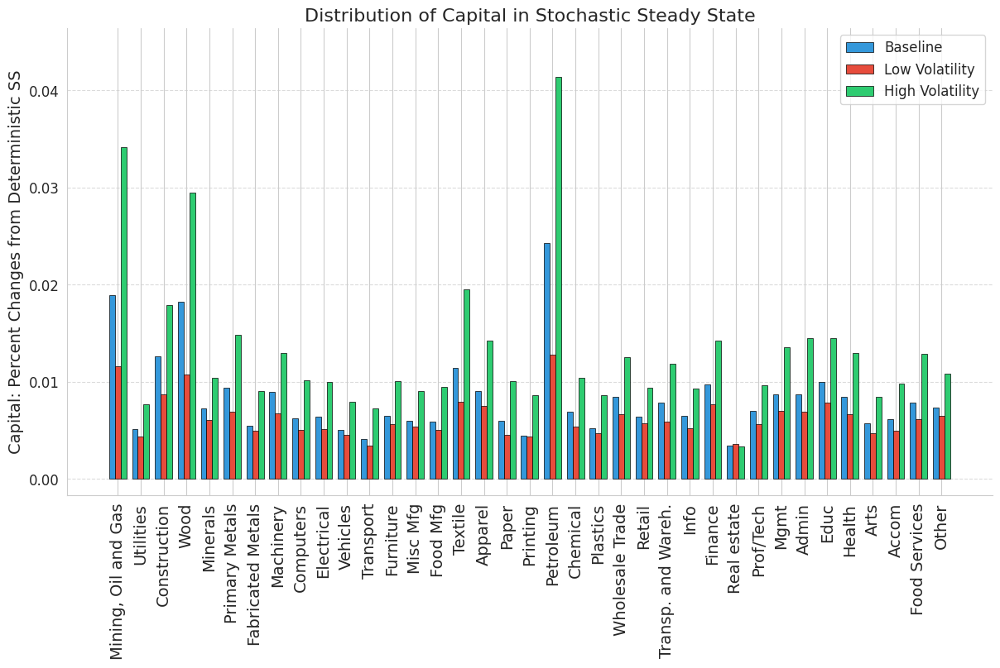

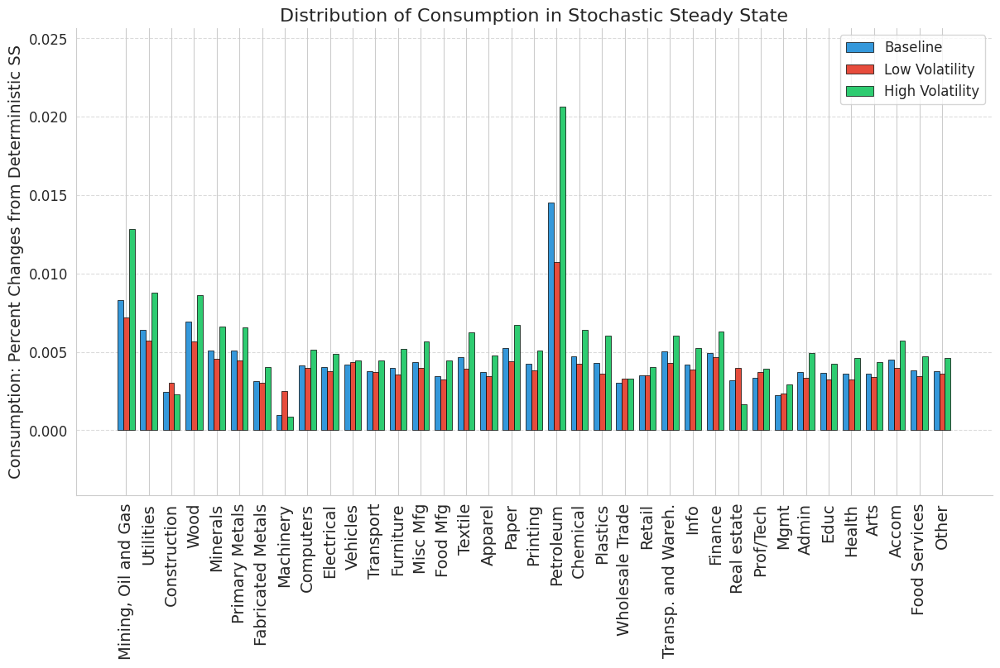

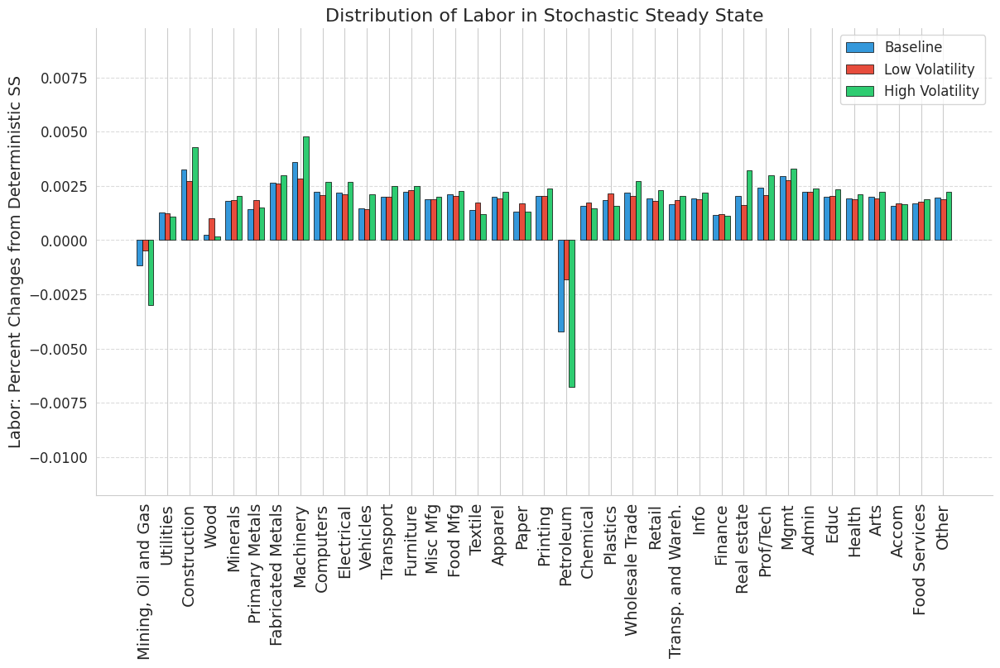

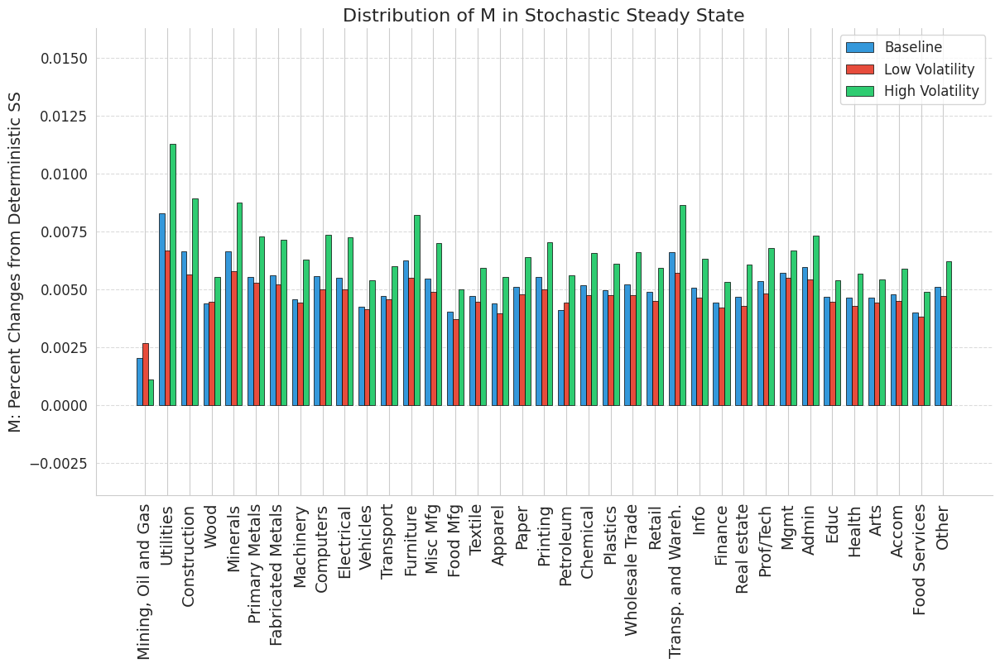

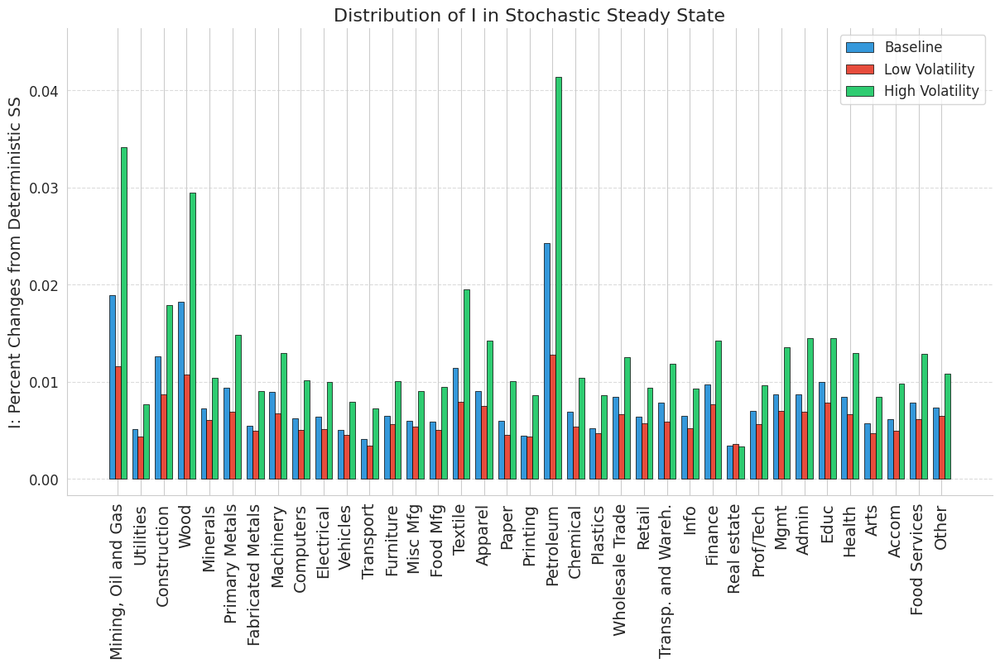

...

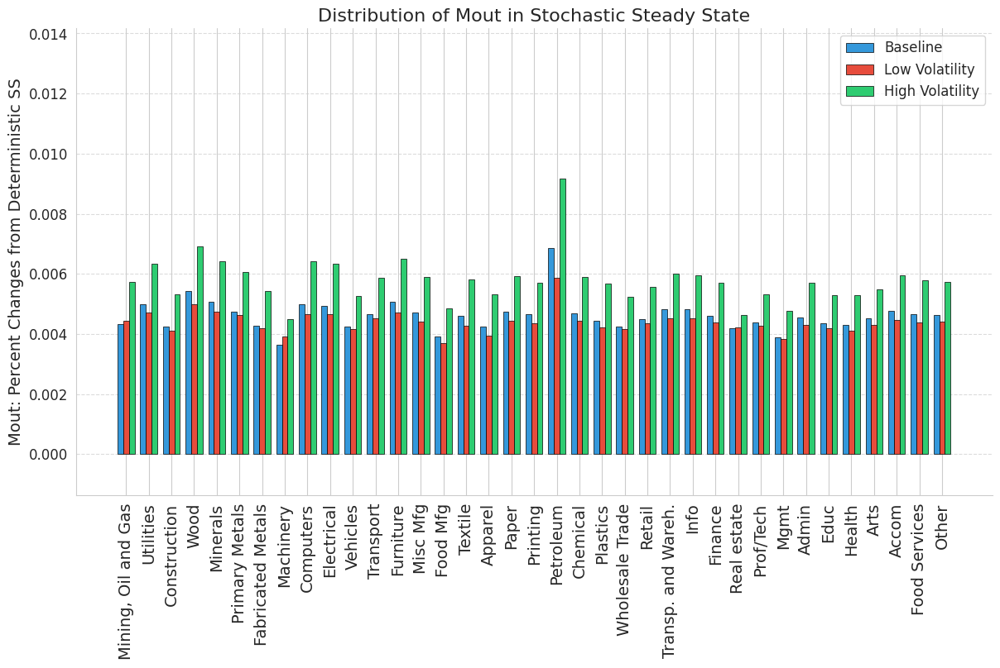

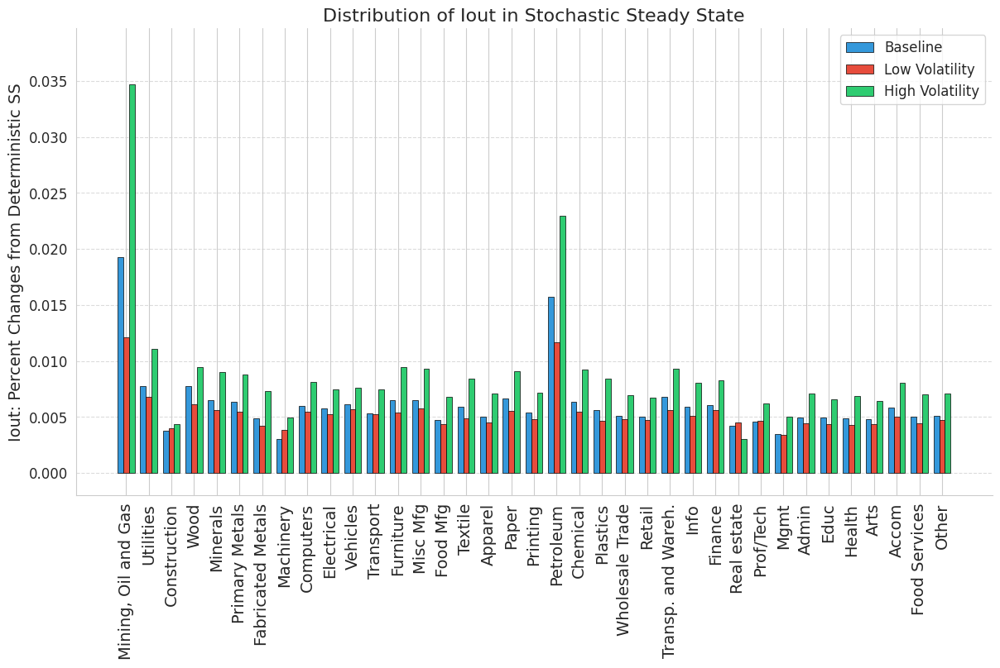

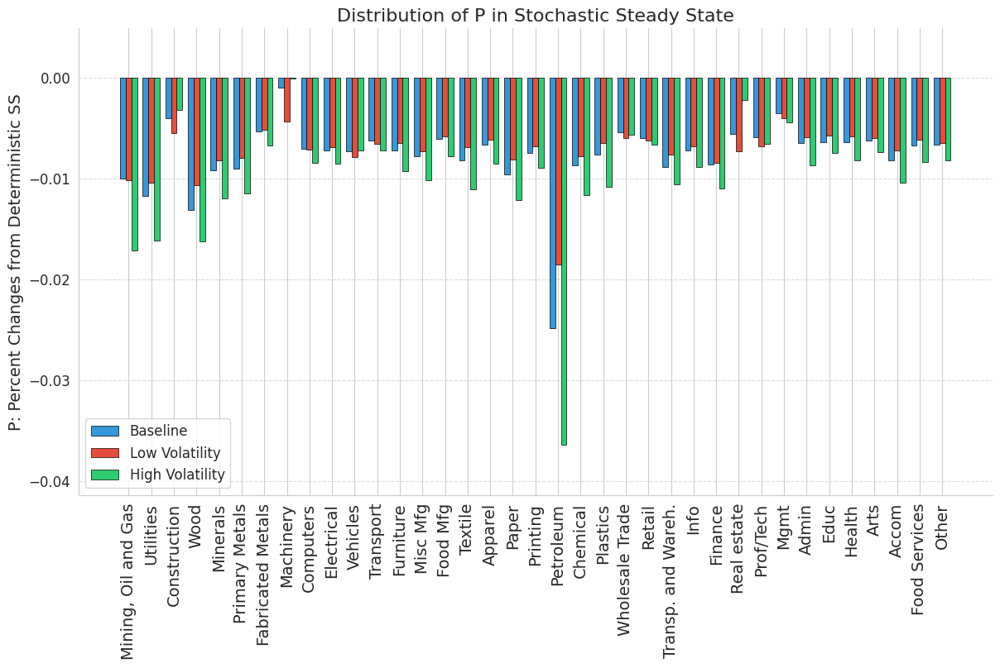

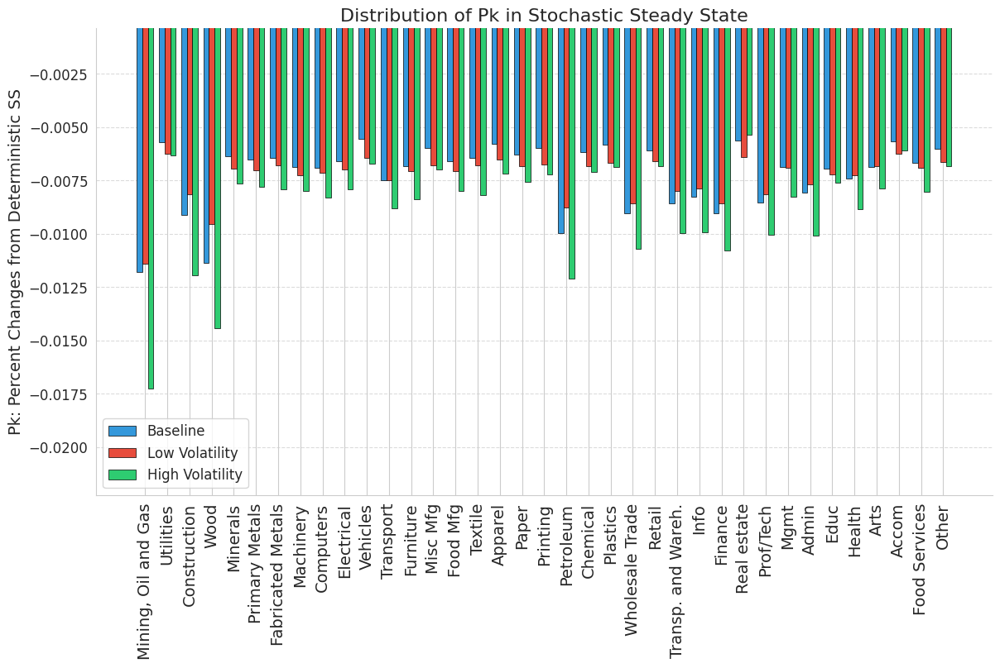

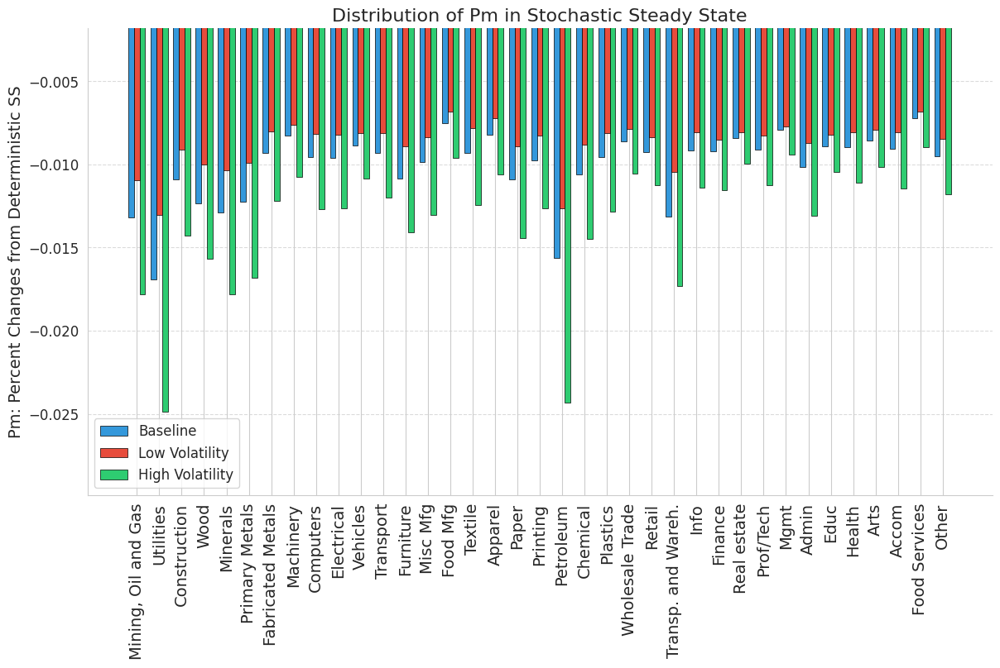

In [ ]:
def create_stochss_hist_comparative(variable_vector_1, variable_vector_2, variable_vector_3, label):
    # Create a bar chart
    fig, ax = plt.subplots(figsize=(12, 8))  # Increased vertical size
    bar_width = 0.25
    index = np.arange(len(variable_vector_1))

    bars1 = ax.bar(index - bar_width, variable_vector_1, bar_width, color='#3498db', edgecolor='black', linewidth=0.5)
    bars2 = ax.bar(index, variable_vector_2, bar_width, color='#e74c3c', edgecolor='black', linewidth=0.5)
    bars3 = ax.bar(index + bar_width, variable_vector_3, bar_width, color='#2ecc71', edgecolor='black', linewidth=0.5)

    # Extend y-axis range
    ax.set_ylim(min(min(variable_vector_1), min(variable_vector_2), min(variable_vector_3)) - 0.005,
                max(max(variable_vector_1), max(variable_vector_2), max(variable_vector_3)) + 0.005)

    # Add x-axis labels with rotation
    ax.set_xticks(index)
    ax.set_xticklabels(labels, rotation=90, ha='center', fontsize=14)  # Adjust rotation and font size as needed

    # Customize layout and display the chart
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.tight_layout()
    plt.title(f"Distribution of {label} in Stochastic Steady State")
    plt.ylabel(f'{label}: Percent Changes from Deterministic SS', fontsize=14)
    plt.legend(['Baseline', 'Low Volatility', 'High Volatility'])

    # Save figure
    fig.savefig(config_simul['save_dir'] + config_simul['restore_exper_name'] + f'/{label}_Stochastic_Steady_State_comparative.jpg', bbox_inches="tight", pad_inches=1)
    plt.show()

create_stochss_hist_comparative(K_stoch_ss, K_stoch_ss_lowvol, K_stoch_ss_highvol, "Capital")
create_stochss_hist_comparative(C_stoch_ss, C_stoch_ss_lowvol, C_stoch_ss_highvol,  "Consumption")
create_stochss_hist_comparative(L_stoch_ss, L_stoch_ss_lowvol, L_stoch_ss_highvol, "Labor")
create_stochss_hist_comparative(M_stoch_ss, M_stoch_ss_lowvol, M_stoch_ss_highvol, "M")
create_stochss_hist_comparative(I_stoch_ss, I_stoch_ss_lowvol, I_stoch_ss_highvol, "I")
create_stochss_hist_comparative(Y_stoch_ss, Y_stoch_ss_lowvol, Y_stoch_ss_highvol, "Y")
create_stochss_hist_comparative(Q_stoch_ss, Q_stoch_ss_lowvol, Q_stoch_ss_highvol, "Q")
create_stochss_hist_comparative(Mout_stoch_ss, Mout_stoch_ss_lowvol, Mout_stoch_ss_highvol, "Mout")
create_stochss_hist_comparative(Iout_stoch_ss, Iout_stoch_ss_lowvol, Iout_stoch_ss_highvol, "Iout")
create_stochss_hist_comparative(P_stoch_ss, P_stoch_ss_lowvol, P_stoch_ss_highvol, "P")
create_stochss_hist_comparative(Pk_stoch_ss, Pk_stoch_ss_lowvol, Pk_stoch_ss_highvol, "Pk")
create_stochss_hist_comparative(Pm_stoch_ss, Pm_stoch_ss_lowvol, Pm_stoch_ss_highvol, "Pm")

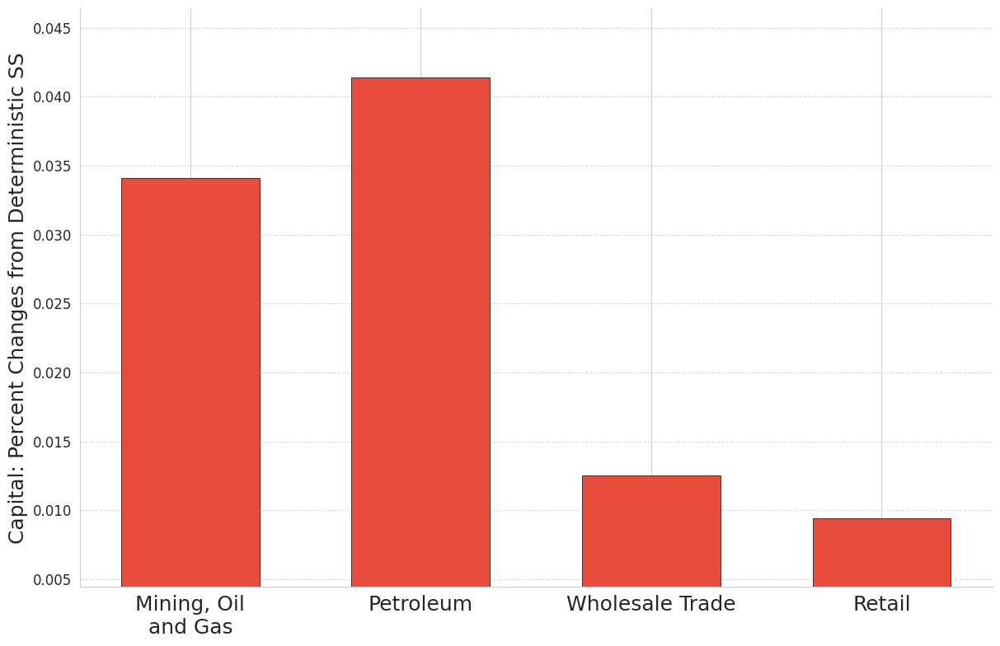

In [ ]:
def create_stochss_plot_4sec(variable_vector, label, labels):
    # Filter to include only sectors 1, 20, 23, and 24 (indices 0, 19, 22, 23)
    selected_indices = [0, 19, 22, 23]
    filtered_vector = [variable_vector[i] for i in selected_indices]
    filtered_labels = [labels[i] for i in selected_indices]

    # Create a bar chart
    fig, ax = plt.subplots(figsize=(12, 8))
    bar_width = 0.6  # Wider bars since we only have one group
    index = np.arange(len(filtered_vector))

    bars = ax.bar(index, filtered_vector, bar_width, color='#e74c3c', edgecolor='black', linewidth=0.5)

    # Extend y-axis range
    ax.set_ylim(min(filtered_vector) - 0.005, max(filtered_vector) + 0.005)

    # Add x-axis labels horizontally with word wrapping
    ax.set_xticks(index)

    # Format labels to be multiline by adding newlines every few words
    wrapped_labels = []
    for label_text in filtered_labels:
        words = label_text.split()
        # Split into chunks of 2-3 words for multiline display
        if len(words) > 3:
            wrapped = '\n'.join([' '.join(words[i:i+2]) for i in range(0, len(words), 2)])
        else:
            wrapped = label_text
        wrapped_labels.append(wrapped)

    ax.set_xticklabels(wrapped_labels, rotation=0, ha='center', fontsize=18)  # Increased font size, horizontal orientation

    # Customize layout and display the chart
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.axhline(y=0, color='black', linestyle='-', linewidth=1)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.tight_layout()
    # plt.title(f"Distribution of {label} in Stochastic Steady State", fontsize=18)
    plt.ylabel(f'{label}: Percent Changes from Deterministic SS', fontsize=18)
    # plt.legend(['High Volatility'])

    # Save figure
    fig.savefig(config_simul['save_dir'] + config_simul['restore_exper_name'] + f'/{label}_Stochastic_Steady_State_4sec.jpg', bbox_inches="tight", pad_inches=1)
    plt.show()

# Example usage
create_stochss_plot_4sec(K_stoch_ss_highvol, "Capital", labels)

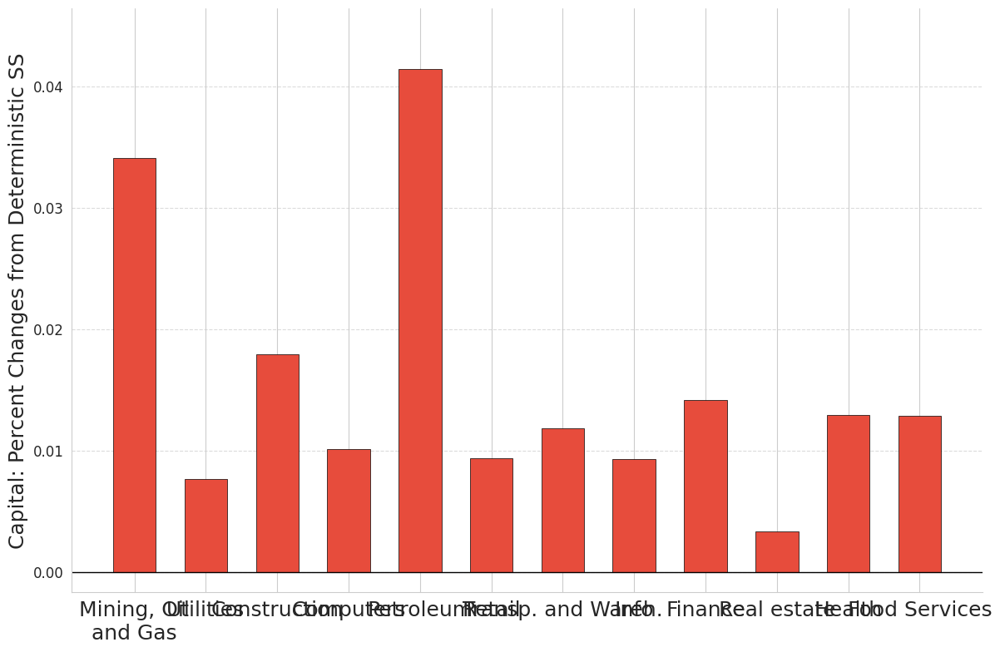

In [ ]:
def create_stochss_plot_10sec(variable_vector, label, labels):
    # Filter to include only sectors 1, 20, 23, and 24 (indices 0, 19, 22, 23)
    selected_indices = [0, 1, 2, 8, 19, 23, 24, 25,  26, 27, 32, 35]
    filtered_vector = [variable_vector[i] for i in selected_indices]
    filtered_labels = [labels[i] for i in selected_indices]

    # Create a bar chart
    fig, ax = plt.subplots(figsize=(12, 8))
    bar_width = 0.6  # Wider bars since we only have one group
    index = np.arange(len(filtered_vector))

    bars = ax.bar(index, filtered_vector, bar_width, color='#e74c3c', edgecolor='black', linewidth=0.5)

    # Extend y-axis range
    ax.set_ylim(min(filtered_vector) - 0.005, max(filtered_vector) + 0.005)

    # Add x-axis labels horizontally with word wrapping
    ax.set_xticks(index)

    # Format labels to be multiline by adding newlines every few words
    wrapped_labels = []
    for label_text in filtered_labels:
        words = label_text.split()
        # Split into chunks of 2-3 words for multiline display
        if len(words) > 3:
            wrapped = '\n'.join([' '.join(words[i:i+2]) for i in range(0, len(words), 2)])
        else:
            wrapped = label_text
        wrapped_labels.append(wrapped)

    ax.set_xticklabels(wrapped_labels, rotation=0, ha='center', fontsize=18)  # Increased font size, horizontal orientation

    # Customize layout and display the chart
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.axhline(y=0, color='black', linestyle='-', linewidth=1)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.tight_layout()
    # plt.title(f"Distribution of {label} in Stochastic Steady State", fontsize=18)
    plt.ylabel(f'{label}: Percent Changes from Deterministic SS', fontsize=18)
    # plt.legend(['High Volatility'])

    # Save figure
    fig.savefig(config_simul['save_dir'] + config_simul['restore_exper_name'] + f'/{label}_Stochastic_Steady_State_10sec.jpg', bbox_inches="tight", pad_inches=1)
    plt.show()

# Example usage
create_stochss_plot_10sec(K_stoch_ss_highvol, "Capital", labels)

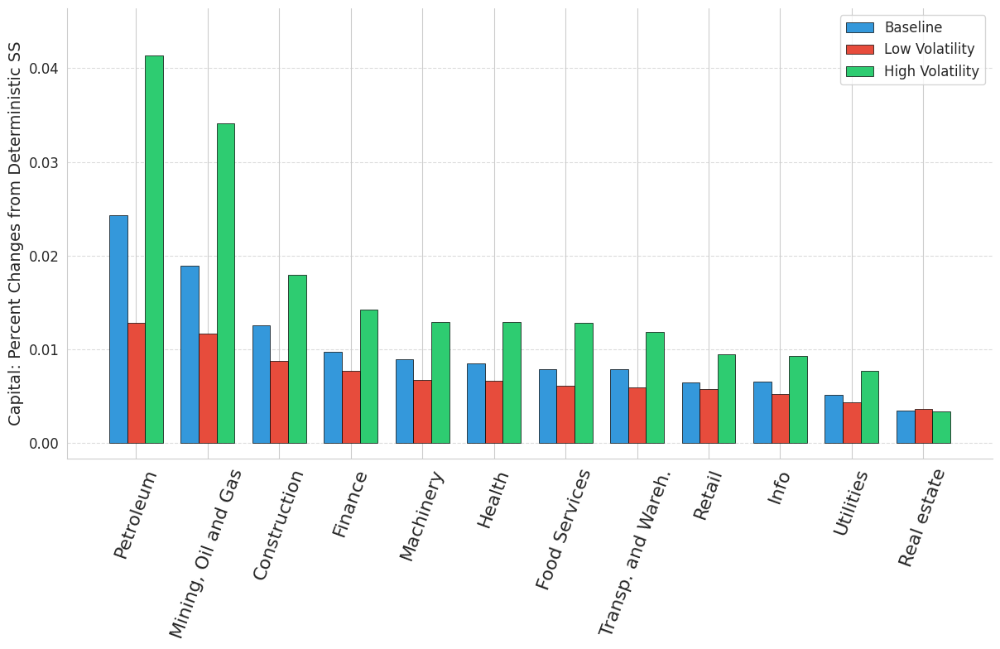

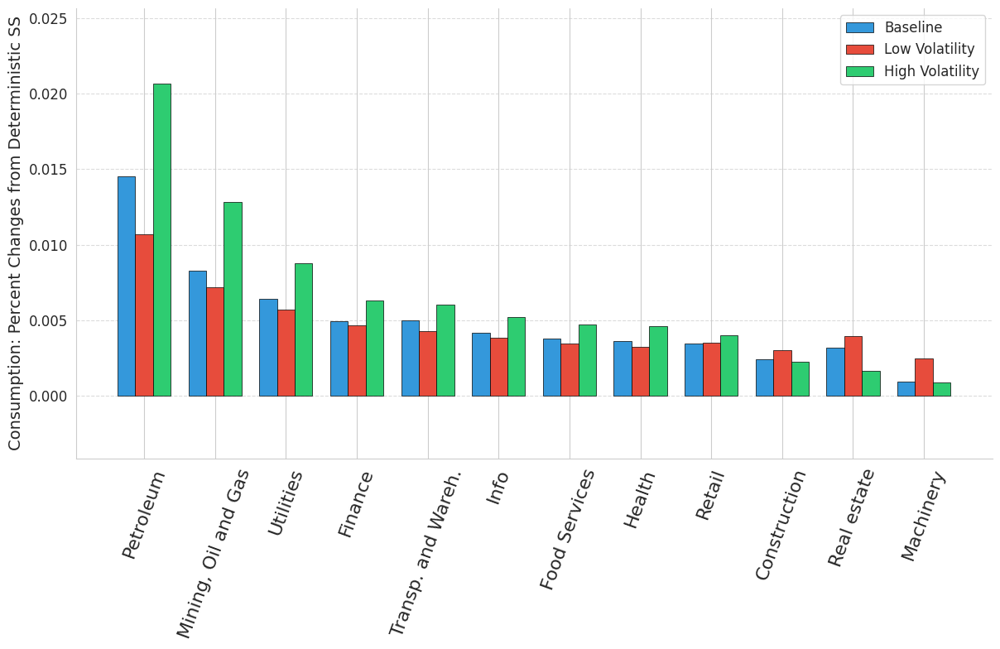

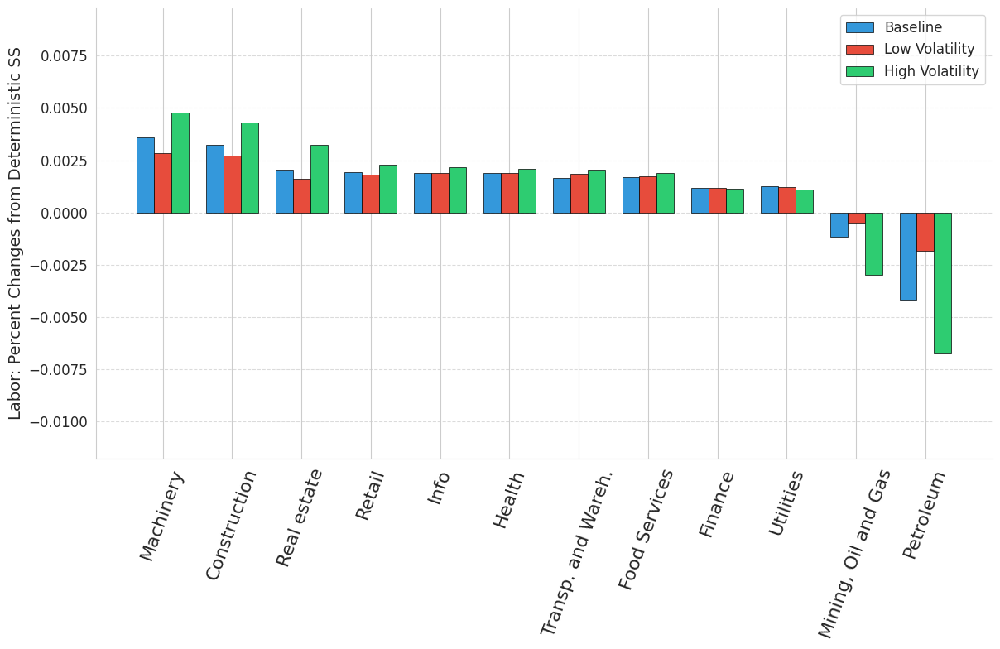

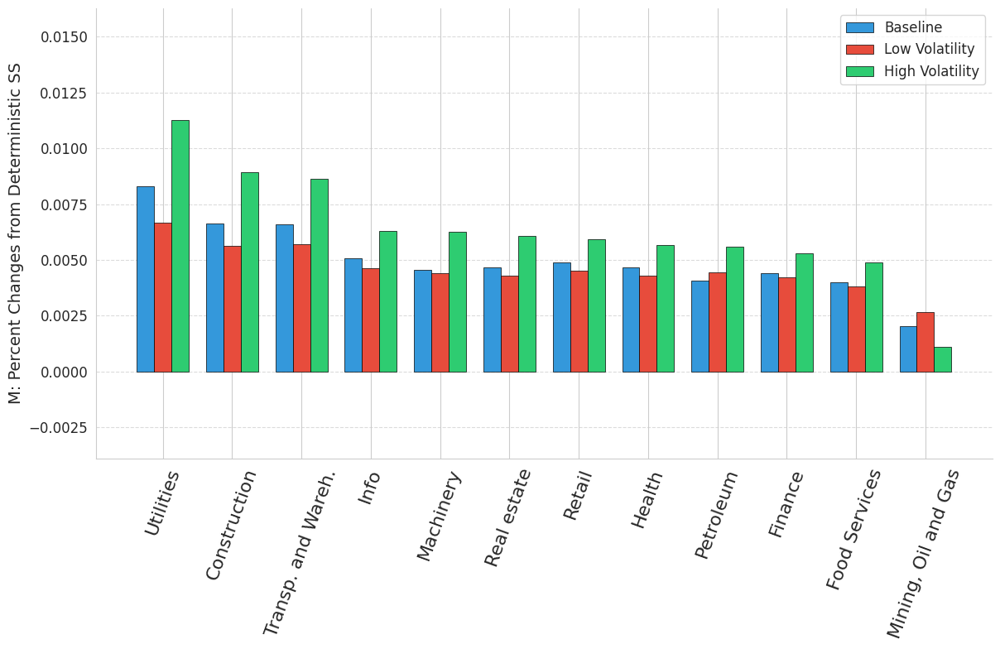

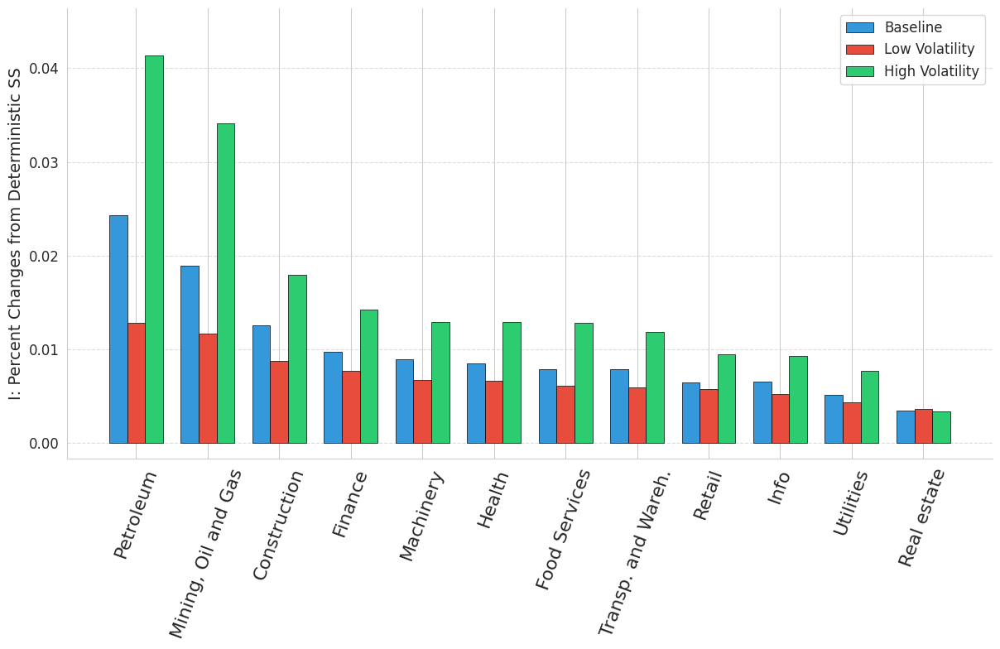

...

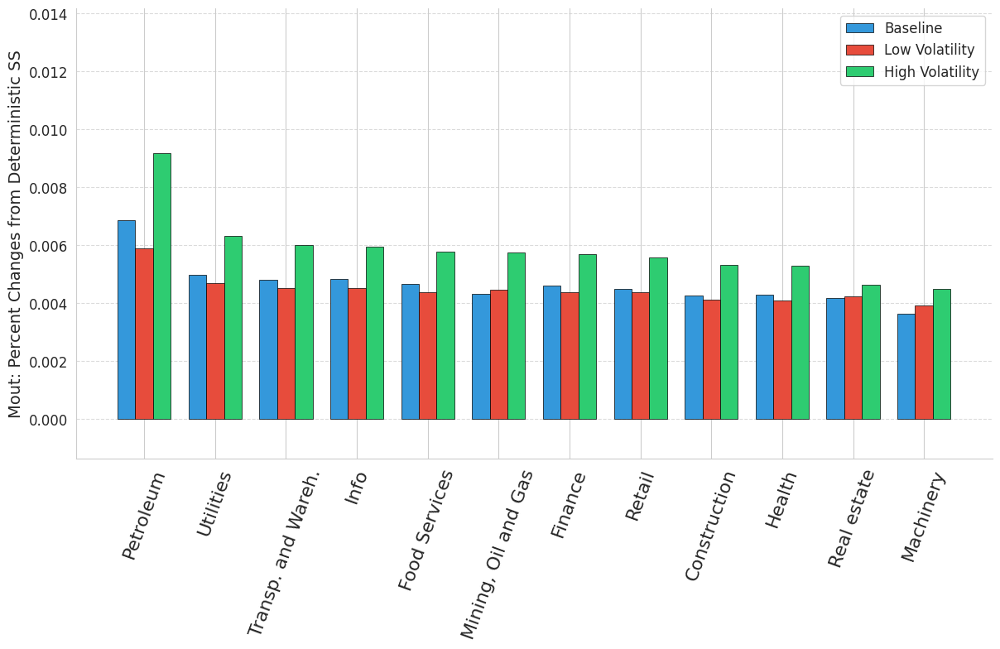

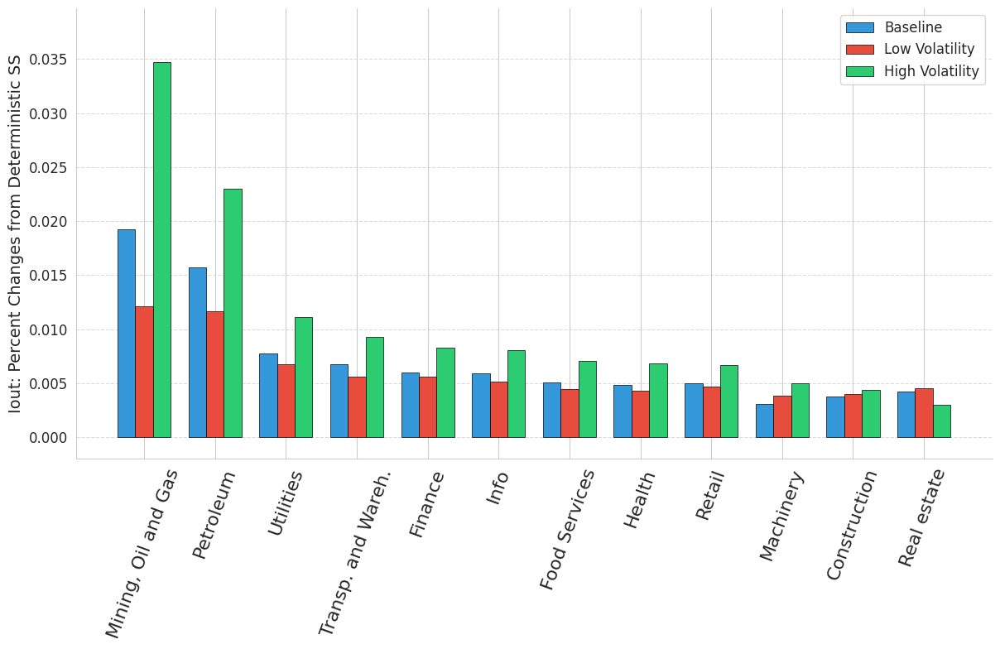

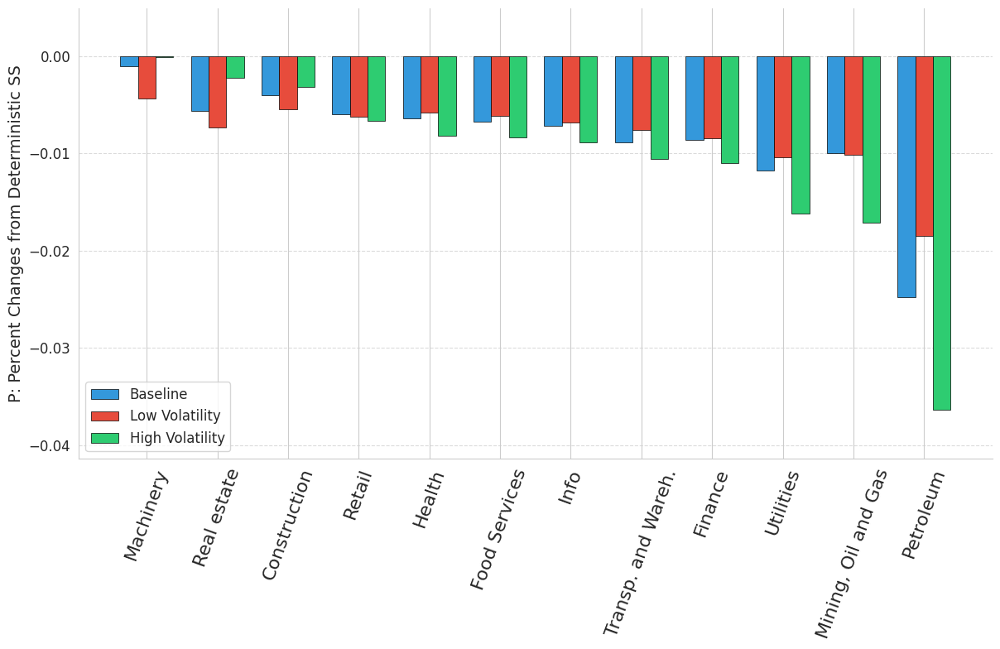

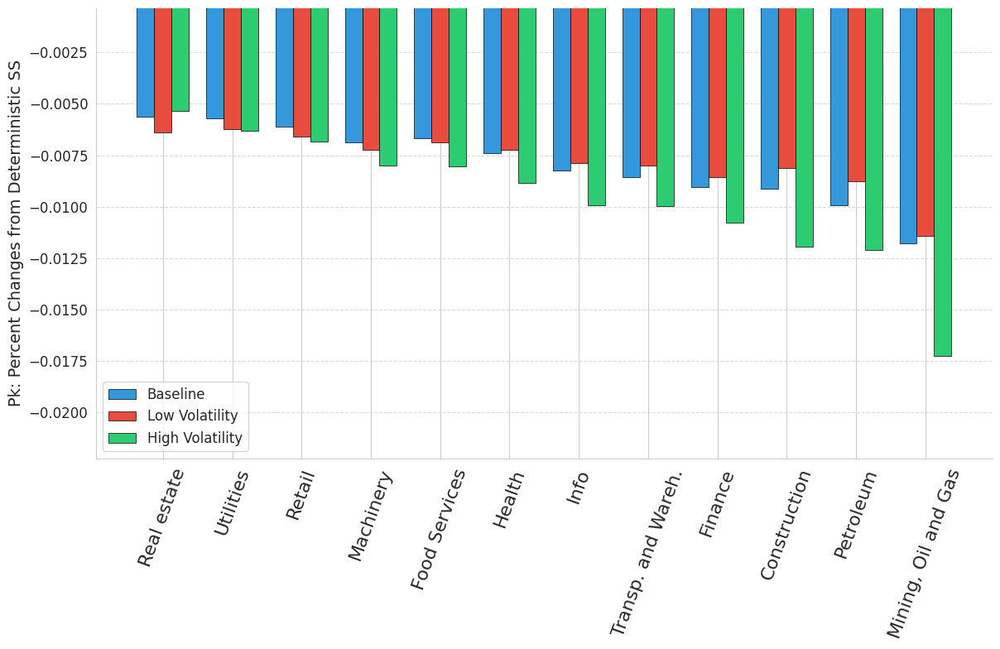

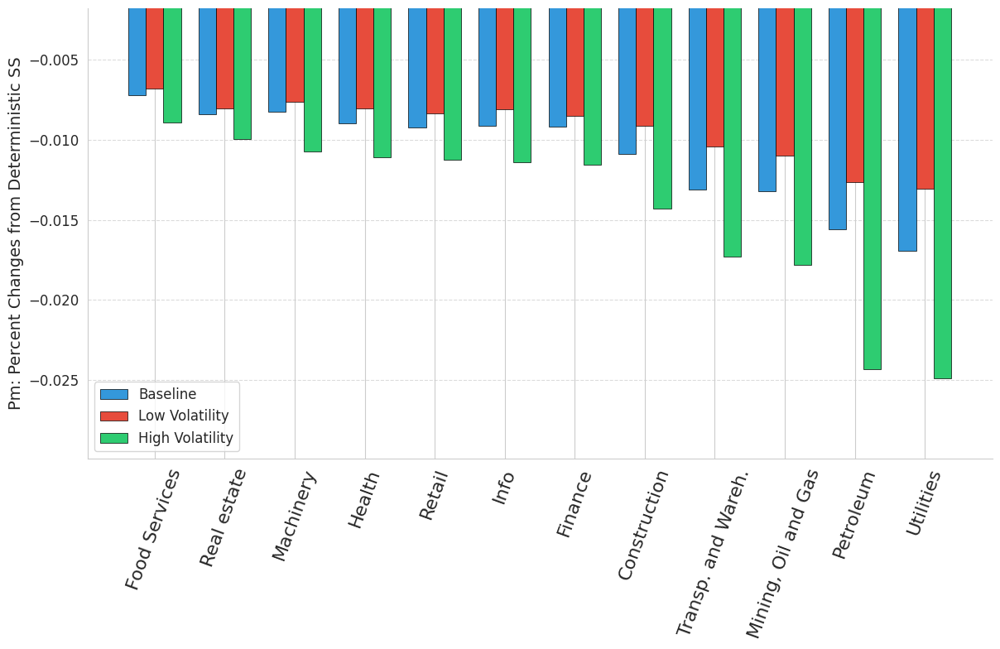

In [ ]:
def create_stochss_bars_comparative(
    variable_vector_1, variable_vector_2, variable_vector_3, save_label, sector_labels
):
    selected_indices = [0, 1, 2, 7, 19, 23, 24, 25,  26, 27, 32, 35]
    variable_vector_1 = [variable_vector_1[i] for i in selected_indices]
    variable_vector_2 = [variable_vector_2[i] for i in selected_indices]
    variable_vector_3 = [variable_vector_3[i] for i in selected_indices]
    sector_labels = [sector_labels[i] for i in selected_indices]
    # Get the sorting order based on variable_vector_3 (descending)
    sorted_indices = np.argsort(variable_vector_3)[::-1]

    # Sort all vectors and labels according to variable_vector_3
    sorted_vector_1 = np.array(variable_vector_1)[sorted_indices]
    sorted_vector_2 = np.array(variable_vector_2)[sorted_indices]
    sorted_vector_3 = np.array(variable_vector_3)[sorted_indices]
    sorted_labels = [sector_labels[i] for i in sorted_indices]

    # Create a bar chart
    fig, ax = plt.subplots(figsize=(12, 8))
    bar_width = 0.25
    index = np.arange(len(sorted_vector_1))

    bars1 = ax.bar(
        index - bar_width,
        sorted_vector_1,
        bar_width,
        color="#3498db",
        edgecolor="black",
        linewidth=0.5,
    )
    bars2 = ax.bar(
        index,
        sorted_vector_2,
        bar_width,
        color="#e74c3c",
        edgecolor="black",
        linewidth=0.5,
    )
    bars3 = ax.bar(
        index + bar_width,
        sorted_vector_3,
        bar_width,
        color="#2ecc71",
        edgecolor="black",
        linewidth=0.5,
    )

    # Update y-axis limits to use sorted vectors
    ax.set_ylim(
        min(min(sorted_vector_1), min(sorted_vector_2), min(sorted_vector_3)) - 0.005,
        max(max(sorted_vector_1), max(sorted_vector_2), max(sorted_vector_3)) + 0.005,
    )

    # Update x-axis labels with sorted labels
    ax.set_xticks(index)
    ax.set_xticklabels(sorted_labels, rotation=70, ha="center", fontsize=16)

    # Customize layout and display the chart
    ax.grid(axis="y", linestyle="--", alpha=0.7)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    plt.tight_layout()
    # plt.title(f"Distribution of {save_label} in Stochastic Steady State")
    plt.ylabel(f"{save_label}: Percent Changes from Deterministic SS", fontsize=14)
    plt.legend(["Baseline", "Low Volatility", "High Volatility"])

    # Save figure
    fig.savefig(
        config_simul["save_dir"]
        + config_simul["restore_exper_name"]
        + f"/{save_label}_Stochastic_Steady_State_comparative_Jul3_2025.jpg",
        bbox_inches="tight",
        pad_inches=0.1,
    )
    plt.show()


create_stochss_bars_comparative(
    K_stoch_ss, K_stoch_ss_lowvol, K_stoch_ss_highvol, "Capital", labels
)
create_stochss_bars_comparative(
    C_stoch_ss, C_stoch_ss_lowvol, C_stoch_ss_highvol, "Consumption", labels
)
create_stochss_bars_comparative(
    L_stoch_ss, L_stoch_ss_lowvol, L_stoch_ss_highvol, "Labor", labels
)
create_stochss_bars_comparative(M_stoch_ss, M_stoch_ss_lowvol, M_stoch_ss_highvol, "M", labels)
create_stochss_bars_comparative(I_stoch_ss, I_stoch_ss_lowvol, I_stoch_ss_highvol, "I", labels)
create_stochss_bars_comparative(Y_stoch_ss, Y_stoch_ss_lowvol, Y_stoch_ss_highvol, "Y", labels)
create_stochss_bars_comparative(Q_stoch_ss, Q_stoch_ss_lowvol, Q_stoch_ss_highvol, "Q", labels)
create_stochss_bars_comparative(
    Mout_stoch_ss, Mout_stoch_ss_lowvol, Mout_stoch_ss_highvol, "Mout", labels
)
create_stochss_bars_comparative(
    Iout_stoch_ss, Iout_stoch_ss_lowvol, Iout_stoch_ss_highvol, "Iout", labels
)
create_stochss_bars_comparative(P_stoch_ss, P_stoch_ss_lowvol, P_stoch_ss_highvol, "P", labels)
create_stochss_bars_comparative(
    Pk_stoch_ss, Pk_stoch_ss_lowvol, Pk_stoch_ss_highvol, "Pk", labels
)
create_stochss_bars_comparative(
    Pm_stoch_ss, Pm_stoch_ss_lowvol, Pm_stoch_ss_highvol, "Pm", labels
)

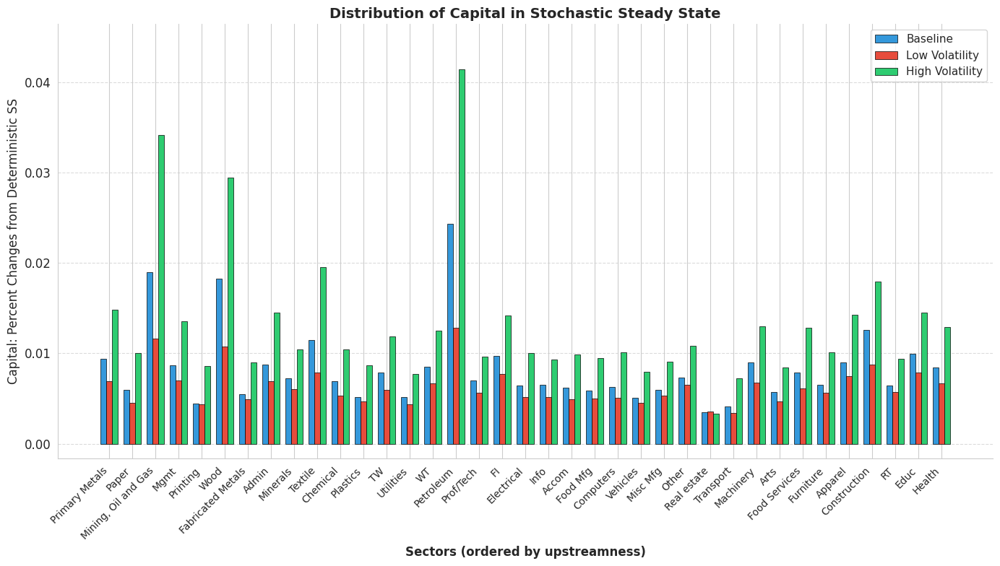

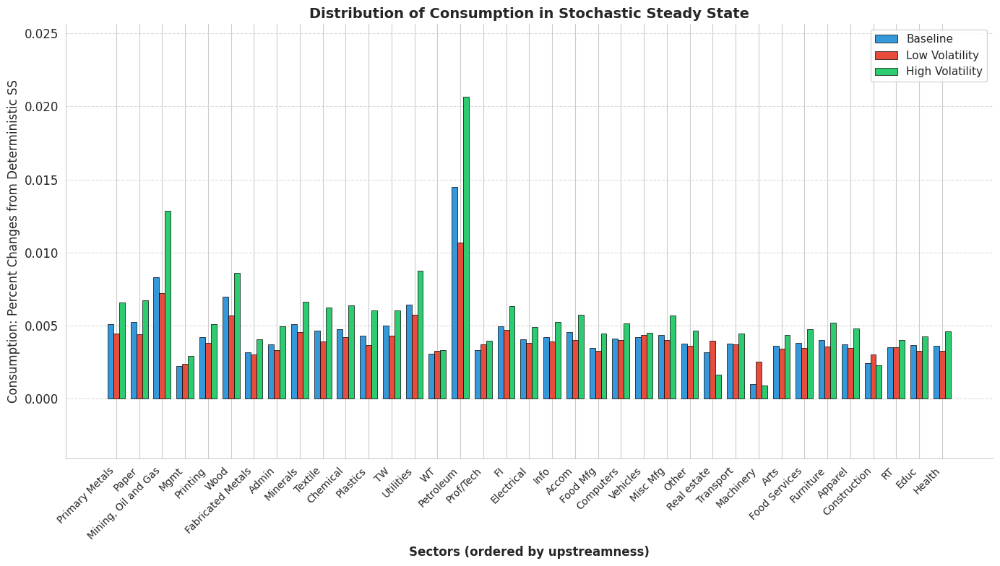

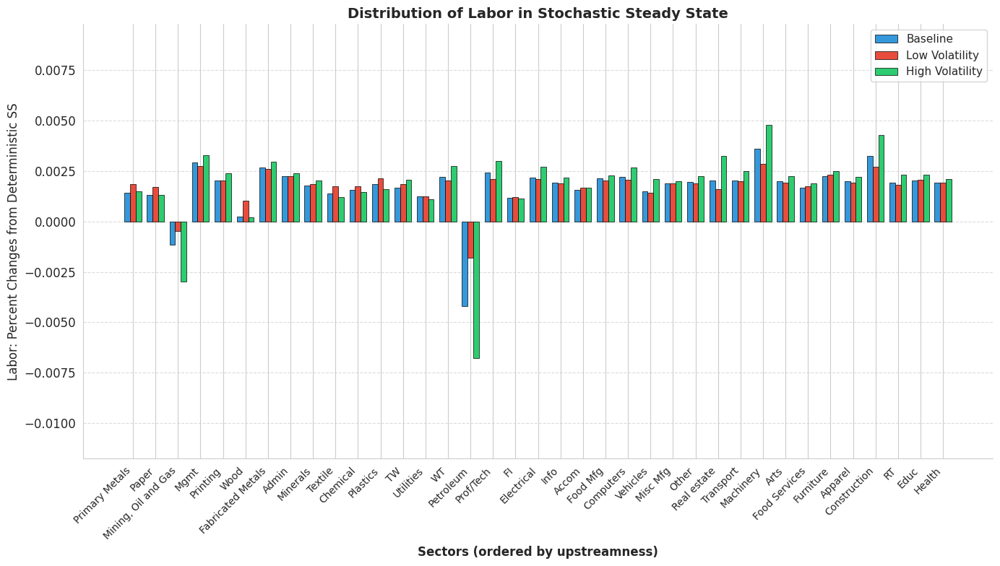

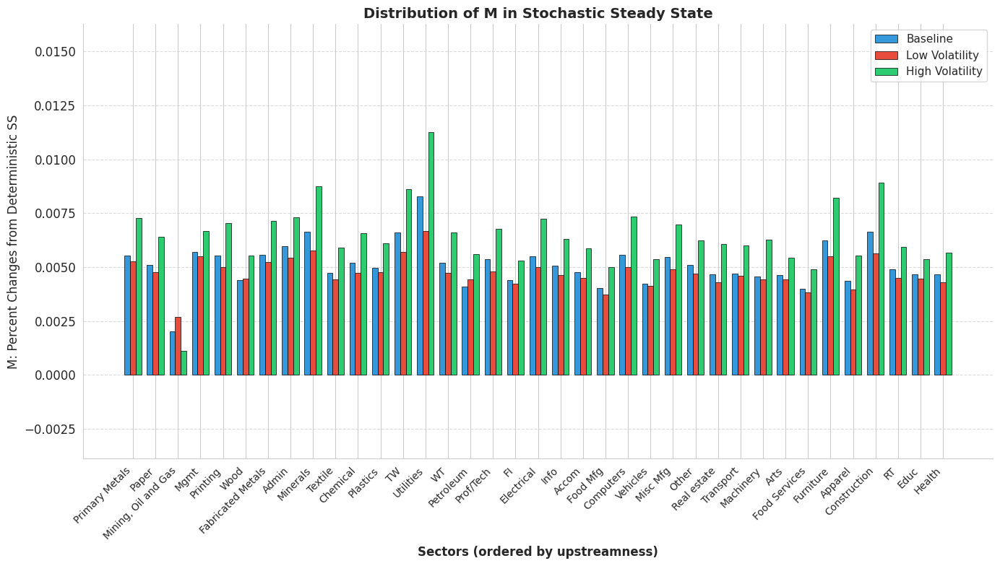

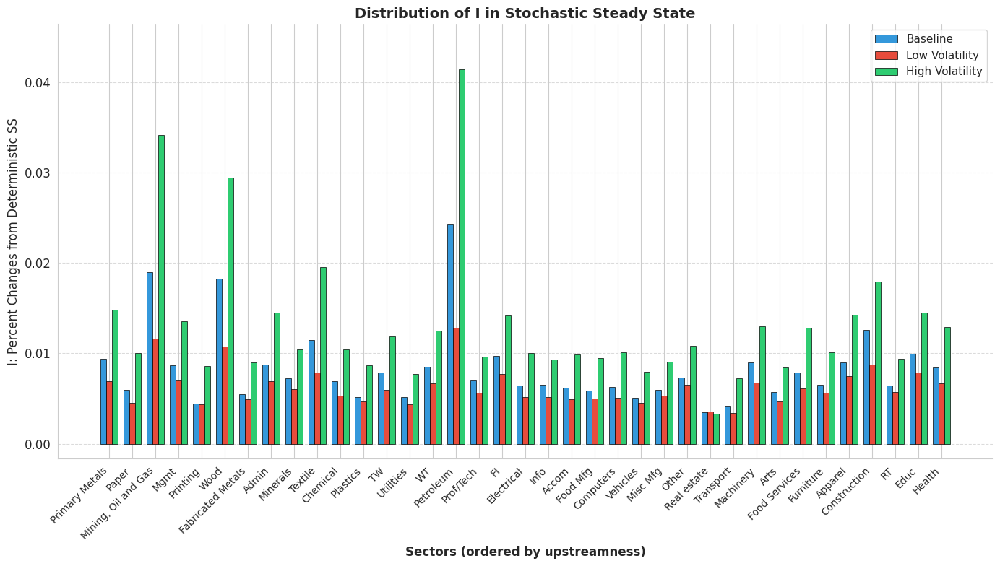

...

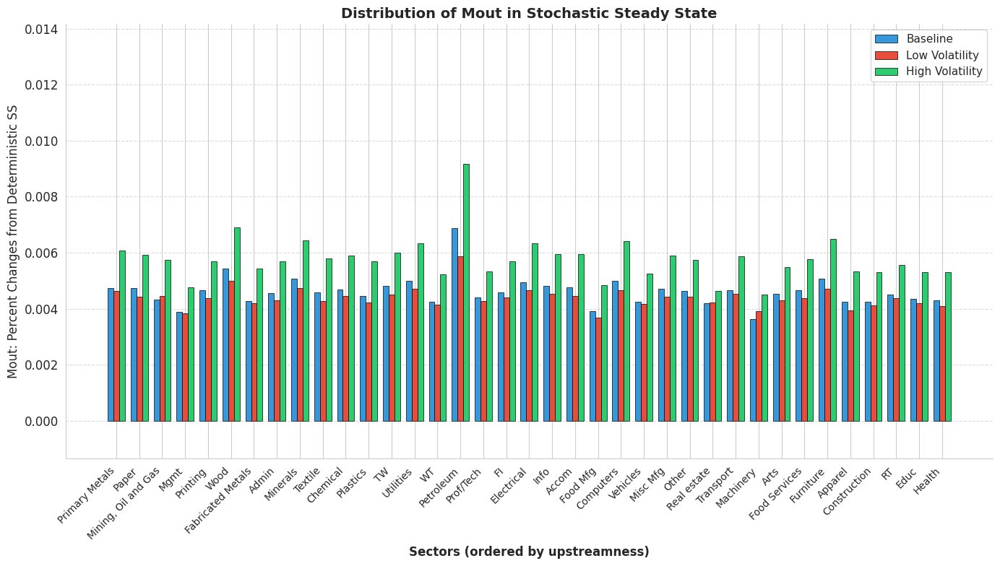

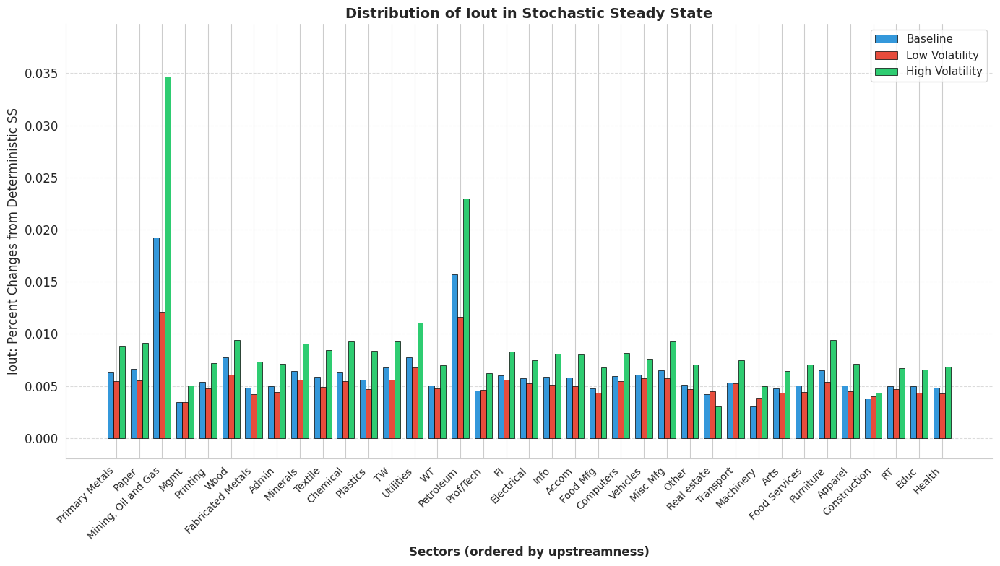

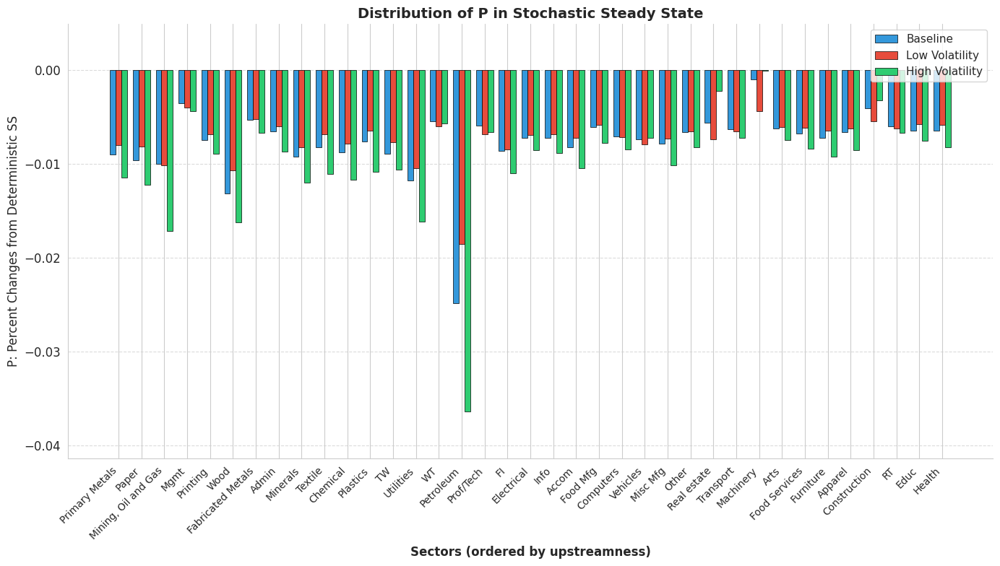

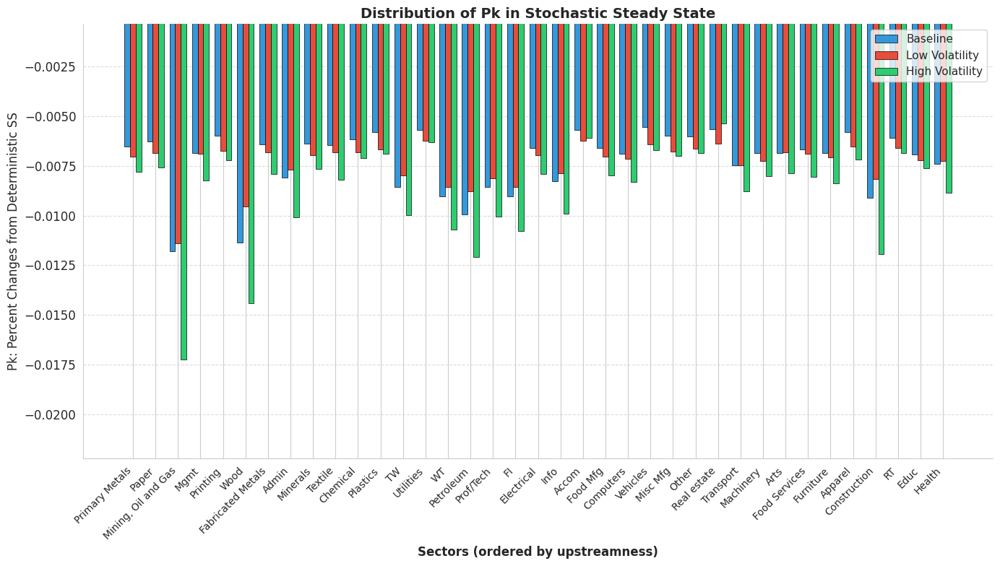

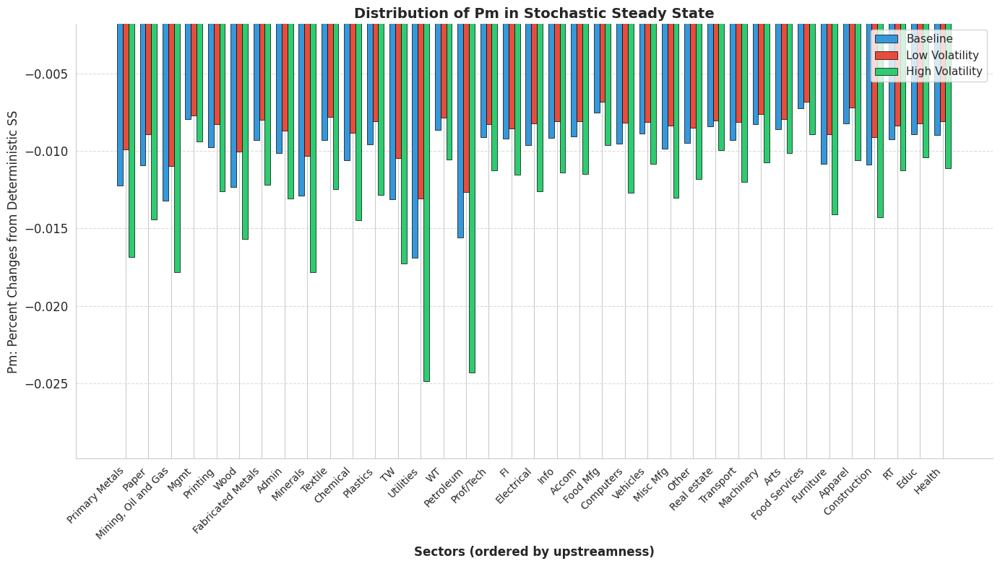

(<Figure size 1400x800 with 1 Axes>,
 <Axes: title={'center': 'Distribution of Pm in Stochastic Steady State'}, xlabel='Sectors (ordered by upstreamness)', ylabel='Pm: Percent Changes from Deterministic SS'>)

In [ ]:
def create_stochss_hist_comparative(variable_vector_1, variable_vector_2, variable_vector_3, label, upstreamness_data, save_dir=None, restore_exper_name=None):
    """
    Create a comparative bar chart with bars sorted by upstreamness measure.

    Parameters:
    -----------
    variable_vector_1, variable_vector_2, variable_vector_3 : array-like
        The three sets of values to plot (one for each scenario)
    label : str
        The label for the variables being plotted
    upstreamness_data : dict
        Dictionary containing upstreamness measures and sector labels, used for sorting the bars
    save_dir, restore_exper_name : str, optional
        Directory and experiment name for saving the figure
    """
    import matplotlib.pyplot as plt
    import numpy as np

    # Get sector labels from upstreamness_data
    sector_labels = upstreamness_data['sectors']
    selected_indices = range(37)
    # selected_indices = [0, 1, 2, 7, 19, 23, 25,  26, 27]
    variable_vector_1 = [variable_vector_1[i] for i in selected_indices]
    variable_vector_2 = [variable_vector_2[i] for i in selected_indices]
    variable_vector_3 = [variable_vector_3[i] for i in selected_indices]
    upstreamness_data = [upstreamness_data['U_M'][i] for i in selected_indices]
    sector_labels = [sector_labels[i] for i in selected_indices]

    # Get the sorting order based on U_M upstreamness (descending)
    sorted_indices = np.argsort(upstreamness_data)[::-1]

    # Sort the variable vectors and labels according to upstreamness
    sorted_vector_1 = np.array(variable_vector_1)[sorted_indices]
    sorted_vector_2 = np.array(variable_vector_2)[sorted_indices]
    sorted_vector_3 = np.array(variable_vector_3)[sorted_indices]
    sorted_labels = [sector_labels[i] for i in sorted_indices]

    # Create a bar chart
    fig, ax = plt.subplots(figsize=(14, 8))
    bar_width = 0.25
    index = np.arange(len(sorted_vector_1))

    bars1 = ax.bar(index - bar_width, sorted_vector_1, bar_width,
                  color='#3498db', edgecolor='black', linewidth=0.5, label='Baseline')
    bars2 = ax.bar(index, sorted_vector_2, bar_width,
                  color='#e74c3c', edgecolor='black', linewidth=0.5, label='Low Volatility')
    bars3 = ax.bar(index + bar_width, sorted_vector_3, bar_width,
                  color='#2ecc71', edgecolor='black', linewidth=0.5, label='High Volatility')

    # Extend y-axis range
    ax.set_ylim(min(min(sorted_vector_1), min(sorted_vector_2), min(sorted_vector_3)) - 0.005,
                max(max(sorted_vector_1), max(sorted_vector_2), max(sorted_vector_3)) + 0.005)

    # Add x-axis labels with rotation
    ax.set_xticks(index)
    ax.set_xticklabels(sorted_labels, rotation=45, ha='right', fontsize=10)

    # Customize layout and display the chart
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Add legend, title and labels
    plt.legend(loc='upper right', fontsize=11)
    plt.title(f"Distribution of {label} in Stochastic Steady State", fontsize=14, fontweight='bold')
    plt.ylabel(f'{label}: Percent Changes from Deterministic SS', fontsize=12)
    plt.xlabel('Sectors (ordered by upstreamness)', fontsize=12, fontweight='bold')

    # Improve layout to ensure all labels are visible
    plt.tight_layout()

    # Save figure if paths are provided
    if save_dir and restore_exper_name:
        import os
        save_path = os.path.join(save_dir, restore_exper_name, f'{label}_Stochastic_Steady_State_comparative_ordered.jpg')
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        fig.savefig(save_path, bbox_inches="tight", dpi=300)

    plt.show()
    return fig, ax

create_stochss_hist_comparative(K_stoch_ss, K_stoch_ss_lowvol, K_stoch_ss_highvol, "Capital", upstreamness_data)
create_stochss_hist_comparative(C_stoch_ss, C_stoch_ss_lowvol, C_stoch_ss_highvol,  "Consumption", upstreamness_data)
create_stochss_hist_comparative(L_stoch_ss, L_stoch_ss_lowvol, L_stoch_ss_highvol, "Labor", upstreamness_data)
create_stochss_hist_comparative(M_stoch_ss, M_stoch_ss_lowvol, M_stoch_ss_highvol, "M", upstreamness_data)
create_stochss_hist_comparative(I_stoch_ss, I_stoch_ss_lowvol, I_stoch_ss_highvol, "I", upstreamness_data)
create_stochss_hist_comparative(Y_stoch_ss, Y_stoch_ss_lowvol, Y_stoch_ss_highvol, "Y", upstreamness_data)
create_stochss_hist_comparative(Q_stoch_ss, Q_stoch_ss_lowvol, Q_stoch_ss_highvol, "Q", upstreamness_data)
create_stochss_hist_comparative(Mout_stoch_ss, Mout_stoch_ss_lowvol, Mout_stoch_ss_highvol, "Mout", upstreamness_data)
create_stochss_hist_comparative(Iout_stoch_ss, Iout_stoch_ss_lowvol, Iout_stoch_ss_highvol, "Iout", upstreamness_data)
create_stochss_hist_comparative(P_stoch_ss, P_stoch_ss_lowvol, P_stoch_ss_highvol, "P", upstreamness_data)
create_stochss_hist_comparative(Pk_stoch_ss, Pk_stoch_ss_lowvol, Pk_stoch_ss_highvol, "Pk", upstreamness_data)
create_stochss_hist_comparative(Pm_stoch_ss, Pm_stoch_ss_lowvol, Pm_stoch_ss_highvol, "Pm", upstreamness_data)

In [ ]:
corr_baseline = np.corrcoef(K_stoch_ss, upstreamness_data['U_M'])
corr_lowvol = np.corrcoef(K_stoch_ss_lowvol, upstreamness_data['U_M'])
corr_highvol = np.corrcoef(K_stoch_ss_highvol, upstreamness_data['U_M'])
display(corr_baseline, corr_lowvol, corr_highvol)

array([[1.        , 0.21693988],
       [0.21693988, 1.        ]])

array([[1.        , 0.17837631],
       [0.17837631, 1.        ]])

array([[1.        , 0.26969466],
       [0.26969466, 1.        ]])

In [ ]:
corr_baseline = np.corrcoef(K_stoch_ss, upstreamness_data['U_I'])
corr_lowvol = np.corrcoef(K_stoch_ss_lowvol, upstreamness_data['U_I'])
corr_highvol = np.corrcoef(K_stoch_ss_highvol, upstreamness_data['U_I'])
display(corr_baseline, corr_lowvol, corr_highvol)

array([[1.        , 0.03197367],
       [0.03197367, 1.        ]])

array([[1.        , 0.03666722],
       [0.03666722, 1.        ]])

array([[ 1.        , -0.01421852],
       [-0.01421852,  1.        ]])

# Simulation Analisis

## Aggregation

In [ ]:
# Extract aggregate policies from simulations
agg_policies = simul_policies[:,-5:]*env.policies_sd[-5:]
agg_policies_lowvol = simul_policies_lowvol[:,-5:]*env.policies_sd[-5:]
agg_policies_highvol = simul_policies_highvol[:,-5:]*env.policies_sd[-5:]
agg_policies_loglinear = simul_policies_loglinear[:,-5:]*env.policies_sd[-5:]
Cagg, Cagg_lowvol, Cagg_highvol, Cagg_loglinear = agg_policies[:,0], agg_policies_lowvol[:,0], agg_policies_highvol[:,0], agg_policies_loglinear[:,0]
Lagg, Lagg_lowvol, Lagg_highvol, Lagg_loglinear = agg_policies[:,1], agg_policies_lowvol[:,1], agg_policies_highvol[:,1], agg_policies_loglinear[:,1]
Yagg, Yagg_lowvol, Yagg_highvol, Yagg_loglinear = agg_policies[:,2], agg_policies_lowvol[:,2], agg_policies_highvol[:,2], agg_policies_loglinear[:,2]
Iagg, Iagg_lowvol, Iagg_highvol, Iagg_loglinear = agg_policies[:,3], agg_policies_lowvol[:,3], agg_policies_highvol[:,3], agg_policies_loglinear[:,3]
Magg, Magg_lowvol, Magg_highvol, Magg_loglinear = agg_policies[:,4], agg_policies_lowvol[:,4], agg_policies_highvol[:,4], agg_policies_loglinear[:,4]

# Constructing aggregate capital
K, K_lowvol, K_highvol, K_loglinear = simul_obs[:,:env.n_sectors], simul_obs_lowvol[:,:env.n_sectors], simul_obs_highvol[:,:env.n_sectors], simul_obs_loglinear[:,:env.n_sectors]
K_level = jnp.exp(K*env.obs_sd[:env.n_sectors] +  env.obs_ss[:env.n_sectors])
K_level_lowvol = jnp.exp(K_lowvol*env.obs_sd[:env.n_sectors] +  env.obs_ss[:env.n_sectors])
K_level_highvol = jnp.exp(K_highvol*env.obs_sd[:env.n_sectors] +  env.obs_ss[:env.n_sectors])
K_level_loglinear = jnp.exp(K_loglinear*env.obs_sd[:env.n_sectors] +  env.obs_ss[:env.n_sectors])

K_level_ss = jnp.exp(env.obs_ss[:env.n_sectors])
Pkss = jnp.exp(env.policies_ss[2*env.n_sectors:3*env.n_sectors])
Kagg_level_ss = jnp.dot(K_level_ss,Pk_stochss)

Kagg_level = jnp.dot(K_level,Pk_stochss)
Kagg_level_lowvol = jnp.dot(K_level_lowvol,Pk_stochss)
Kagg_level_highvol = jnp.dot(K_level_highvol,Pk_stochss)
Kagg_level_loglinear = jnp.dot(K_level_loglinear,Pk_stochss)
Kagg = jnp.log(Kagg_level) - jnp.log(Kagg_level_ss)
Kagg_lowvol = jnp.log(Kagg_level_lowvol) - jnp.log(Kagg_level_ss)
Kagg_highvol = jnp.log(Kagg_level_highvol) - jnp.log(Kagg_level_ss)
Kagg_loglinear = jnp.log(Kagg_level_loglinear) - jnp.log(Kagg_level_ss)

## Aggregate Descriptive Statistics

In [ ]:
 # CREATE A TABLE FOR AGGREGATES WITH MEAN, SD, SKEWNESS, KURTOSIS, Q1, Q10, Q25, Q50(MEDIAN), Q75, Q90, Q999
from scipy.stats import skew, kurtosis

def autocorrelation(x, lag):
    # Ensure the time series is zero-mean
    x = x - np.mean(x)
    # Only consider the part of the series that overlaps with its lagged version
    x_lag = x[lag:]
    x_orig = x[:-lag]
    # Compute the autocorrelation using the dot product of the original and lagged series
    # Normalize by the variance so the autocorrelation at lag 0 is 1
    acf = np.dot(x_orig, x_lag) / np.dot(x, x)
    return acf

def statistic(var):
    # CALCULATE PERCENTILES
    # percentiles = jnp.quantile(var, jnp.array([0.01, 0.25, 0.5, 0.75, 0.99]))

    # CALCULATE SKEWNESS AND KURTOSIS
    means = float(np.mean(var))
    sd = float(np.std(var))
    skewness = skew(var)
    kurt = kurtosis(var)

    # CALCULATE AUTOCORRELATIONS FOR LAGS 1 TO 5
    autocorrelations = [autocorrelation(var, lag) for lag in range(1, 6)]

    # COMBINE ALL MEASURES INTO A SINGLE DICTIONARY
    desc_stats = [means, sd, skewness, kurt]
    # desc_stats = [means, sd, skewness, kurt] + percentiles.tolist()

    stats ={"desc_stats": desc_stats, "autocorrelations": autocorrelations}
    return stats

Cagg_stats, Cagg_lowvol_stats, Cagg_highvol_stats, Cagg_loglinear_stats = statistic(Cagg), statistic(Cagg_lowvol), statistic(Cagg_highvol), statistic(Cagg_loglinear)
Lagg_stats, Lagg_lowvol_stats, Lagg_highvol_stats, Lagg_loglinear_stats = statistic(Lagg), statistic(Lagg_lowvol), statistic(Lagg_highvol), statistic(Lagg_loglinear)
Iagg_stats, Iagg_lowvol_stats, Iagg_highvol_stats, Iagg_loglinear_stats = statistic(Iagg), statistic(Iagg_lowvol), statistic(Iagg_highvol), statistic(Iagg_loglinear)
Magg_stats, Magg_lowvol_stats, Magg_highvol_stats, Magg_loglinear_stats = statistic(Magg), statistic(Magg_lowvol), statistic(Magg_highvol), statistic(Magg_loglinear)
Yagg_stats, Yagg_lowvol_stats, Yagg_highvol_stats, Yagg_loglinear_stats = statistic(Yagg), statistic(Yagg_lowvol), statistic(Yagg_highvol), statistic(Yagg_loglinear)
Kagg_stats, Kagg_lowvol_stats, Kagg_highvol_stats, Kagg_loglinear_stats = statistic(Kagg), statistic(Kagg_lowvol), statistic(Kagg_highvol), statistic(Kagg_loglinear)

print("Cagg_stats", Cagg_stats)
print("Cagg_lowvol_stats", Cagg_lowvol_stats)

Cagg_stats {'desc_stats': [-0.0049093510189985815, 0.030782423684597292, np.float64(-0.0627807095211353), np.float64(-0.022200917634098705)], 'autocorrelations': [np.float64(0.9390189746022842), np.float64(0.8921594736486063), np.float64(0.8532081736637703), np.float64(0.8192454559056622), np.float64(0.7884983368808153)]}
Cagg_lowvol_stats {'desc_stats': [-0.0046099414296698095, 0.030278483040377266, np.float64(-0.05301815256823859), np.float64(-0.01412385333867805)], 'autocorrelations': [np.float64(0.9374407438602205), np.float64(0.8891506627095934), np.float64(0.8490682997307029), np.float64(0.8141913039136793), np.float64(0.78265963250769)]}


In [ ]:
 # CREATE A DATA FRAME FOR AGGREGATES WITH MEAN, SD, SKEWNESS, KURTOSIS, Q1, Q10, Q25, Q50(MEDIAN), Q75, Q90, Q999
desc_stats = {
  # ' ':  ["Mean", "Sd", "Skewness", "Kurtosis","Q1","Q25","Q50","Q75","Q99"],
  ' ':  ["Mean", "Sd", "Skewness", "Kurtosis"],
  'Consumption': Cagg_stats["desc_stats"],
  'Consumption highvol': Cagg_highvol_stats["desc_stats"],
  'Consumption lowvol': Cagg_lowvol_stats["desc_stats"],
  'Consumption loglinear': Cagg_loglinear_stats["desc_stats"],
  'Labor': Lagg_stats["desc_stats"],
  'Labor highvol': Lagg_highvol_stats["desc_stats"],
  'Labor lowvol': Lagg_lowvol_stats["desc_stats"],
  'Labor loglinear': Lagg_loglinear_stats["desc_stats"],
  'GDP': Yagg_stats["desc_stats"],
  'GDP highvol': Yagg_highvol_stats["desc_stats"],
  'GDP lowvol': Yagg_lowvol_stats["desc_stats"],
  'GDP loglinear': Yagg_loglinear_stats["desc_stats"],
  'Investment': Iagg_stats["desc_stats"],
  'Investment highvol': Iagg_highvol_stats["desc_stats"],
  'Investment lowvol': Iagg_lowvol_stats["desc_stats"],
  'Investment loglinear': Iagg_loglinear_stats["desc_stats"],
  'Intermediates ': Magg_stats["desc_stats"],
  'Intermediates highvol': Magg_highvol_stats["desc_stats"],
  'Intermediates lowvol': Magg_lowvol_stats["desc_stats"],
  'Intermediates loglinear': Magg_loglinear_stats["desc_stats"],
  'Capital ': Kagg_stats["desc_stats"],
  'Capital highvol': Kagg_highvol_stats["desc_stats"],
  'Capital lowvol': Kagg_lowvol_stats["desc_stats"],
  'Capital loglinear': Kagg_loglinear_stats["desc_stats"],
}

desc_stats_df=pd.DataFrame(desc_stats)
desc_stats_df=desc_stats_df.transpose()
desc_stats_df = desc_stats_df.round(3)

autocorrelations = {
  ' ':  ["AC1", "AC2", "AC3", "AC4", "AC5"],
  'Consumption': Cagg_stats["autocorrelations"],
  'Labor': Lagg_stats["autocorrelations"],
  'GDP': Yagg_stats["autocorrelations"],
  'Investment': Iagg_stats["autocorrelations"],
  'Intermediates': Magg_stats["autocorrelations"],
  'Capital': Kagg_stats["autocorrelations"],
}
autocorrelations_df=pd.DataFrame(autocorrelations)
autocorrelations_df=autocorrelations_df.transpose()
autocorrelations_df = autocorrelations_df.round(3)

In [ ]:
pd.options.display.float_format = '{:,.3f}'.format
desc_stats_df

,0,1,2,3
,Mean,Sd,Skewness,Kurtosis
Consumption,-0.005,0.031,-0.063,-0.022
Consumption highvol,-0.007,0.031,-0.077,-0.012
Consumption lowvol,-0.005,0.030,-0.053,-0.014
Consumption loglinear,0.001,0.030,0.004,-0.015
Labor,-0.002,0.013,-0.064,-0.005
Labor highvol,-0.002,0.014,-0.083,0.004
Labor lowvol,-0.002,0.013,-0.056,0.001
Labor loglinear,0.000,0.013,-0.000,-0.004
GDP,-0.001,0.038,-0.006,-0.021


In [ ]:
autocorrelations_df

,0,1,2,3,4
,AC1,AC2,AC3,AC4,AC5
Consumption,0.921,0.864,0.819,0.780,0.745
Labor,0.845,0.744,0.672,0.617,0.572
GDP,0.866,0.778,0.713,0.662,0.620
Investment,0.754,0.603,0.499,0.420,0.359
Intermediates,0.836,0.725,0.646,0.584,0.535
Capital,0.995,0.982,0.964,0.942,0.918


In [ ]:
 # CREATE TABLES IN LATEX


# LaTeX Code
latexcode_preamble = (
    # r"\begin{tabularx}{\textwidth}{l *{9}{X}}"  # Use tabularx to automatically adjust the width
    r"\begin{tabularx}{\textwidth}{l *{4}{X}}"  # Use tabularx to automatically adjust the width
    r"\toprule"
    # r"\textbf{} & \textbf{Mean} & \textbf{Sd} & \textbf{Skewness} & \textbf{Kurtosis} & \textbf{Q1} & \textbf{Q25} & \textbf{Q50} & \textbf{Q75} & \textbf{Q99} \\"  # Bold table headers
    r"\textbf{} & \textbf{Mean} & \textbf{Sd} & \textbf{Skewness} & \textbf{Kurtosis} \\"  # Bold table headers
    r"\midrule"
    # r"\cmidrule(lr){1-1} \cmidrule(lr){2-10}"
    r"\cmidrule(lr){1-1} \cmidrule(lr){2-5}"
)

# DESCRIPTIVE STATISTICS TABLE
df_ = desc_stats_df.iloc[1:, 0:]
latexcode_descstats = latexcode_preamble

# Fill the table with DataFrame data and add thin lines
for index, row in df_.iterrows():
    # Format numbers with three decimals before adding to the code
    formatted_row = [f"{round(float(value), 3):.3f}" for value in row]
    latexcode_descstats += r"\textbf{" + str(index) + r"} & " + " & ".join(map(str, formatted_row)) + r" \\"  # Row with data
    # Add thin line after rows containing certain labels
    if 'Cagg Loglinear' in index or 'Yagg Loglinear' in index or 'Lagg Loglinear' in index or 'Iagg Loglinear' in index:
        latexcode_descstats += r"\cmidrule(lr){1-10}"  # Adjust range based on the number of columns

# Complete the LaTeX code
latexcode_descstats += (
    r"\bottomrule"
    r"\end{tabularx}"               # End table environment
)

# Show the generated LaTeX code
print(latexcode_descstats)
latex_filename = config_simul['save_dir'] + config_simul['restore_exper_name'] + f'/descstat_table_comparative_samevol.tex'

# Save the LaTeX code to the specified file
with open(latex_filename, 'w') as file:
    file.write(latexcode_descstats)

# AUTOCORRELATION TABLE
df_ = autocorrelations_df.iloc[1:, 0:]
latexcode_preamble = (
    r"\begin{tabularx}{\textwidth}{l *{6}{X}}"  # Use tabularx to automatically adjust the width
    r"\toprule"
    r"\textbf{} & \textbf{AC1} & \textbf{AC2} & \textbf{AC3} & \textbf{AC4} & \textbf{AC5} \\"  # Bold table headers
    r"\midrule"
    r"\cmidrule(lr){1-1} \cmidrule(lr){2-12}"
)
latexcode_autocorr = latexcode_preamble

# Fill the table with DataFrame data and add thin lines
for index, row in df_.iterrows():
    # Format numbers with three decimals before adding to the code
    formatted_row = [f"{round(float(value), 3):.3f}" for value in row]
    latexcode_autocorr += r"\textbf{" + str(index) + r"} & " + " & ".join(map(str, formatted_row)) + r" \\"  # Row with data
    # Add thin line after rows containing certain labels
    if 'Cagg Loglinear' in index or 'Yagg Loglinear' in index or 'Lagg Loglinear' in index or 'Iagg Loglinear' in index:
        latexcode_autocorr += r"\cmidrule(lr){1-12}"  # Adjust range based on the number of columns

# Complete the LaTeX code
latexcode_autocorr += (
    r"\bottomrule"
    r"\end{tabularx}"               # End table environment
)

# Show the generated LaTeX code
print(latexcode_autocorr)
latex_filename = config_simul['save_dir'] + config_simul['restore_exper_name'] + f'/autocorr_table.tex'

# Save the LaTeX code to the specified file
with open(latex_filename, 'w') as file:
    file.write(latexcode_autocorr)



\begin{tabularx}{\textwidth}{l *{4}{X}}\toprule\textbf{} & \textbf{Mean} & \textbf{Sd} & \textbf{Skewness} & \textbf{Kurtosis} \\\midrule\cmidrule(lr){1-1} \cmidrule(lr){2-5}\textbf{Consumption} & -0.005 & 0.031 & -0.063 & -0.022 \\\textbf{Consumption highvol} & -0.007 & 0.031 & -0.077 & -0.012 \\\textbf{Consumption lowvol} & -0.005 & 0.030 & -0.053 & -0.014 \\\textbf{Consumption loglinear} & 0.001 & 0.030 & 0.004 & -0.015 \\\textbf{Labor} & -0.002 & 0.013 & -0.064 & -0.005 \\\textbf{Labor highvol} & -0.002 & 0.014 & -0.083 & 0.004 \\\textbf{Labor lowvol} & -0.002 & 0.013 & -0.056 & 0.001 \\\textbf{Labor loglinear} & 0.000 & 0.013 & -0.000 & -0.004 \\\textbf{GDP} & -0.001 & 0.038 & -0.006 & -0.021 \\\textbf{GDP highvol} & -0.003 & 0.039 & -0.007 & -0.021 \\\textbf{GDP lowvol} & -0.002 & 0.038 & -0.012 & -0.011 \\\textbf{GDP loglinear} & 0.001 & 0.038 & 0.002 & -0.006 \\\textbf{Investment} & -0.005 & 0.078 & -0.107 & 0.001 \\\textbf{Investment highvol} & -0.006 & 0.078 & -0.132 & 0.006 

## Histograms

First, we create a function to plot comparative histograms

In [ ]:
def extract_histograms(Kagg, Kagg_lowvol, Kagg_highvol, traject, traject_lowvol, traject_highvol, sector_index, env):
  Cagg, Cagg_lowvol, Cagg_highvol = traject[:,11*env.n_sectors], traject_lowvol[:,11*env.n_sectors], traject_highvol[:,11*env.n_sectors]
  Lagg, Lagg_lowvol, Lagg_highvol = traject[:,11*env.n_sectors+1], traject_lowvol[:,11*env.n_sectors+1], traject_highvol[:,11*env.n_sectors+1]
  Yagg, Yagg_lowvol, Yagg_highvol = traject[:,11*env.n_sectors+2], traject_lowvol[:,11*env.n_sectors+2], traject_highvol[:,11*env.n_sectors+2]
  Iagg, Iagg_lowvol, Iagg_highvol = traject[:,11*env.n_sectors+3], traject_lowvol[:,11*env.n_sectors+3], traject_highvol[:,11*env.n_sectors+3]
  Magg, Magg_lowvol, Magg_highvol = traject[:,11*env.n_sectors+4], traject_lowvol[:,11*env.n_sectors+4], traject_highvol[:,11*env.n_sectors+4]
  C_j, C_j_lowvol, C_j_highvol = traject[:,sector_index-1], traject_lowvol[:,sector_index-1], traject_highvol[:,sector_index-1]
  L_j, L_j_lowvol, L_j_highvol = traject[:,env.n_sectors+sector_index-1], traject_lowvol[:,env.n_sectors+sector_index-1], traject_highvol[:,env.n_sectors+sector_index-1]
  Pk_j, Pk_j_lowvol, Pk_j_highvol = traject[:,2*env.n_sectors+sector_index-1], traject_lowvol[:,2*env.n_sectors+sector_index-1], traject_highvol[:,2*env.n_sectors+sector_index-1]
  Pm_j, Pm_j_lowvol, Pm_j_highvol = traject[:,3*env.n_sectors+sector_index-1], traject_lowvol[:,3*env.n_sectors+sector_index-1], traject_highvol[:,3*env.n_sectors+sector_index-1]
  M_j, M_j_lowvol, M_j_highvol = traject[:,4*env.n_sectors+sector_index-1], traject_lowvol[:,4*env.n_sectors+sector_index-1], traject_highvol[:,4*env.n_sectors+sector_index-1]
  Mout_j, Mout_j_lowvol, Mout_j_highvol = traject[:,5*env.n_sectors+sector_index-1], traject_lowvol[:,5*env.n_sectors+sector_index-1], traject_highvol[:,5*env.n_sectors+sector_index-1]
  I_j, I_j_lowvol, I_j_highvol = traject[:,6*env.n_sectors+sector_index-1], traject_lowvol[:,6*env.n_sectors+sector_index-1], traject_highvol[:,6*env.n_sectors+sector_index-1]
  Iout_j, Iout_j_lowvol, Iout_j_highvol = traject[:,7*env.n_sectors+sector_index-1], traject_lowvol[:,7*env.n_sectors+sector_index-1], traject_highvol[:,7*env.n_sectors+sector_index-1]
  P_j, P_j_lowvol, P_j_highvol = traject[:,8*env.n_sectors+sector_index-1], traject_lowvol[:,8*env.n_sectors+sector_index-1], traject_highvol[:,8*env.n_sectors+sector_index-1]
  Q_j, Q_j_lowvol, Q_j_highvol = traject[:,9*env.n_sectors+sector_index-1], traject_lowvol[:,9*env.n_sectors+sector_index-1], traject_highvol[:,9*env.n_sectors+sector_index-1]
  Y_j, Y_j_lowvol, Y_j_highvol = traject[:,10*env.n_sectors+sector_index-1], traject_lowvol[:,10*env.n_sectors+sector_index-1], traject_highvol[:,10*env.n_sectors+sector_index-1]


  def create_histogram(var, var_lowvol, var_highvol, label, legend):
    # Determine global min and max across all three variables to set proper bin range
    global_min = min(jnp.min(var), jnp.min(var_lowvol), jnp.min(var_highvol))
    global_max = max(jnp.max(var), jnp.max(var_lowvol), jnp.max(var_highvol))

    # Add a small padding (5%) to see beyond the extremes
    padding = (global_max - global_min) * 0.05
    bin_range = (global_min - padding, global_max + padding)

    # Create bins using the global range
    bins = jnp.linspace(bin_range[0], bin_range[1], 21)  # 21 edges for 20 bins

    # Histogram for var_highvol
    counts_var_highvol, _ = jnp.histogram(var_highvol, bins=bins)
    freqs_var_highvol = counts_var_highvol / config_simul["periods_per_epis"]

    # Histogram for var (using the same bins)
    counts_var, _ = jnp.histogram(var, bins=bins)
    freqs_var = counts_var / config_simul["periods_per_epis"]

    # Histogram for var_lowvol (using the same bins)
    counts_var_lowvol, _ = jnp.histogram(var_lowvol, bins=bins)
    freqs_var_lowvol = counts_var_lowvol / config_simul["periods_per_epis"]

    # Plot
    fig, ax = plt.subplots(figsize=(8, 6))

    bin_centers = (bins[:-1] + bins[1:]) / 2  # Compute bin centers

    # Plot the contours
    ax.plot(bin_centers, freqs_var, label="Baseline Policy", color='b', linewidth=2)
    ax.plot(bin_centers, freqs_var_lowvol, label="Low Vol. Policy", color='r', linewidth=2)
    ax.plot(bin_centers, freqs_var_highvol, label="High Vol. Policy", color='g', linewidth=2)
    ax.axvline(x=0, color='k', linestyle='--', linewidth=2, label='Deterministic SS')

    # Add grid lines for better readability
    # ax.grid(True, linestyle='--', alpha=0.7)

    plt.xlabel(f'{legend} (log deviations from deterministic SSS)', fontsize=12)
    plt.ylabel('Frequency')
    # plt.title(f'Histogram of {legend}')
    plt.legend()
    sns.despine()

    # Save figure
    fig.savefig(config_simul['save_dir'] + config_simul['restore_exper_name'] + f'/Histogram_{label}_comparative.jpg', bbox_inches="tight", pad_inches=0.1)
    plt.show()

  create_histogram(Cagg,Cagg_lowvol,Cagg_highvol,"C_agg","Agg. Consumption")
  create_histogram(Lagg,Lagg_lowvol,Lagg_highvol,"L_agg","Agg. Labor")
  create_histogram(Yagg,Yagg_lowvol,Yagg_highvol,"Y_agg","Agg. Production")
  create_histogram(Iagg,Iagg_lowvol,Iagg_highvol,"I_agg","Agg.Investment")
  create_histogram(Magg,Magg_lowvol,Magg_highvol,"M_agg","Agg. Intermediate Goods")
  create_histogram(Kagg,Kagg_lowvol,Kagg_highvol,"K_agg","Agg. Capital")
  create_histogram(C_j,C_j_lowvol,C_j_highvol,"C_sec",f"Sector {sector_index} Consumption")
  create_histogram(L_j,L_j_lowvol,L_j_highvol,"L_sec",f"Sector {sector_index} Labor")
  create_histogram(Y_j,Y_j_lowvol,Y_j_highvol,"Y_sec",f"Sector {sector_index}  Production")
  create_histogram(I_j,I_j_lowvol,I_j_highvol,"I_sec",f"Sector {sector_index} Investment")
  create_histogram(M_j,M_j_lowvol,M_j_highvol,"M_sec",f"Sector {sector_index} Intermediate Goods")
  # create_histogram(K_j,K_j_loglinear,"K_sec",f"Sector {sector_index} Capital")



Now we create the histograms

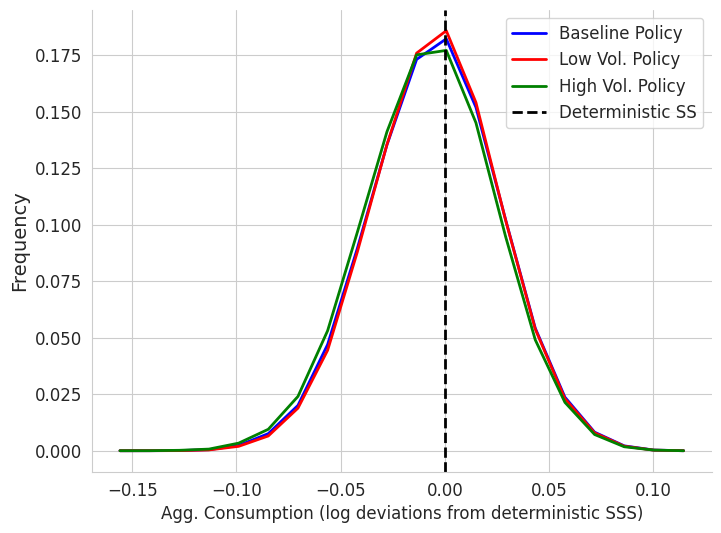

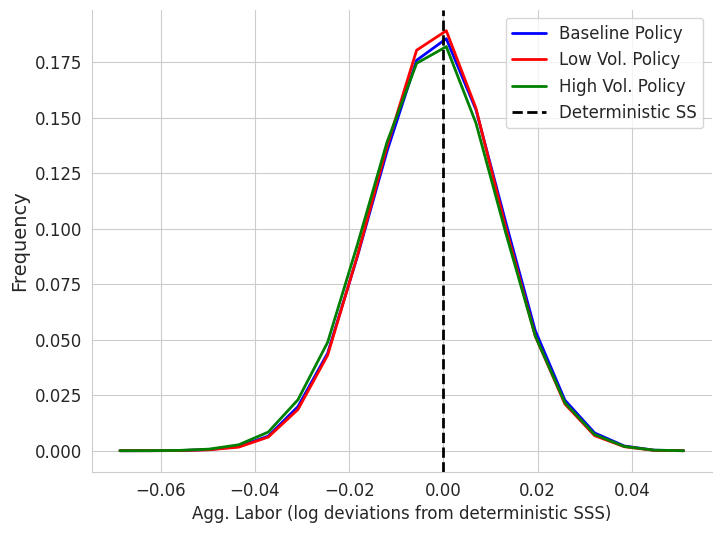

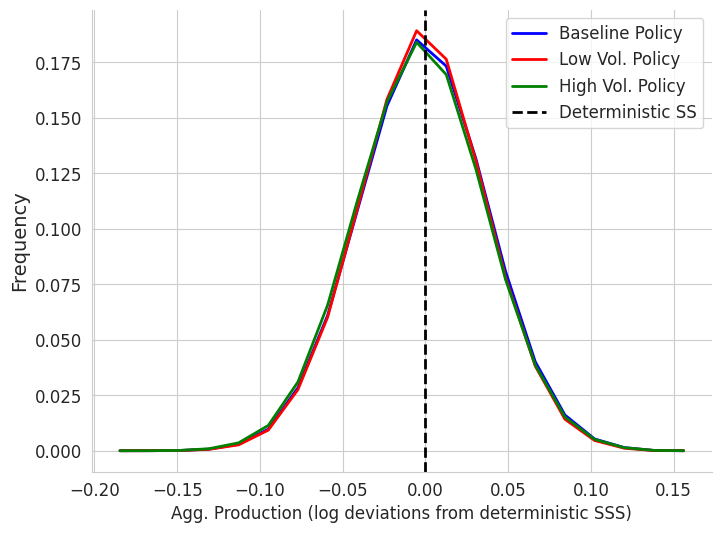

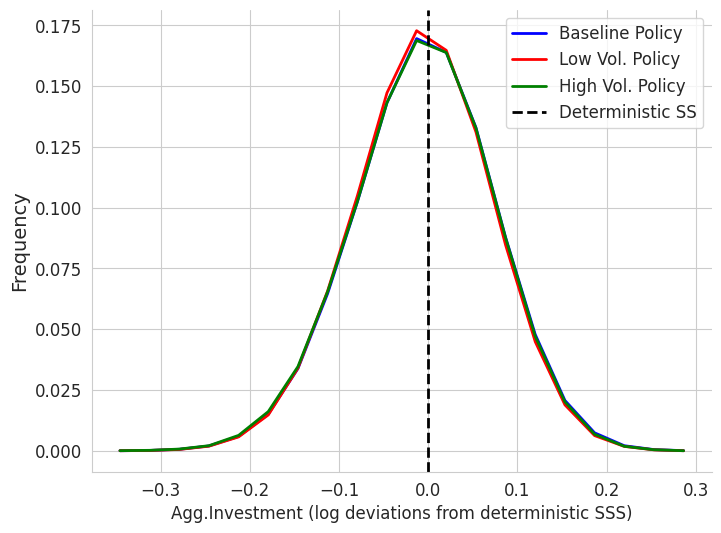

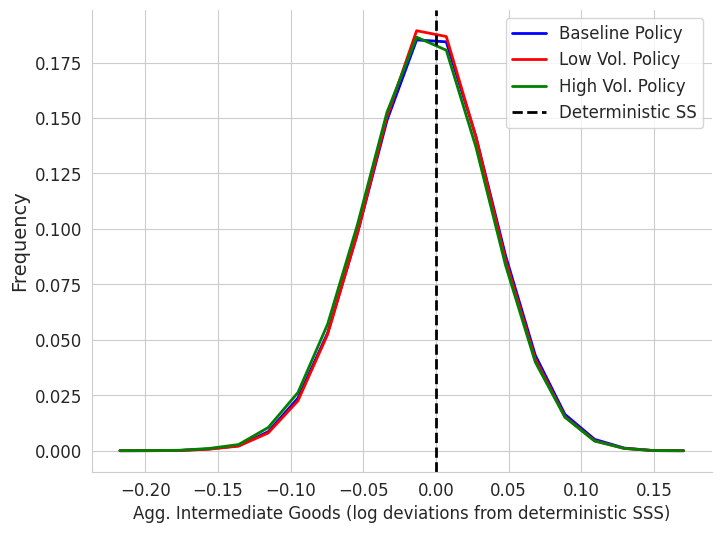

...

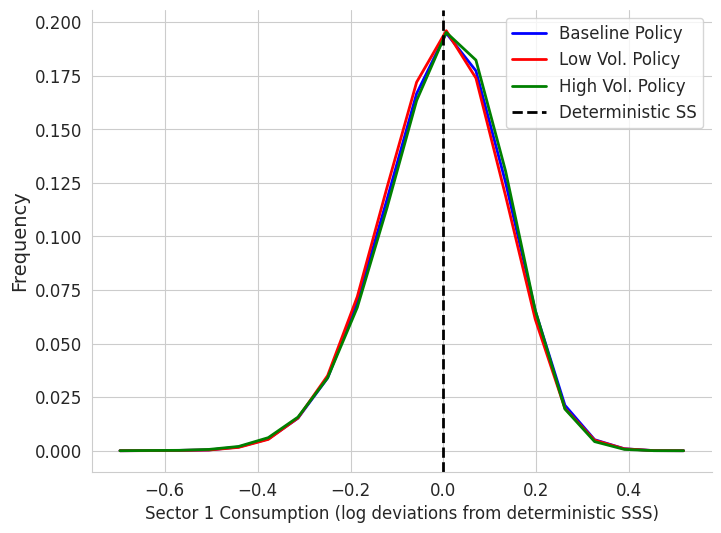

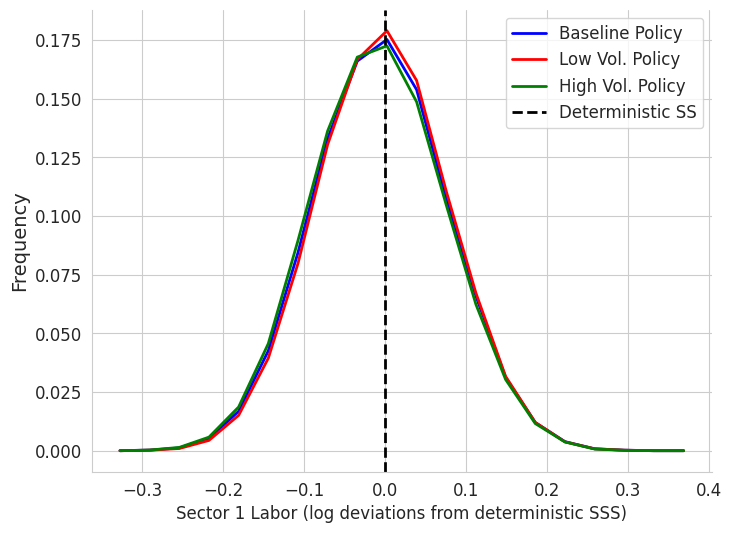

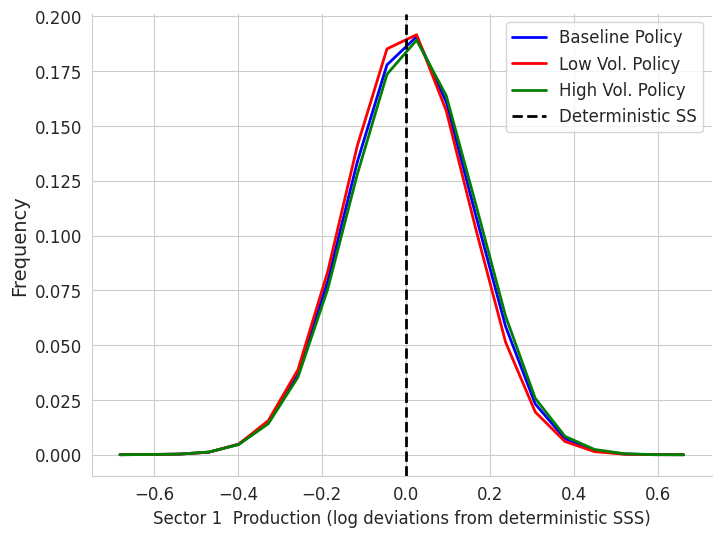

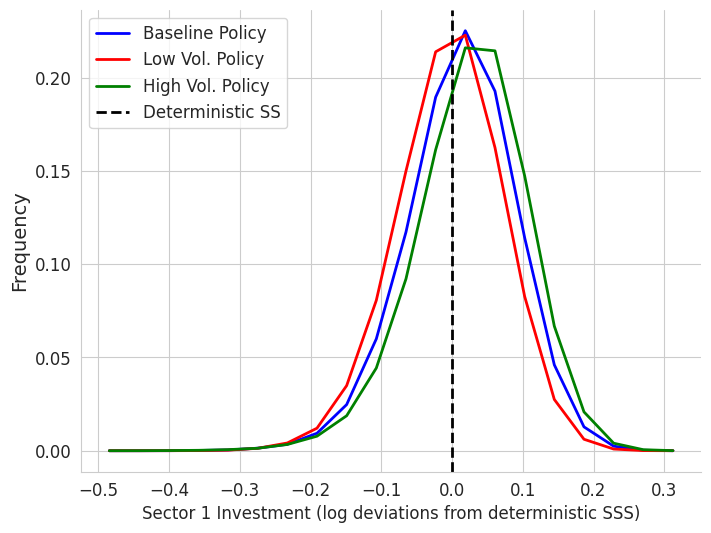

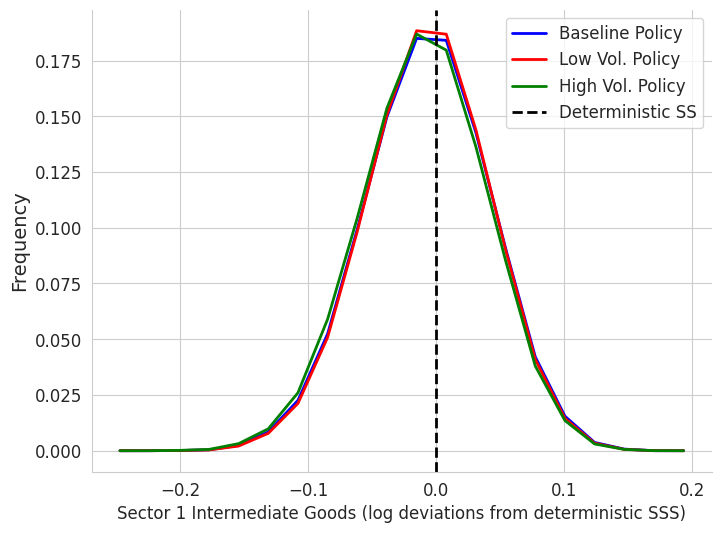

In [ ]:
env = Model()
extract_histograms(Kagg, Kagg_lowvol,Kagg_highvol, simul_policies*policies_sd,simul_policies_lowvol*policies_sd,simul_policies_highvol*policies_sd,1,env)

# Impulse Responses

We start by creating a function that takes as input an inital obs and a set of shocks.

In [ ]:
def simul_traject(env, train_state, shocks, obs_init):
  def step(obs, shock):
    policy = train_state.apply_fn(train_state.params, obs)
    next_obs = env.step(obs, policy, shock)
    obs_pol_pair = (obs,policy)
    return next_obs, obs_pol_pair
  final_obs, obs_pol_pairs = lax.scan(step, obs_init, shocks)
  return final_obs, obs_pol_pairs

def simul_traject_loglinear(env, train_state, shocks, obs_init):
  def step(obs, shock):
    policy = env.policy_loglinear(obs)
    next_obs = env.step_loglinear(obs, shock)
    obs_pol_pair = (obs,policy)
    return next_obs, obs_pol_pair
  final_obs, obs_pol_pairs = lax.scan(step, obs_init, shocks)
  return final_obs, obs_pol_pairs


Next, we create a function that takes two trajectories and compares them

In [ ]:
def plot_twotrajects(traject_1, traject_2, exercise_label, label_1, label_2, sector_index, env):

  aggregate_variables = [(11*env.n_sectors,'Agg. Consumption'), (11*env.n_sectors+1,'Agg. Labor'),
                           (11*env.n_sectors+2,'Agg. GDP'), (11*env.n_sectors+3, 'Agg. Investment'),
                           (11*env.n_sectors+4,'Agg Intermediates')]
  sectoral_inputs = [(11*env.n_sectors+5,f'TFP'), (10*env.n_sectors+sector_index-1,f'Value-Added Output'), (env.n_sectors+sector_index-1,f'Labor'),
                       (6*env.n_sectors+sector_index-1,f'Investment'), (4*env.n_sectors+sector_index-1,f'Intermediates')]
  sectoral_outputs = [(9*env.n_sectors+sector_index-1,f'Gross Output'), (sector_index-1,f'Consumption'),
                        (7*env.n_sectors+sector_index-1,f'Supply of Inv. Goods'), (5*env.n_sectors+sector_index-1,f'Supply of Interm. Goods'),
                        (8*env.n_sectors+sector_index-1,f'Price')]

  # Function to create subplots for a given set of variables
  def create_subplot(variables, title, label, nrows, ncols):
      fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5))
      fig.suptitle(title, fontsize=16)

      for i, (index, var) in enumerate(variables):
          ax = axs[i % ncols]
          ax.plot(traject_1[:, index], label=label_1)
          ax.plot(traject_2[:, index], label=label_2, linestyle='--')
          # ax.plot(traject_CD[:, index], label=f'Cobb-Douglas', linestyle='-.')
          ax.set_title(f'{var}')
          ax.set_xlabel('Years')

          if i==0:
            ax.set_ylabel('Log Deviations from SS')
            ax.legend()

      plt.tight_layout()
      fig.savefig(config_simul['save_dir']+config_simul['restore_exper_name']+'/'+label+'.jpg', bbox_inches="tight", pad_inches=1)
      plt.show()

  # Create the plots
  create_subplot(aggregate_variables, 'Aggregate Variables',exercise_label + f"_Aggs_secid={sector_index}", nrows=1, ncols=5)
  create_subplot(sectoral_inputs, 'Inputs to Sector ' + env.labels[sector_index-1],exercise_label+f"_SecIns_secid={sector_index}", nrows=1, ncols=5)
  create_subplot(sectoral_outputs, 'Outputs of Sector ' + env.labels[sector_index-1],exercise_label+f"_SecOuts_secid={sector_index}", nrows=1, ncols=5)


In [ ]:
def plot_fourtrajects(traject_1, traject_2, traject_3, traject_4, exercise_label, label_1, label_2, label_3, label_4, sector_index, env):

  aggregate_variables = [(11*env.n_sectors,'Agg. Consumption'), (11*env.n_sectors+1,'Agg. Labor'),
                           (11*env.n_sectors+2,'Agg. GDP'), (11*env.n_sectors+3, 'Agg. Investment'),
                           (11*env.n_sectors+4,'Agg Intermediates')]
  sectoral_inputs = [(11*env.n_sectors+5,f'TFP'), (10*env.n_sectors+sector_index-1,f'Value-Added Output'), (env.n_sectors+sector_index-1,f'Labor'),
                       (6*env.n_sectors+sector_index-1,f'Investment'), (4*env.n_sectors+sector_index-1,f'Intermediates')]
  sectoral_outputs = [(9*env.n_sectors+sector_index-1,f'Gross Output'), (sector_index-1,f'Consumption'),
                        (7*env.n_sectors+sector_index-1,f'Supply of Inv. Goods'), (5*env.n_sectors+sector_index-1,f'Supply of Interm. Goods'),
                        (8*env.n_sectors+sector_index-1,f'Price')]

  # Function to create subplots for a given set of variables
  def create_subplot(variables, title, label, nrows, ncols):
      fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5))
      fig.suptitle(title, fontsize=16)

      for i, (index, var) in enumerate(variables):
          ax = axs[i % ncols]
          ax.plot(traject_1[:, index], label=label_1, color="black")
          ax.plot(traject_2[:, index], label=label_2, color="black", linestyle='--')
          ax.plot(traject_3[:, index], label=label_3, color="black", linestyle='-.')
          ax.plot(traject_4[:, index], label=label_4, color="red")
          # ax.plot(traject_CD[:, index], label=f'Cobb-Douglas', linestyle='-.')
          ax.set_title(f'{var}')
          ax.set_xlabel('Years')

          if i==0:
            ax.set_ylabel('Log Deviations from SS')
            ax.legend()

      plt.tight_layout()
      fig.savefig(config_simul['save_dir']+config_simul['restore_exper_name']+'/'+label+'.jpg', bbox_inches="tight", pad_inches=1)
      plt.show()

  # Create the plots
  create_subplot(aggregate_variables, 'Aggregate Variables',exercise_label + f"_Aggs_secid={sector_index}", nrows=1, ncols=5)
  create_subplot(sectoral_inputs, 'Inputs to Sector ' + env.labels[sector_index-1],exercise_label+f"_SecIns_secid={sector_index}", nrows=1, ncols=5)
  create_subplot(sectoral_outputs, 'Outputs of Sector ' + env.labels[sector_index-1],exercise_label+f"_SecOuts_secid={sector_index}", nrows=1, ncols=5)


In [ ]:
def plot_fourtrajects_withPF(traject_1, traject_2, traject_3, traject_4, traject_PF,  exercise_label, label_1, label_2, label_3, label_4, sector_index, env):

#  irs{idx} = [A_ir; C_ir; L_ir; Vc_ir; Cj_ir; Pj_ir; Ioutj_ir; Moutj_ir; Lj_ir; Ij_ir; Mj_ir; Yj_ir; Qj_ir; ...
#                             A_client_ir; Cj_client_ir; Pj_client_ir; Ioutj_client_ir; Moutj_client_ir; Lj_client_ir; Ij_client_ir; ...
#                             Mj_client_ir; Yj_client_ir; Qj_client_ir; Kj_ir;Y_ir; Pmj_client_ir; gammaij_client_ir];

  # aggregate_variables = [(11*env.n_sectors,'Agg. Consumption'), (11*env.n_sectors+1,'Agg. Labor'),
  #                          (11*env.n_sectors+2,'Agg. GDP'), (11*env.n_sectors+3, 'Agg. Investment'),
  #                          (11*env.n_sectors+4,'Agg Intermediates')]
  aggregate_variables = [(11*env.n_sectors,1,'Agg. Consumption'), (11*env.n_sectors+1,2,'Agg. Labor'),]
  sectoral_inputs = [(11*env.n_sectors+5,0,'TFP'), (10*env.n_sectors+sector_index-1,11,f'Value-Added Output'), (env.n_sectors+sector_index-1,8,f'Labor'),
                       (6*env.n_sectors+sector_index-1,9,f'Investment'), (4*env.n_sectors+sector_index-1,10,f'Intermediates')]
  sectoral_outputs = [(9*env.n_sectors+sector_index-1,12, f'Gross Output'), (sector_index-1,4,f'Consumption'),
                        (7*env.n_sectors+sector_index-1,6,f'Supply of Inv. Goods'), (5*env.n_sectors+sector_index-1,7,f'Supply of Interm. Goods'),
                        (8*env.n_sectors+sector_index-1,5,f'Price')]

  # Function to create subplots for a given set of variables
  def create_subplot(variables, title, label, nrows, ncols):
      fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5))
      fig.suptitle(title, fontsize=16)

      for i, (index, index_PF, var) in enumerate(variables):
          ax = axs[i % ncols]
          ax.plot(traject_1[:, index], label=label_1, color="black")
          ax.plot(traject_2[:, index], label=label_2, color="black", linestyle='--')
          ax.plot(traject_3[:, index], label=label_3, color="black", linestyle='-.')
          ax.plot(traject_4[:, index], label=label_4, color="red")
          ax.plot(traject_PF[:, index_PF], label=f'PF', color="blue")
          ax.set_title(f'{var}')
          ax.set_xlabel('Years')

          if i==0:
            ax.set_ylabel('Log Deviations from SS')
            ax.legend()

      plt.tight_layout()
      fig.savefig(config_simul['save_dir']+config_simul['restore_exper_name']+'/'+label+'.jpg', bbox_inches="tight", pad_inches=1)
      plt.show()

  # Create the plots
  create_subplot(aggregate_variables, 'Aggregate Variables',exercise_label + f"_Aggs_secid={sector_index}", nrows=1, ncols=5)
  create_subplot(sectoral_inputs, 'Inputs to Sector ' + env.labels[sector_index-1],exercise_label+f"_SecIns_secid={sector_index}", nrows=1, ncols=5)
  create_subplot(sectoral_outputs, 'Outputs of Sector ' + env.labels[sector_index-1],exercise_label+f"_SecOuts_secid={sector_index}", nrows=1, ncols=5)

In [ ]:
def plot_fourtrajects_cons(traject_1, traject_2, traject_3, traject_4, traject_PF, exercise_label, label_1, label_2, label_3, label_4, sector_index, env):

  aggregate_variables = [(11*env.n_sectors,1,'Agg. Consumption')]

  # Function to create subplots for a given set of variables
  def create_subplot(variables, label):
      index, index_PF, var = variables[0]
      fig, ax = plt.subplots() # Create figure and axes explicitly
      ax.plot(traject_1[:, index] * 100, label=label_1, color="black")
      ax.plot(traject_2[:, index] * 100, label=label_2, color="black", linestyle='--')
      ax.plot(traject_3[:, index] * 100, label=label_3, color="black", linestyle='-.')
      ax.plot(traject_4[:, index] * 100, label=label_4, color="red")
      ax.plot(traject_PF[:, index_PF] * 100, label=f'Perfect foresight', color="blue")
      # ax.set_title(f'{var}')
      ax.set_xlabel('Years')
      ax.set_ylabel('Percent Deviations from SS')
      ax.legend()
      fig.tight_layout(pad=0.5) # Adjust padding here
      fig.savefig(config_simul['save_dir']+config_simul['restore_exper_name']+'/'+label+'.jpg', bbox_inches="tight", pad_inches=0.1) # Adjust padding here
      plt.show()

  # Create the plots
  create_subplot(aggregate_variables,exercise_label + f"_Cagg_secid={sector_index}")


In [ ]:
def plot_twotrajects_cons(traject_1, traject_PF, exercise_label, label_1, label_2, sector_index, env):

  aggregate_variables = [(11*env.n_sectors,1,'Agg. Consumption')]

  # Function to create subplots for a given set of variables
  def create_subplot(variables, label):
      index, index_PF, var = variables[0]
      fig, ax = plt.subplots() # Create figure and axes explicitly
      ax.plot(traject_1[:, index] * 100, label=label_1, color="red")
      ax.plot(traject_PF[:, index_PF] * 100, label=label_2, color="blue")
      # ax.set_title(f'{var}')
      ax.set_xlabel('Years')
      ax.set_ylabel('Percent Deviations from SS')
      ax.legend()
      fig.tight_layout(pad=0.5) # Adjust padding here
      fig.savefig(config_simul['save_dir']+config_simul['restore_exper_name']+'/'+label+'.jpg', bbox_inches="tight", pad_inches=0.1) # Adjust padding here
      plt.show()

  # Create the plots
  create_subplot(aggregate_variables,exercise_label + f"_Cagg_secid={sector_index}")

## Nonlinear vs Loglinear


First, we create a function that gives as the trajectories for specified shocks (tfp deviations) and sector index

In [ ]:
def get_vsloglinear_trajects(econ_model,tfp_dev,sector_index):
  ir_shocks = jnp.zeros(shape=(80,econ_model.n_sectors), dtype = precision)
  tfp_dev_norm = tfp_dev/econ_model.states_sd[econ_model.n_sectors+sector_index-1]
  stoch_ss
  obs_init_stoch = stoch_ss.at[36+sector_index].set(tfp_dev_norm)
  obs_init_stoch_lowvol = stoch_ss_lowvol.at[36+sector_index].set(tfp_dev_norm)
  obs_init_stoch_highvol = stoch_ss_highvol.at[36+sector_index].set(tfp_dev_norm)
  obs_init = jnp.zeros_like(econ_model.obs_ss).at[36+sector_index].set(tfp_dev_norm)

  _, ir_obspol_pairs = simul_traject(econ_model, train_state, ir_shocks, obs_init_stoch)
  ir_obs , ir_policy = ir_obspol_pairs
  ir_policy_logdev = ir_policy*policies_sd
  ir_policy_devstochss = ir_policy_logdev-policy_stoch_ss_notnorm
  ir_obs = ir_obs*env.obs_sd
  ir_sectfp = ir_obs[:,36+sector_index]
  ir_sectfp = ir_sectfp.reshape(-1, 1)
  ir_traject = jnp.concatenate([ir_policy_devstochss,ir_sectfp], axis=1)

  _, ir_obspol_pairs_lowvol = simul_traject(econ_model, train_state_lowvol, ir_shocks, obs_init_stoch_lowvol)
  ir_obs_lowvol , ir_policy_lowvol = ir_obspol_pairs_lowvol
  ir_policy_lowvol_logdev = ir_policy_lowvol*policies_sd
  ir_policy_lowvol_devstochss = ir_policy_lowvol_logdev-policy_stoch_ss_notnorm_lowvol
  ir_obs_lowvol = ir_obs_lowvol*env.obs_sd
  ir_sectfp_lowvol = ir_obs_lowvol[:,36+sector_index]
  ir_sectfp_lowvol = ir_sectfp_lowvol.reshape(-1, 1)
  ir_traject_lowvol = jnp.concatenate([ir_policy_lowvol_devstochss,ir_sectfp_lowvol], axis=1)

  _, ir_obspol_pairs_highvol = simul_traject(econ_model, train_state_highvol, ir_shocks, obs_init_stoch_highvol)
  ir_obs_highvol , ir_policy_highvol = ir_obspol_pairs_highvol
  ir_obs_lowvol , ir_policy_lowvol = ir_obspol_pairs_lowvol
  ir_policy_highvol_logdev = ir_policy_highvol*policies_sd
  ir_policy_highvol_devstochss = ir_policy_highvol_logdev-policy_stoch_ss_notnorm_highvol
  ir_obs_highvol = ir_obs_highvol*env.obs_sd
  ir_sectfp_highvol = ir_obs_highvol[:,36+sector_index]
  ir_sectfp_highvol = ir_sectfp_highvol.reshape(-1, 1)
  ir_traject_highvol = jnp.concatenate([ir_policy_highvol_devstochss,ir_sectfp_highvol], axis=1)

  _, ir_loglinear_obspol_pairs = simul_traject_loglinear(env, train_state, ir_shocks, obs_init)
  ir_loglinear_obs, ir_loglinear_policy = ir_loglinear_obspol_pairs
  ir_policy_loglinear_logdev = ir_loglinear_policy*policies_sd
  ir_policy_loglinear_devstochss = ir_policy_loglinear_logdev
  ir_loglinear_obs = ir_loglinear_obs*env.obs_sd
  ir_loglinear_sectfp = ir_loglinear_obs[:,36+sector_index]
  ir_loglinear_sectfp = ir_loglinear_sectfp.reshape(-1, 1)
  ir_loglinear_traject = jnp.concatenate([ir_policy_loglinear_devstochss,ir_loglinear_sectfp], axis=1)
  return ir_traject, ir_traject_lowvol, ir_traject_highvol, ir_loglinear_traject

Now we get the trajectories and plot them

Sector: Mining, Oil and Gas


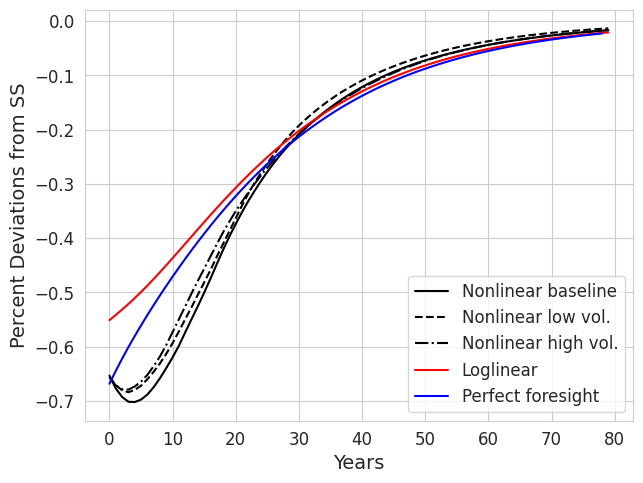

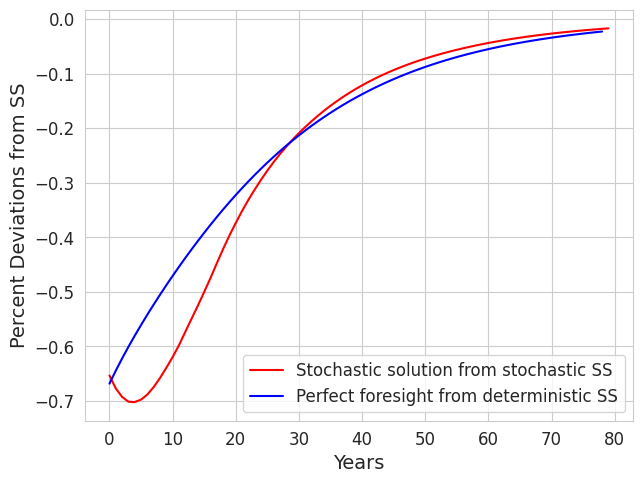

Sector: Construction


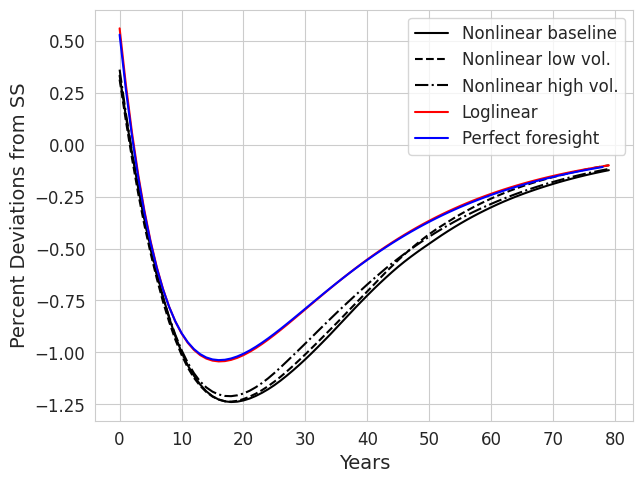

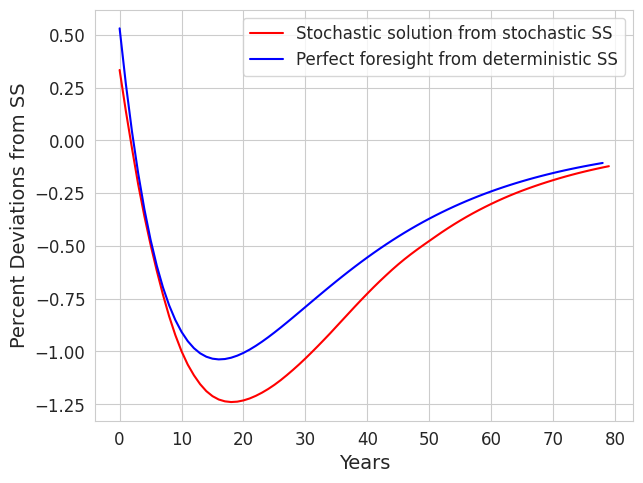

Sector: Machinery


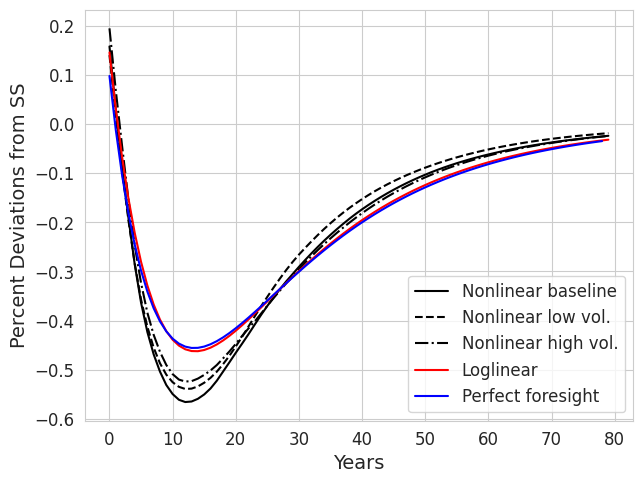

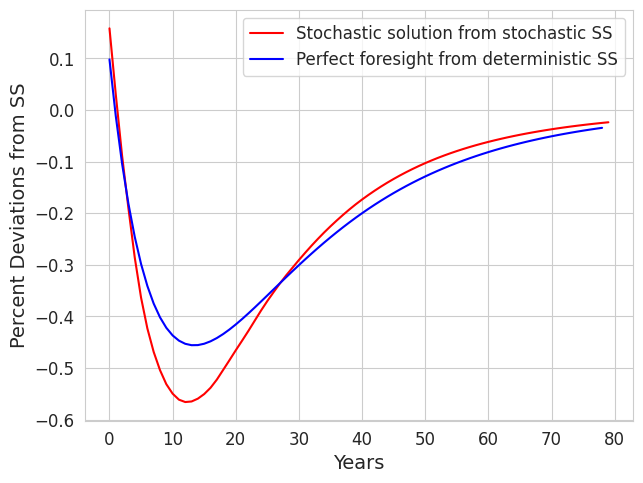

Sector: Petroleum


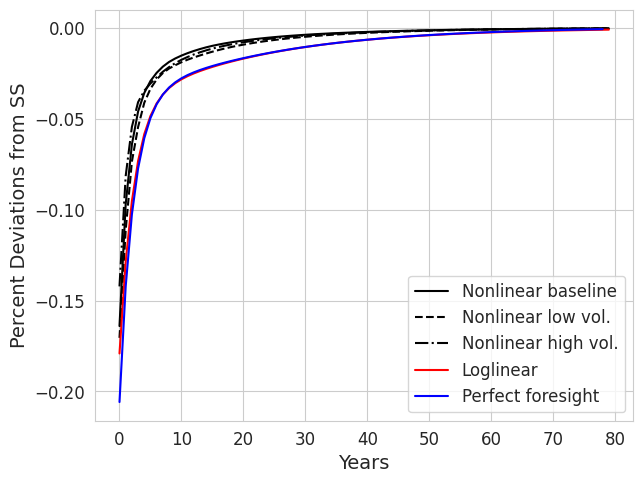

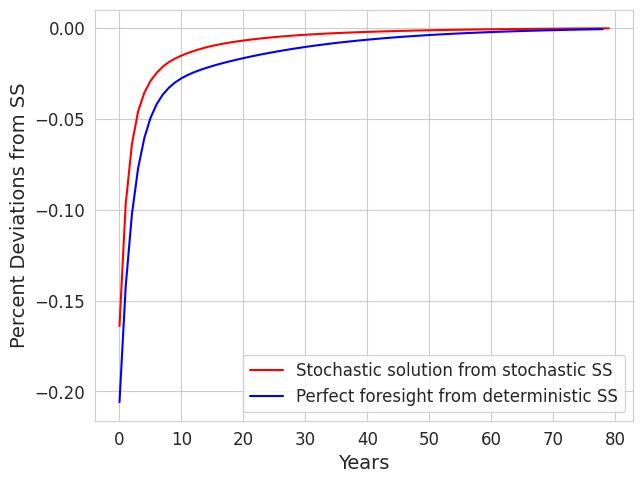

Sector: Retail


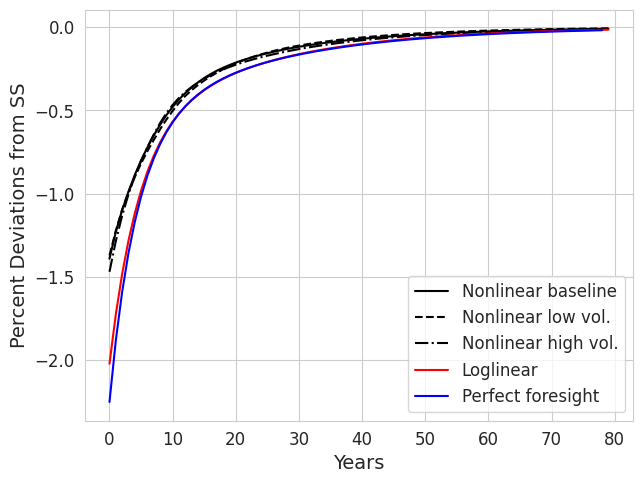

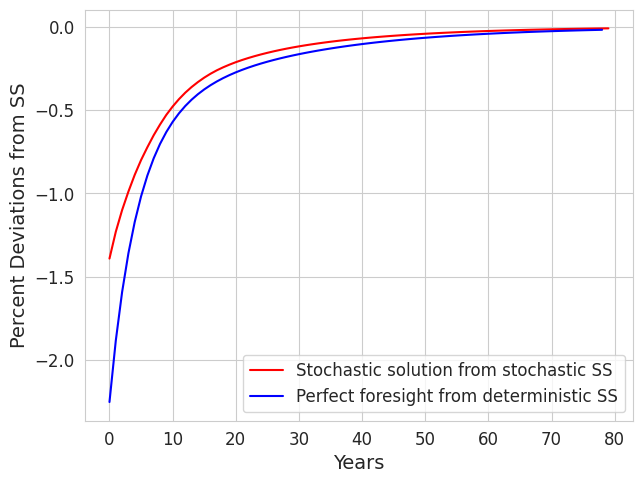

Sector: Real estate


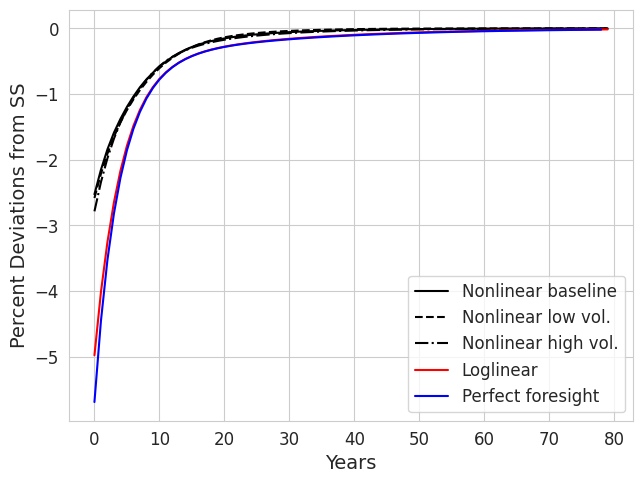

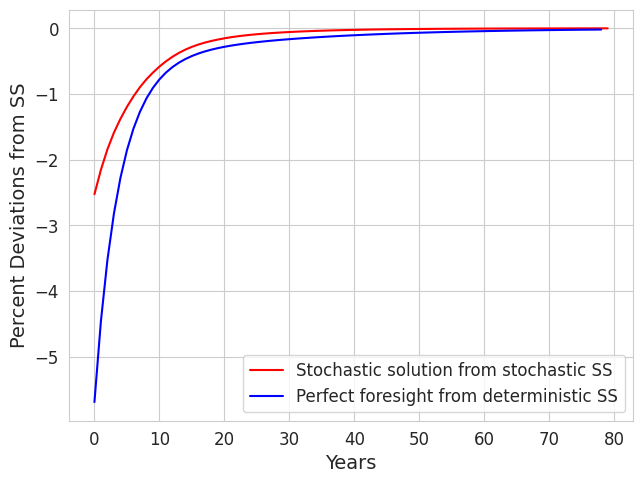

In [ ]:

econ_model = Model()
sectors_list = [1,3,8,20,24,28]
# sectors_list = [1]
for sector_index in sectors_list:
  print("Sector:", labels[sector_index-1])
  ir_traject, ir_traject_lowvol, ir_traject_highvol, ir_traject_loglinear = get_vsloglinear_trajects(econ_model,-0.2231,sector_index)
  IRs = IRs_All[f"Sector_{sector_index}"]
  ir_traject_determ = jnp.transpose(IRs["IRSDeterm"])[1:80,:]
  plot_fourtrajects_cons(ir_traject, ir_traject_lowvol, ir_traject_highvol, ir_traject_loglinear, ir_traject_determ, "IRs_vs_loglinear", "Nonlinear baseline", "Nonlinear low vol.", "Nonlinear high vol.",  "Loglinear", sector_index, econ_model)
  plot_twotrajects_cons(ir_traject, ir_traject_determ, "IRs_vs_determ", "Stochastic solution from stochastic SS",  "Perfect foresight from deterministic SS", sector_index, econ_model)



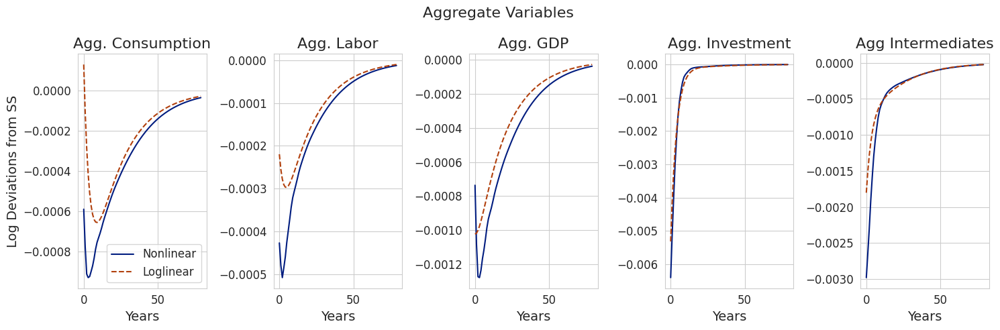

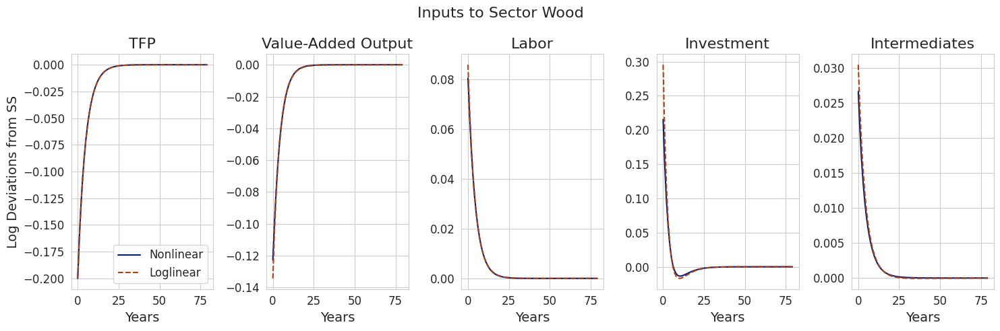

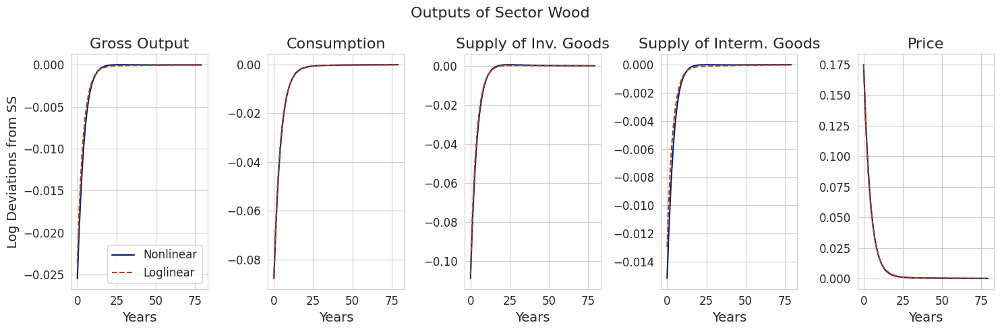

In [ ]:
# For sector 1
econ_model = Model()
sector_index = 4
ir_traject, _, _, ir_loglinear_traject = get_vsloglinear_trajects(econ_model,-0.2,sector_index)
plot_twotrajects(ir_traject,ir_loglinear_traject,"IRs_vs_loglinear", "Nonlinear", "Loglinear", sector_index, env)


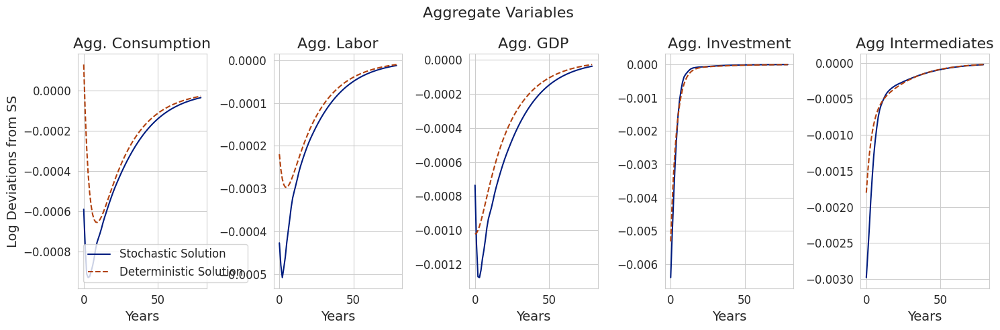

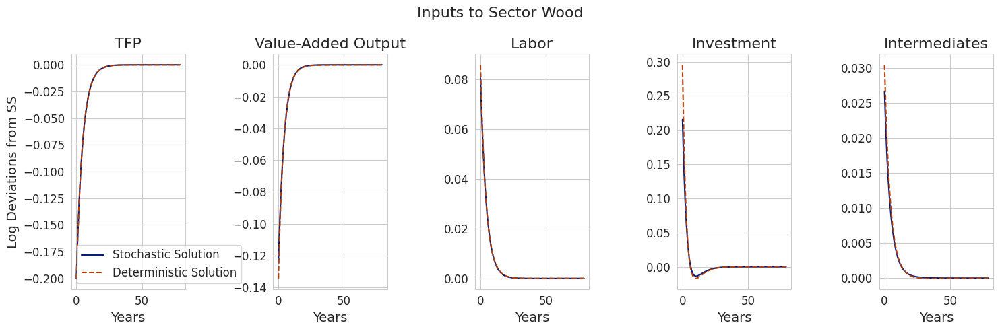

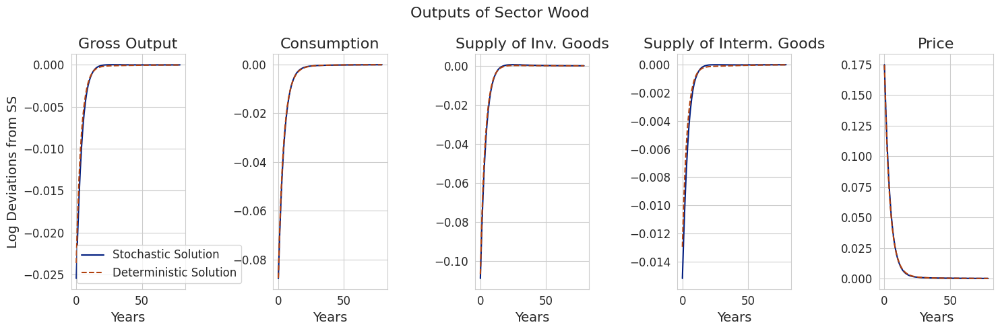

In [ ]:
econ_model = Model()
sector_index = 4
ir_traject, _, _, ir_loglinear_traject = get_vsloglinear_trajects(econ_model,-0.2,sector_index)
plot_twotrajects(ir_traject,ir_loglinear_traject,"IRs_vs_loglinear", "Stochastic Solution", "Deterministic Solution", sector_index, env)

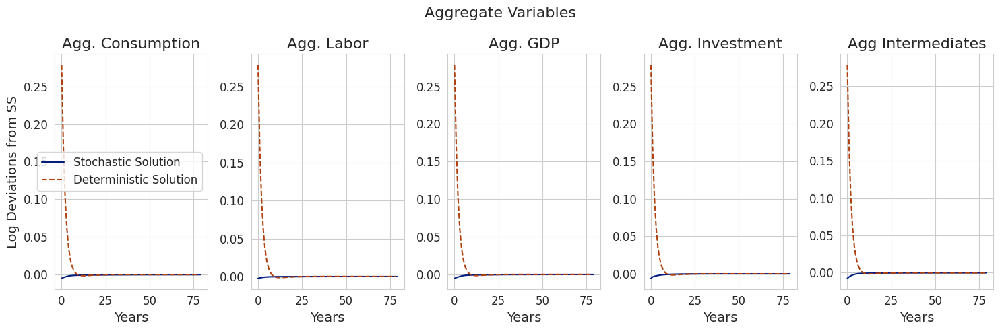

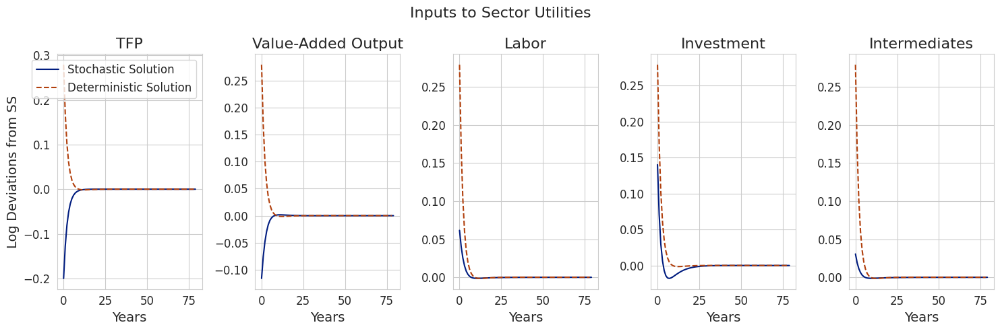

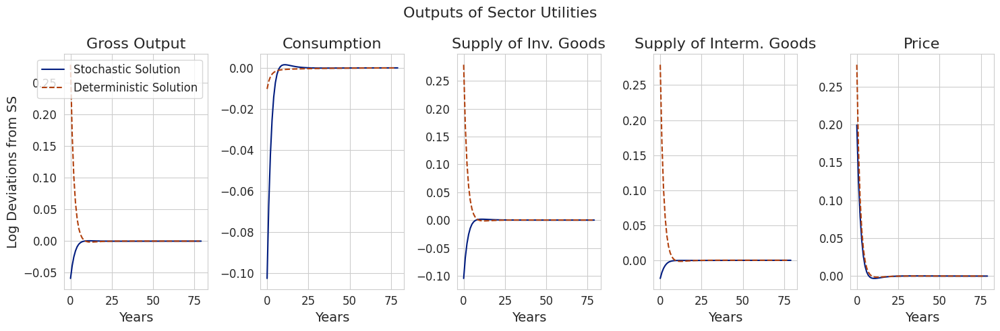

In [ ]:
# For sector 3
econ_model = Model()
sector_index = 2
IRs = IRs_All[f"Sector_{sector_index}"]
ir_traject_determ = jnp.transpose(IRs["IRSDeterm"])[1:80,:]
ir_traject, _, _, ir_loglinear_traject = get_vsloglinear_trajects(econ_model,-0.2,sector_index)
plot_twotrajects(ir_traject,ir_traject_determ,"Stochastic vs Deterministic", "Stochastic Solution", "Deterministic Solution", sector_index, env)

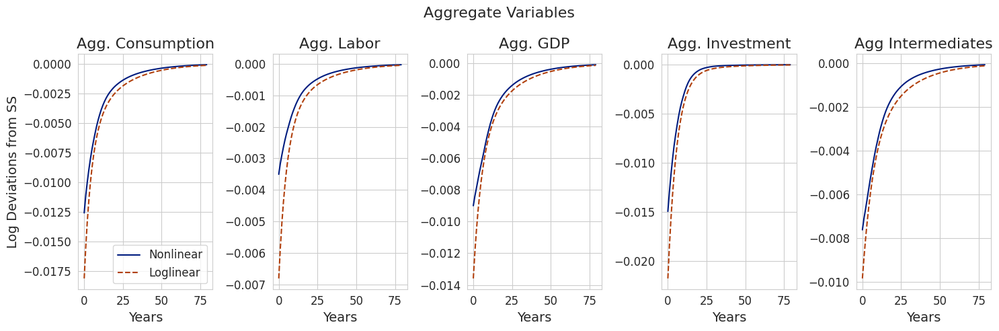

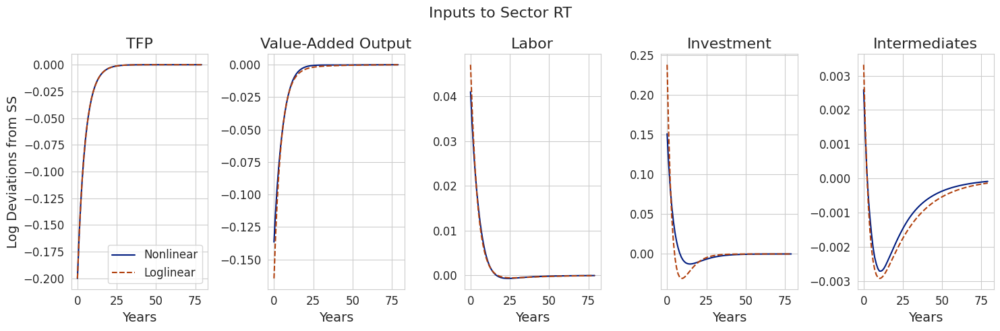

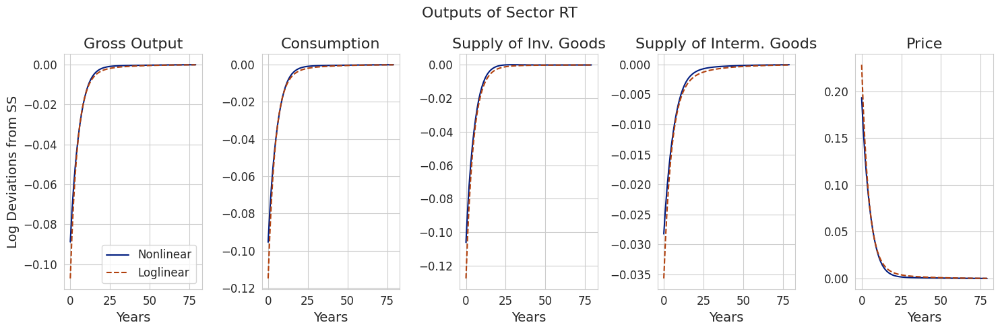

In [ ]:
# For sector 24
econ_model = Model()
sector_index = 24
ir_traject, _, _, ir_loglinear_traject = get_vsloglinear_trajects(econ_model,-0.2,sector_index)
plot_twotrajects(ir_traject,ir_loglinear_traject,"IRs_vs_loglinear", "Nonlinear", "Loglinear", sector_index, env)

## Possitve vs negative IRs

In [ ]:
def get_vspositive_trajects(econ_model, tfp_dev, sector_index):
  ir_shocks = jnp.zeros(shape=(80,econ_model.n_sectors), dtype = precision)
  tfp_dev_norm = tfp_dev/econ_model.states_sd[econ_model.n_sectors+sector_index-1]
  obs_init_stoch_1 = stoch_ss.at[36+sector_index].set(tfp_dev_norm)
  obs_init_stoch_2 = stoch_ss.at[36+sector_index].set(-tfp_dev_norm)

  _, ir_obspol_pairs_1 = simul_traject(econ_model, train_state, ir_shocks, obs_init_stoch_1)
  ir_obs_1 , ir_policy_1 = ir_obspol_pairs_1
  ir_policy_1 = ir_policy_1/policy_stoch_ss
  ir_policy_1 = jnp.log(ir_policy_1)
  ir_obs_1 = ir_obs_1*econ_model.obs_sd
  ir_sectfp_1 = ir_obs_1[:,36+sector_index]
  ir_sectfp_1 = ir_sectfp_1.reshape(-1, 1)
  ir_traject_1 = jnp.concatenate([ir_policy_1,ir_sectfp_1], axis=1)

  _, ir_obspol_pairs_2 = simul_traject(econ_model, train_state, ir_shocks, obs_init_stoch_2)
  ir_obs_2 , ir_policy_2 = ir_obspol_pairs_2
  ir_policy_2 = ir_policy_2/policy_stoch_ss
  ir_policy_2 = jnp.log(ir_policy_2)
  ir_obs_2 = ir_obs_2*econ_model.obs_sd
  ir_sectfp_2 = ir_obs_2[:,36+sector_index]
  ir_sectfp_2 = ir_sectfp_2.reshape(-1, 1)
  ir_traject_2 = jnp.concatenate([ir_policy_2,ir_sectfp_2], axis=1)

  return ir_traject_1, ir_traject_2



In [ ]:
# For sector 1
econ_model = Model()
sector_index = 5
ir_traject_neg, ir_traject_pos = get_vspositive_trajects(econ_model,-0.2,sector_index)
plot_twotrajects(ir_traject_neg,ir_traject_pos, "IRs_vs_positive", "negative shock","positive shock",sector_index, env)

Invalid nan value encountered in the output of a jax.jit function. Calling the de-optimized version.


FloatingPointError: invalid value (nan) encountered in log

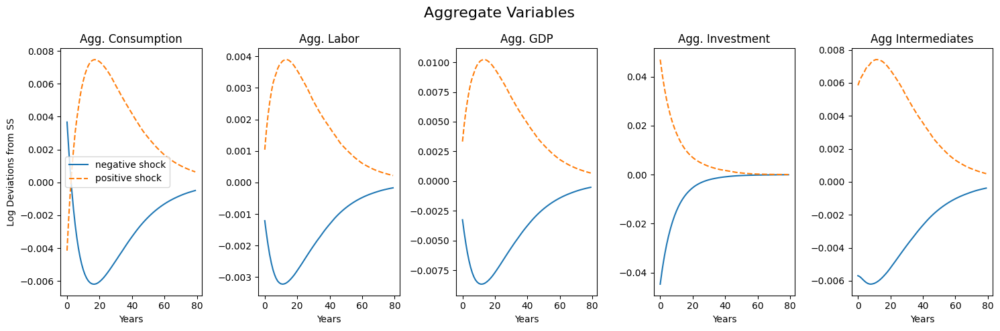

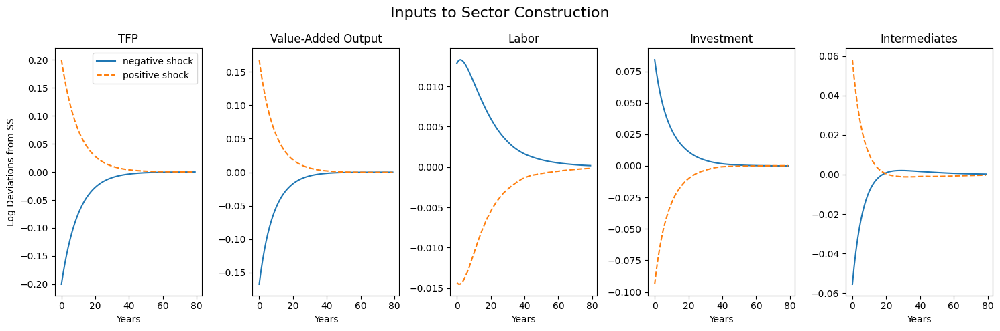

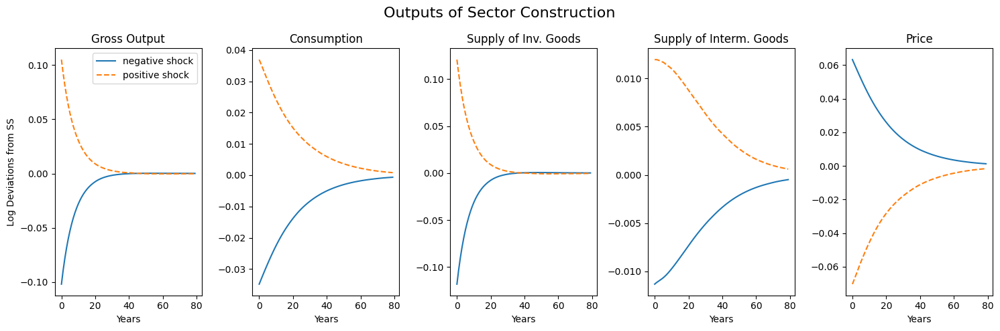

In [ ]:
# For sector 3
econ_model = Model()
sector_index = 3
ir_traject_neg, ir_traject_pos = get_vspositive_trajects(econ_model,-0.2,sector_index)
plot_twotrajects(ir_traject_neg,ir_traject_pos, "IRs_vs_positive", "negative shock","positive shock",sector_index, env)

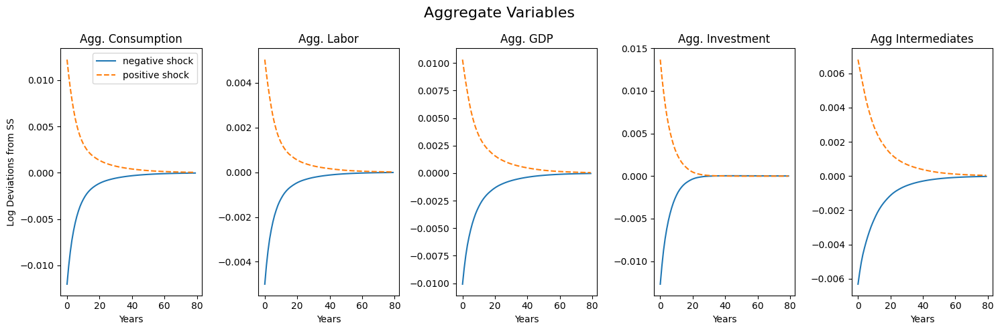

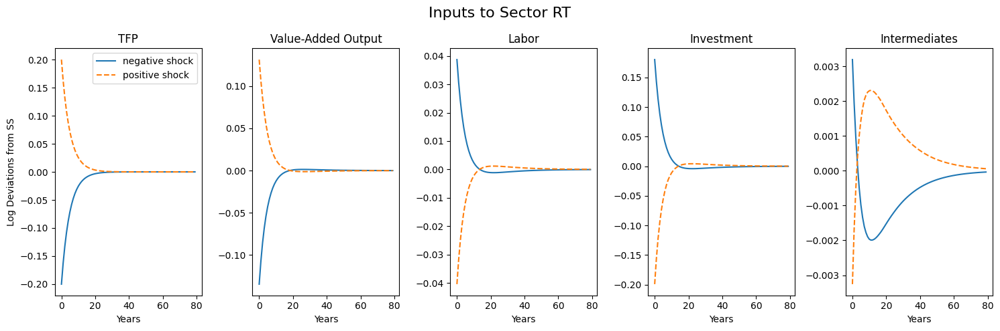

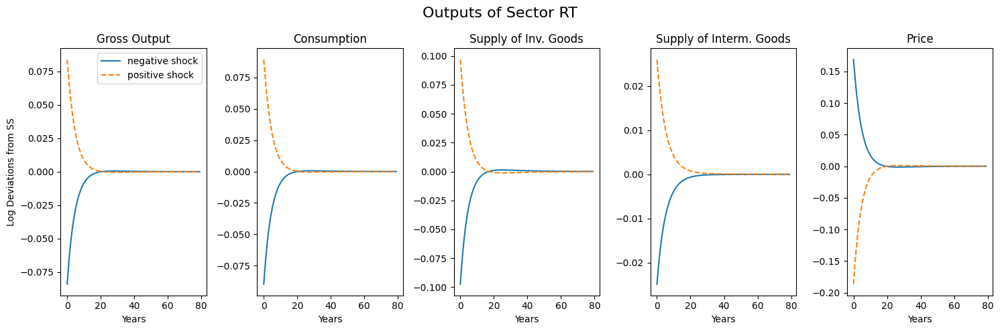

In [ ]:
# For sector 24
econ_model = Model()
sector_index = 24
ir_traject_neg, ir_traject_pos = get_vspositive_trajects(econ_model,-0.2,sector_index)
plot_twotrajects(ir_traject_neg,ir_traject_pos, "IRs_vs_positive", "negative shock","positive shock",sector_index, env)

## Small vs large shocks

In [ ]:
def get_vslarge_trajects(econ_model, tfp_dev, sector_index):
  ir_shocks = jnp.zeros(shape=(80,econ_model.n_sectors), dtype = precision)
  tfp_dev_norm = tfp_dev/econ_model.states_sd[econ_model.n_sectors+sector_index-1]
  obs_init_stoch_1 = stoch_ss.at[36+sector_index].set(tfp_dev_norm)
  obs_init_stoch_2 = stoch_ss.at[36+sector_index].set(2*tfp_dev_norm)

  _, ir_obspol_pairs_1 = simul_traject(econ_model, train_state, ir_shocks, obs_init_stoch_1)
  ir_obs_1 , ir_policy_1 = ir_obspol_pairs_1
  ir_policy_1 = ir_policy_1/policy_stoch_ss
  ir_policy_1 = jnp.log(ir_policy_1)
  ir_obs_1 = ir_obs_1*econ_model.obs_sd
  ir_sectfp_1 = ir_obs_1[:,36+sector_index]
  ir_sectfp_1 = ir_sectfp_1.reshape(-1, 1)
  ir_traject_1 = jnp.concatenate([ir_policy_1,ir_sectfp_1], axis=1)

  _, ir_obspol_pairs_2 = simul_traject(econ_model, train_state, ir_shocks, obs_init_stoch_2)
  ir_obs_2 , ir_policy_2 = ir_obspol_pairs_2
  ir_policy_2 = ir_policy_2/policy_stoch_ss
  ir_policy_2 = jnp.log(ir_policy_2)
  ir_obs_2 = ir_obs_2*econ_model.obs_sd
  ir_sectfp_2 = ir_obs_2[:,36+sector_index]
  ir_sectfp_2 = ir_sectfp_2.reshape(-1, 1)
  ir_traject_2 = jnp.concatenate([ir_policy_2,ir_sectfp_2], axis=1)

  return ir_traject_1, ir_traject_2

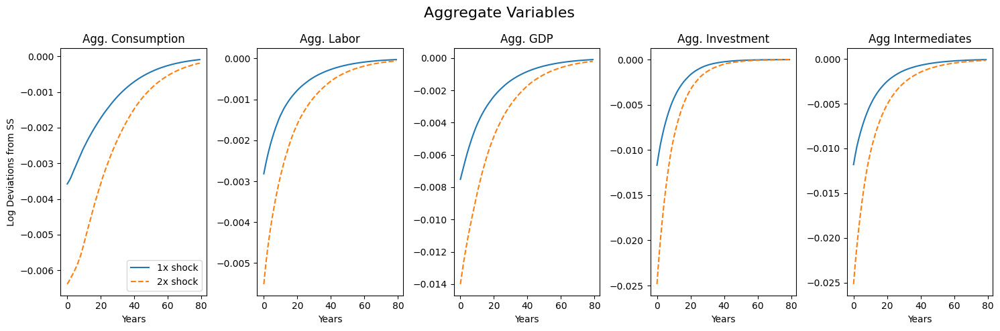

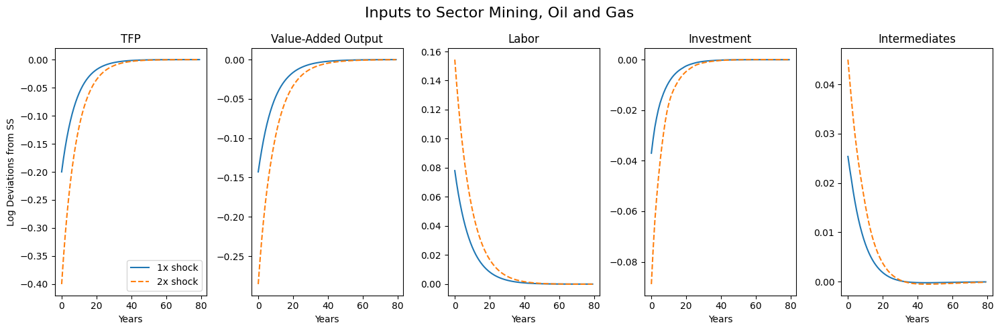

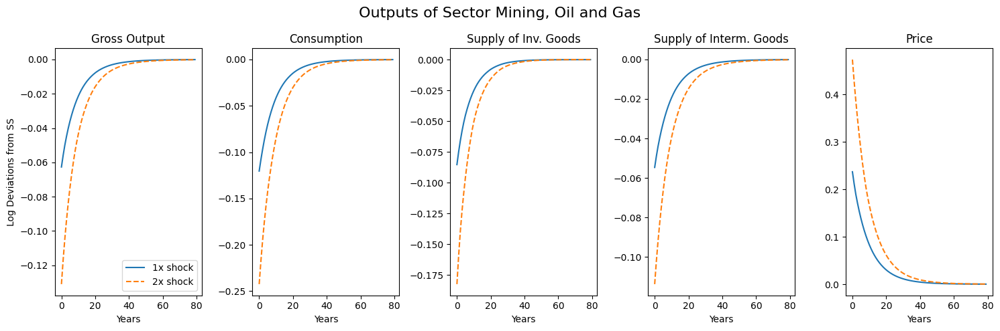

In [ ]:
# For sector 1
econ_model = Model()
sector_index = 1
ir_traject_1x, ir_traject_2x = get_vslarge_trajects(econ_model,-0.2,sector_index)
plot_twotrajects(ir_traject_1x,ir_traject_2x,"IRs_vs_largershock", "1x shock","2x shock",sector_index, env)

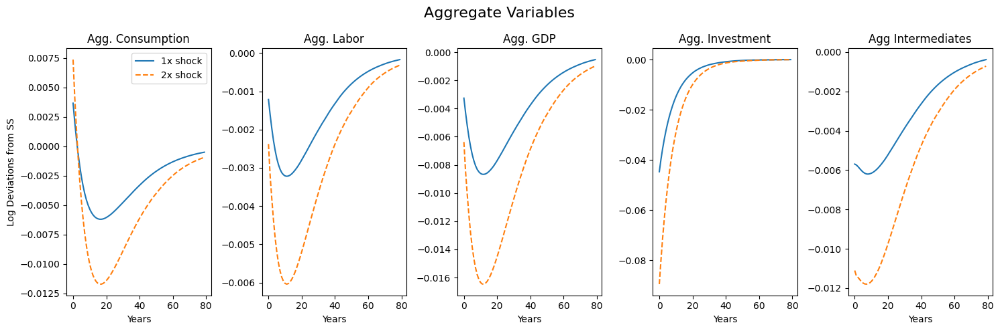

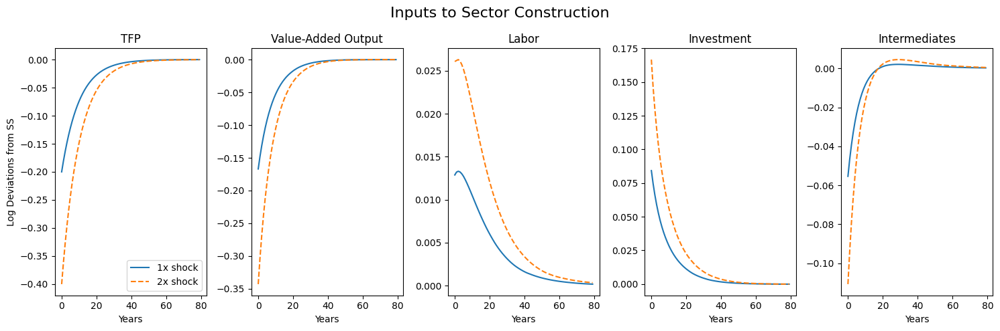

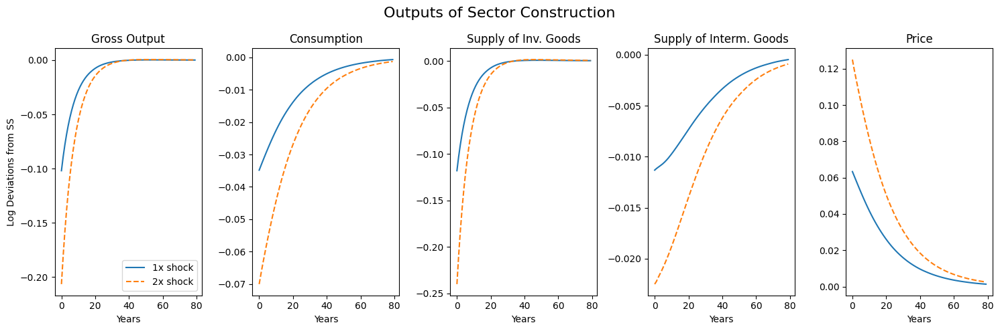

In [ ]:
# For sector 3
econ_model = Model()
sector_index = 3
ir_traject_1x, ir_traject_2x = get_vslarge_trajects(econ_model,-0.2,sector_index)
plot_twotrajects(ir_traject_1x,ir_traject_2x,"IRs_vs_largershock", "1x shock","2x shock",sector_index, env)

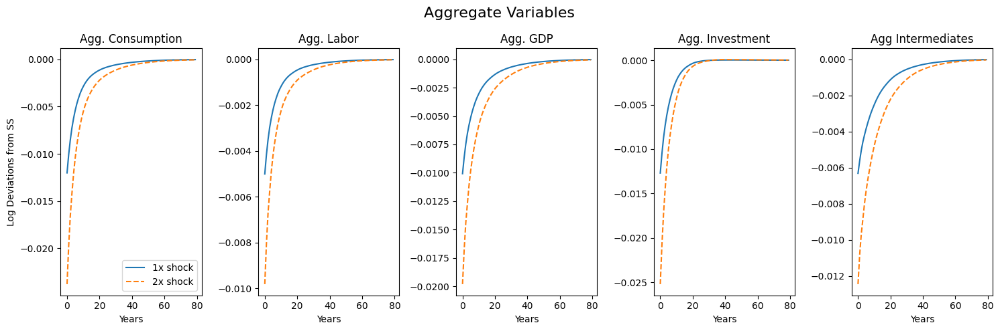

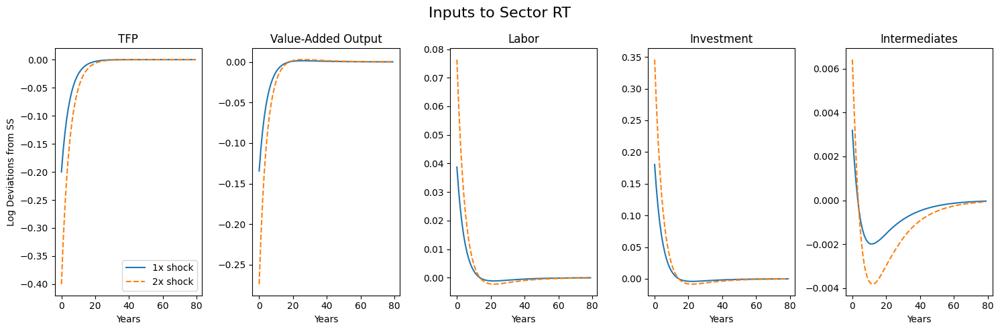

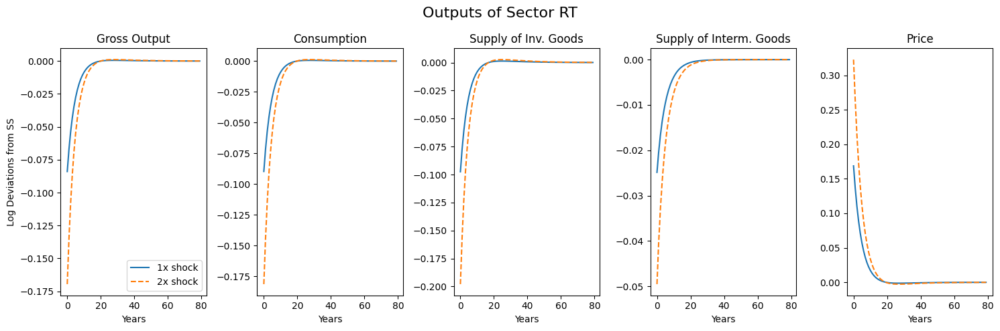

In [ ]:
# For sector 24
econ_model = Model()
sector_index = 24
ir_traject_1x, ir_traject_2x = get_vslarge_trajects(econ_model,-0.2,sector_index)
plot_twotrajects(ir_traject_1x,ir_traject_2x,"IRs_vs_largershock", "1x shock","2x shock",sector_index, env)

## Generalized Impulse responses

In [ ]:
def random_draws(simul_obs, n_draws, seed=0):
    n_simul = simul_obs.shape[0]
    key = jax.random.PRNGKey(seed)
    indices = jax.random.choice(key, n_simul, shape=(n_draws,), replace=False)
    obs_draws = simul_obs[indices, :]
    return obs_draws

def simul_traject_lastobs(env, train_state, shocks, obs_init):
  def step(obs, shock):
    policy = train_state.apply_fn(train_state.params, obs)
    next_obs = env.step(obs, policy, shock)
    obs_pol_pair = (obs,policy)
    return next_obs, obs_pol_pair
  final_obs, _ = lax.scan(step, obs_init, shocks)
  return final_obs


sample_fromdist = random_draws(simul_obs, 1000)
sample_fromdist_loglinear = random_draws(simul_obs_loglinear, 1000)
zero_shocks = jnp.zeros(shape=(300,env.n_sectors), dtype = precision)

stoch_ss = jax.vmap(simul_traject_lastobs, on_axes = (None,None,None,0))(sample_fromdist)
print(stoch_ss)

## Attenuation and Amplifcation

In [ ]:
def calculate_peak_and_half_life(IR):
    """
    Calculate peak value, peak period, and half-life for a single impulse response.

    Parameters:
    -----------
    IR : numpy.ndarray
        A 1D array representing the impulse response.

    Returns:
    --------
    peak_value : float
        The peak value of the impulse response.
    peak_period : int
        The period at which the peak value occurs.
    half_life : int or float
        The half-life of the impulse response, or np.nan if not observed.
    """

    # Find the maximum absolute value and its index
    max_idx = np.argmax(np.abs(IR))
    peak_value = IR[max_idx]  # Get the actual value with its sign

    # Assign the peak period
    peak_period = max_idx

    half_val = peak_value / 2

    # For half-life calculation, account for positive/negative peaks
    if peak_value > 0:
        # For positive peaks, find when it drops below half the peak
        half_life_idx = np.where((IR <= half_val) & (np.arange(IR.size) > max_idx))[0]
    else:
        # For negative peaks, find when it rises above half the peak
        half_life_idx = np.where((IR >= half_val) & (np.arange(IR.size) > max_idx))[0]

    if half_life_idx.size == 0:
        half_life = np.nan  # Not observed within the period
    else:
        half_life = half_life_idx[0]

    return peak_value, peak_period, half_life

In [ ]:
determ_nonlinearities = []
uncertain_nonlinearities = []
uncertainties = []
peak_values = []
peak_values_loglin = []
peak_values_determ = []

for sector_index in range(37):
  ir_traject, ir_traject_lowvol, ir_traject_highvol, ir_traject_loglinear = get_vsloglinear_trajects(econ_model,-0.2231,sector_index+1)
  IRs = IRs_All[f"Sector_{sector_index+1}"]
  ir_traject_determ = jnp.transpose(IRs["IRSDeterm"])[1:80,:]
  Cagg = ir_traject[:,11*37]
  Cagg_lowvol = ir_traject_lowvol[:,11*37]
  Cagg_highvol = ir_traject_highvol[:,11*37]
  Cagg_loglinear = ir_traject_loglinear[:,11*37]
  Cagg_determ = ir_traject_determ[:,1]
  peak_value, _, _ = calculate_peak_and_half_life(Cagg)
  peak_value_lowvol, _, _ = calculate_peak_and_half_life(Cagg_lowvol)
  peak_value_highvol, _, _ = calculate_peak_and_half_life(Cagg_highvol)
  peak_value_loglin = IRs_All["peak_values_loglin"][sector_index]
  peak_value_determ = IRs_All["peak_values_determ"][sector_index]
  # if peak_value>0 or peak_value_loglin>0 or peak_value_determ>0:
  #   continue
  determ_nonlinearity = (peak_value_determ-peak_value_loglin)/peak_value_loglin
  uncertain_nonlinearity = (peak_value-peak_value_loglin)/peak_value_loglin
  uncertainty = (peak_value-peak_value_determ)/peak_value_determ
  peak_values.append(float(peak_value))
  peak_values_loglin.append(float(peak_value_loglin))
  peak_values_determ.append(float(peak_value_determ))
  determ_nonlinearities.append(float(determ_nonlinearity))
  uncertain_nonlinearities.append(float(uncertain_nonlinearity))
  uncertainties.append(float(uncertainty))

print(peak_values)
print(peak_values_loglin)
print(peak_values_determ)
print(determ_nonlinearities)
print(uncertain_nonlinearities)
print(uncertainties)



[-0.0039014152988998342, -0.004544188164598912, -0.006850319022784326, 0.0007614125274281457, -0.0007276472472415831, -0.0006389542570750293, -0.0006552181885696425, -0.0031993651434122417, -0.001235623442341002, -0.00019249397773811843, -0.0007080466699167246, 0.00030489384438152773, 0.0004331150452068409, -0.0003325112847010524, -0.0025383990741564004, -0.0005383433224008528, -0.0020247625404704894, -0.0009338730651763471, 0.0006503050294497291, -0.0013878389693858292, -0.004366430501666657, -0.00045277116334558086, -0.0051308431107093605, -0.013420632271337824, -0.002487149176796957, -0.0036141897952580776, -0.006424544465266218, -0.033790551087624084, -0.005046902624879078, -0.0004827124432093907, -0.0011610409324906723, -0.0009443408284122486, -0.010840318925259163, -0.0031705681780736937, -0.005989855976275602, -0.003557986367057078, -0.00542109864890271]
[-0.005786681683044803, -0.008680470052932876, -0.01008375390479238, -0.0007092343037276572, -0.0007236689580254474, -0.001357

In [ ]:
print(np.mean(determ_nonlinearities), np.mean(uncertain_nonlinearities), np.mean(uncertainties))

0.12318006235039566 -0.4002081063537031 -0.46363626136077596


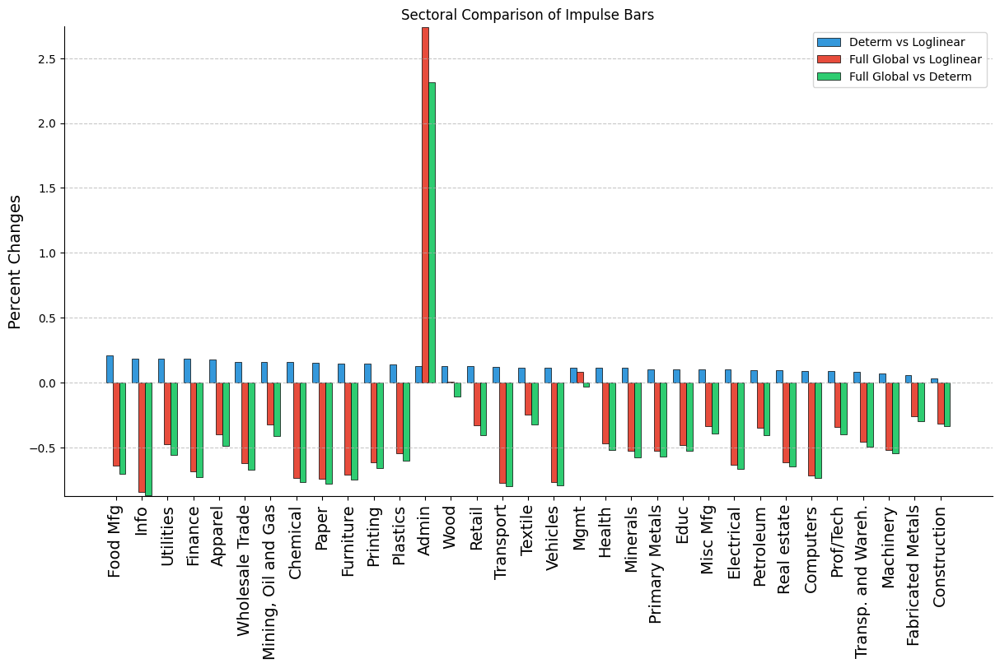

In [ ]:
def create_bars_comparative(
    variable_vector_1, variable_vector_2, variable_vector_3, title, legends, save_label, sector_labels
):
    # Get the sorting order based on variable_vector_3 (descending)
    sorted_indices = np.argsort(variable_vector_1)[::-1]

    # Sort all vectors and labels according to variable_vector_3
    sorted_vector_1 = np.array(variable_vector_1)[sorted_indices]
    sorted_vector_2 = np.array(variable_vector_2)[sorted_indices]
    sorted_vector_3 = np.array(variable_vector_3)[sorted_indices]
    sorted_labels = [sector_labels[i] for i in sorted_indices]

    # Create a bar chart
    fig, ax = plt.subplots(figsize=(12, 8))
    bar_width = 0.25
    index = np.arange(len(sorted_vector_1))

    bars1 = ax.bar(
        index - bar_width,
        sorted_vector_1,
        bar_width,
        color="#3498db",
        edgecolor="black",
        linewidth=0.5,
    )
    bars2 = ax.bar(
        index,
        sorted_vector_2,
        bar_width,
        color="#e74c3c",
        edgecolor="black",
        linewidth=0.5,
    )
    bars3 = ax.bar(
        index + bar_width,
        sorted_vector_3,
        bar_width,
        color="#2ecc71",
        edgecolor="black",
        linewidth=0.5,
    )

    # Update y-axis limits to use sorted vectors
    ax.set_ylim(
        min(min(sorted_vector_1), min(sorted_vector_2), min(sorted_vector_3)) - 0.005,
        max(max(sorted_vector_1), max(sorted_vector_2), max(sorted_vector_3)) + 0.005,
    )

    # Update x-axis labels with sorted labels
    ax.set_xticks(index)
    ax.set_xticklabels(sorted_labels, rotation=90, ha="center", fontsize=14)

    # Customize layout and display the chart
    ax.grid(axis="y", linestyle="--", alpha=0.7)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    plt.tight_layout()
    plt.title(title)
    plt.ylabel(f"Percent Changes", fontsize=14)
    plt.legend(legends)

    # Save figure
    fig.savefig(
        config_simul["save_dir"]
        + config_simul["restore_exper_name"]
        + f"/{save_label}.jpg",
        bbox_inches="tight",
        pad_inches=1,
    )
    plt.show()

create_bars_comparative(
    determ_nonlinearities, uncertain_nonlinearities, uncertainties, "Sectoral Comparison of Impulse Bars", ["Determ vs Loglinear","Full Global vs Loglinear", "Full Global vs Determ"] ,"ImpulseBars", labels
)


# Welfare

We start by creating a function that samples from ergodic distribution

In [ ]:
def get_welfare_fn(n_trajects, traject_length, env):

  def discounted_utility(utilities, beta):
    discount_factors = jnp.array([beta ** t for t in range(len(utilities))])
    present_value = jnp.sum(utilities * discount_factors)
    return present_value

  def get_traject_welfare(Ctraj, Ltraj):
    utilities = jax.vmap(env.utility)(Ctraj,Ltraj)
    utilities_Css = jax.vmap(env.utility)(jnp.ones_like(Ctraj),Ltraj)
    utilities_Lss = jax.vmap(env.utility)(Ctraj,jnp.ones_like(Ltraj))
    welfare_traj = discounted_utility(utilities,env.beta)
    welfare_traj_Css = discounted_utility(utilities_Css,env.beta)
    welfare_traj_Lss = discounted_utility(utilities_Lss,env.beta)
    return welfare_traj, welfare_traj_Css, welfare_traj_Lss

  def welfare_fn(data):
    C_simul = data[:,11*env.n_sectors]
    L_simul = data[:,11*env.n_sectors+1]
    # Generate random start indices for sampling
    start_indices = jax.random.randint(jax.random.PRNGKey(0), (n_trajects,), 0, data.shape[0] - traject_length + 1)

    # Sample trajectories
    C_trajects = jnp.array([C_simul[start_index:start_index + traject_length] for start_index in start_indices])
    L_trajects = jnp.array([L_simul[start_index:start_index + traject_length] for start_index in start_indices])
    # Get welfare
    welfares, welfares_Css, welfares_Lss = jax.vmap(get_traject_welfare)(C_trajects, L_trajects)
    # average across trajectories
    mean_welfare, mean_welfare_Css, mean_welfare_Lss = jnp.mean(welfares), jnp.mean(welfares_Css), jnp.mean(welfares_Lss)

    return mean_welfare, mean_welfare_Css, mean_welfare_Lss

  return welfare_fn

# inputs to welfare fn
env = Model()
n_trajects = 1000
traject_length = 2000

# Steady state welfare
utility_ss = env.utility(1,1)
welfare_ss = utility_ss/(1-env.beta)

# Welfare of nonlinear and loglinear simulation
welfare_fn = get_welfare_fn(n_trajects, traject_length, env)
simul_policies = jnp.exp(simul_policies*policies_sd)
simul_policies_loglinear = jnp.exp(simul_policies_loglinear*policies_sd)
welfare_nonlinear, welfare_Css_nonlinear,welfare_Lss_nonlinear = welfare_fn(simul_policies)
welfare_loglinear, welfare_Css_loglinear,welfare_Lss_loglinear = welfare_fn(simul_policies_loglinear)
simul_ssmean = simul_policies + (1-jnp.mean(simul_policies,axis=0))
welfare_ssmean, welfare_Css_ssmean,welfare_Lss_ssmean = welfare_fn(simul_ssmean)


print("Welfares", welfare_nonlinear, welfare_loglinear, welfare_ss)
# Consumption equivalent welfare
Css = jnp.exp(env.policies_ss[11*env.n_sectors])
Lss = jnp.exp(env.policies_ss[11*env.n_sectors+1])

Vc = 1/Css * ( (welfare_nonlinear*(1-env.beta)*(1-env.eps_c**(-1)))**(1/(1-env.eps_c**(-1))) + env.theta *(1/(1+env.eps_l**(-1)))*Lss**(1+env.eps_l**(-1)) )-1
Vc_Css = 1/Css * ( (welfare_Css_nonlinear*(1-env.beta)*(1-env.eps_c**(-1)))**(1/(1-env.eps_c**(-1))) + env.theta *(1/(1+env.eps_l**(-1)))*Lss**(1+env.eps_l**(-1)) )-1
Vc_Lss = 1/Css * ( (welfare_Lss_nonlinear*(1-env.beta)*(1-env.eps_c**(-1)))**(1/(1-env.eps_c**(-1))) + env.theta *(1/(1+env.eps_l**(-1)))*Lss**(1+env.eps_l**(-1)) )-1

Vc_loglinear = 1/Css * ( (welfare_loglinear*(1-env.beta)*(1-env.eps_c**(-1)))**(1/(1-env.eps_c**(-1))) + env.theta *(1/(1+env.eps_l**(-1)))*Lss**(1+env.eps_l**(-1)) )-1
Vc_Css_loglinear = 1/Css * ( (welfare_Css_loglinear*(1-env.beta)*(1-env.eps_c**(-1)))**(1/(1-env.eps_c**(-1))) + env.theta *(1/(1+env.eps_l**(-1)))*Lss**(1+env.eps_l**(-1)) )-1
Vc_Lss_loglinear = 1/Css * ( (welfare_Lss_loglinear*(1-env.beta)*(1-env.eps_c**(-1)))**(1/(1-env.eps_c**(-1))) + env.theta *(1/(1+env.eps_l**(-1)))*Lss**(1+env.eps_l**(-1)) )-1

Vc_ssmean = 1/Css * ( (welfare_ssmean*(1-env.beta)*(1-env.eps_c**(-1)))**(1/(1-env.eps_c**(-1))) + env.theta *(1/(1+env.eps_l**(-1)))*Lss**(1+env.eps_l**(-1)) )-1
Vc_Css_ssmean = 1/Css * ( (welfare_Css_ssmean*(1-env.beta)*(1-env.eps_c**(-1)))**(1/(1-env.eps_c**(-1))) + env.theta *(1/(1+env.eps_l**(-1)))*Lss**(1+env.eps_l**(-1)) )-1
Vc_Lss_ssmean = 1/Css * ( (welfare_Lss_ssmean*(1-env.beta)*(1-env.eps_c**(-1)))**(1/(1-env.eps_c**(-1))) + env.theta *(1/(1+env.eps_l**(-1)))*Lss**(1+env.eps_l**(-1)) )-1

# print("Welfare loss due to nonlinearties", 1-welfare_nonlinear/welfare_loglinear)
print("Welfare cost of business cycles", Vc, Vc_Css, Vc_Lss)
print("Welfare cost of loglinear business cycles", Vc_loglinear, Vc_Css_loglinear, Vc_Lss_loglinear)
print("Welfare cost of business cycle with SS mean", Vc_ssmean, Vc_Css_ssmean, Vc_Lss_ssmean)



Welfares -25.163825639036972 -25.027097694544967 -24.999999999999968
Welfare cost of business cycles -0.0048121263827651806 0.0013880651325981486 -0.007074011641629907
Welfare cost of loglinear business cycles -0.0008003015821879123 -0.00017848070600001709 -0.0014811593675484458
Welfare cost of business cycle with SS mean -0.0016721406956369256 9.633441480438876e-05 -0.002640047633535869


# Evaluate loss

## Create Loss function

In [ ]:
def create_batch_loss_fn(env, config):

  if config["proxy_mcsampler"] and config["proxy_futurepol"]:
    def batch_loss_fn(params, train_state, batch_obs, loss_rng):
      """Loss function of a batch of obs."""
      period_mc_rngs = random.split(loss_rng, batch_obs.shape[0])
      batch_policies = train_state.apply_fn(params, batch_obs) # get the policies for the entire obs batch.
      def period_loss(obs, policy, period_mc_rng):
        """Loss function for an individual period."""
        mc_shocks = env.mc_shocks(period_mc_rng, config["mc_draws"])
        mc_nextobs = jax.vmap(env.step_loglinear, in_axes = (None,0))(obs, mc_shocks)
        # print("shape of mc_nextobs")
        mc_nextpols = jax.vmap(env.policy_loglinear)(mc_nextobs)
        # print("shape of mc_nexpols", )
        expect = jnp.mean(jax.vmap(env.expect_realization)(mc_nextobs, mc_nextpols), axis=0)
        mean_loss, mean_accuracy, min_accuracy, mean_accs_foc, min_accs_foc = env.loss(obs, expect, policy) # calculate loss
        return mean_loss, mean_accuracy, min_accuracy, mean_accs_foc, min_accs_foc

      # parallelize callculation of period_loss for the entire batch
      mean_losses, mean_accuracies, min_accuracies, mean_accs_foc, min_accs_foc = jax.vmap(period_loss)(batch_obs, batch_policies, jnp.stack(period_mc_rngs))
      mean_loss = jnp.mean(mean_losses)                   # average accross periods
      mean_accuracy = jnp.mean(mean_accuracies)           # average accross periods
      min_accuracy = jnp.min(min_accuracies)              # min accross periods and across eqs within period
      mean_accs_foc = jnp.mean(mean_accs_foc,axis=0)
      min_accs_foc = jnp.min(min_accs_foc,axis=0)
      metrics = mean_loss, mean_accuracy, min_accuracy, mean_accs_foc, min_accs_foc # pass as auxiliary info
      return mean_loss, metrics

  elif config["proxy_mcsampler"] and not config["proxy_futurepol"]:
    def batch_loss_fn(params, train_state, batch_obs, loss_rng):
      """Loss function of a batch of obs."""
      period_mc_rngs = random.split(loss_rng, batch_obs.shape[0])
      batch_policies = train_state.apply_fn(params, batch_obs) # get the policies for the entire obs batch.

      def period_loss(obs, policy, period_mc_rng):
        """Loss function for an individual period."""
        mc_shocks = env.mc_shocks(period_mc_rng, config["mc_draws"])
        mc_nextobs = jax.vmap(env.step_loglinear, in_axes = (None,0))(obs, mc_shocks)
        mc_nextpols = train_state.apply_fn(params, mc_nextobs)
        expect = jnp.mean(jax.vmap(env.expect_realization)(mc_nextobs, mc_nextpols), axis=0)
        mean_loss, mean_accuracy, min_accuracy, mean_accs_foc, min_accs_foc = env.loss(obs, expect, policy) # calculate loss
        return mean_loss, mean_accuracy, min_accuracy, mean_accs_foc, min_accs_foc

      # parallelize callculation of period_loss for the entire batch
      mean_losses, mean_accuracies, min_accuracies, mean_accs_foc, min_accs_foc = jax.vmap(period_loss)(batch_obs, batch_policies, jnp.stack(period_mc_rngs))
      mean_loss = jnp.mean(mean_losses)                   # average accross periods
      mean_accuracy = jnp.mean(mean_accuracies)           # average accross periods
      min_accuracy = jnp.min(min_accuracies)              # min accross periods and across eqs within period
      mean_accs_foc = jnp.mean(mean_accs_foc,axis=0)
      min_accs_foc = jnp.min(min_accs_foc,axis=0)
      metrics = mean_loss, mean_accuracy, min_accuracy, mean_accs_foc, min_accs_foc # pass as auxiliary info
      return mean_loss, metrics

  elif not config["proxy_mcsampler"] and config["proxy_futurepol"]:
    def batch_loss_fn(params, train_state, batch_obs, loss_rng):
      """Loss function of a batch of obs."""
      period_mc_rngs = random.split(loss_rng, batch_obs.shape[0])
      batch_policies = train_state.apply_fn(params, batch_obs) # get the policies for the entire obs batch.

      def period_loss(obs, policy, period_mc_rng):
        """Loss function for an individual period."""
        mc_shocks = env.mc_shocks(period_mc_rng, config["mc_draws"])
        mc_nextobs = jax.vmap(env.step, in_axes = (None,None,0))(obs, policy, mc_shocks)
        mc_nextpols = jnp.ones_like(train_state.apply_fn(params, mc_nextobs))
        expect = jnp.mean(jax.vmap(env.expect_realization)(mc_nextobs, mc_nextpols), axis=0)
        mean_loss, mean_accuracy, min_accuracy, mean_accs_foc, min_accs_foc = env.loss(obs, expect, policy) # calculate loss
        return mean_loss, mean_accuracy, min_accuracy, mean_accs_foc, min_accs_foc

     # parallelize callculation of period_loss for the entire batch
      mean_losses, mean_accuracies, min_accuracies, mean_accs_foc, min_accs_foc = jax.vmap(period_loss)(batch_obs, batch_policies, jnp.stack(period_mc_rngs))
      mean_loss = jnp.mean(mean_losses)                   # average accross periods
      mean_accuracy = jnp.mean(mean_accuracies)           # average accross periods
      min_accuracy = jnp.min(min_accuracies)              # min accross periods and across eqs within period
      mean_accs_foc = jnp.mean(mean_accs_foc,axis=0)
      min_accs_foc = jnp.min(min_accs_foc,axis=0)
      metrics = mean_loss, mean_accuracy, min_accuracy, mean_accs_foc, min_accs_foc # pass as auxiliary info
      return mean_loss, metrics
  else:
    def batch_loss_fn(params, train_state, batch_obs, loss_rng):
      """Loss function of a batch of obs."""
      period_mc_rngs = random.split(loss_rng, batch_obs.shape[0])
      batch_policies = train_state.apply_fn(params, batch_obs) # get the policies for the entire obs batch.

      def period_loss(obs, policy, period_mc_rng):
        """Loss function for an individual period."""
        mc_shocks = env.mc_shocks(period_mc_rng, config["mc_draws"])
        mc_nextobs = jax.vmap(env.step, in_axes = (None,None,0))(obs, policy, mc_shocks)
        mc_nextpols = train_state.apply_fn(params, mc_nextobs)
        expect = jnp.mean(jax.vmap(env.expect_realization)(mc_nextobs, mc_nextpols), axis=0)
        mean_loss, mean_accuracy, min_accuracy, mean_accs_foc, min_accs_foc = env.loss(obs, expect, policy) # calculate loss
        return mean_loss, mean_accuracy, min_accuracy, mean_accs_foc, min_accs_foc

      # parallelize callculation of period_loss for the entire batch
      mean_losses, mean_accuracies, min_accuracies, mean_accs_foc, min_accs_foc = jax.vmap(period_loss)(batch_obs, batch_policies, jnp.stack(period_mc_rngs))
      mean_loss = jnp.mean(mean_losses)                   # average accross periods
      mean_accuracy = jnp.mean(mean_accuracies)           # average accross periods
      min_accuracy = jnp.min(min_accuracies)              # min accross periods and across eqs within period
      mean_accs_foc = jnp.mean(mean_accs_foc,axis=0)
      min_accs_foc = jnp.min(min_accs_foc,axis=0)
      metrics = mean_loss, mean_accuracy, min_accuracy, mean_accs_foc, min_accs_foc # pass as auxiliary info
      return mean_losses, metrics

  return batch_loss_fn

## Create Evaluation function

In [ ]:
def get_eval_fn(env, config):
  config = config["config_eval"]
  episode_simul_fn = create_episode_simul_fn(env, config)
  batch_loss_fn = create_batch_loss_fn(env, config)

  def episode_eval_fn(train_state, epis_rng):
    epis_rng, loss_rng = random.split(epis_rng, 2)
    epis_obs = episode_simul_fn(train_state, epis_rng)
    _, epis_metrics = batch_loss_fn(train_state.params, train_state, epis_obs, loss_rng)
    return epis_metrics

  def eval_fn(train_state, step_rng):
    epis_rng = random.split(step_rng, config["eval_n_epis"])
    eval_metrics = jax.vmap(episode_eval_fn, in_axes=(None,0))(train_state, jnp.stack(epis_rng))
    eval_metrics = jnp.mean(eval_metrics,axis=0)
    return eval_metrics

  return eval_fn

## Simulate and caluclate loss

In [ ]:
# CONFIG SIMUL FUNCTION
config_simul = {
    "model_name": model_name,
    "save_dir": working_dir + "Experiments/",
    # "restore_exper_name": "baseline_truedrive_v3_finetune",
    "restore_exper_name": restore_exper_name,
    "periods_per_epis": 10000,      # periods
    "simul_vol_scale": 1,
    "proxy_sampler": False,    # use a proxy (e.g. loglinear policy) to control simulation
    "proxy_mcsampler": False, # use a proxy to control monte-carlo sampling
    "proxy_futurepol": False,  # use a proxy to control future policy inside monte-carlo sampling
    "loglinear_policy": False,  # use a proxy to control future policy inside monte-carlo sampling
    "CD_policy": False,
    "mc_draws": 128,               # only applies if shock is continuous
    "layers": exper_config["layers"],              # layers of the NN
    "init_range": 0,
}


env = Model()
nn_simul = NeuralNet(config_simul["layers"] + [env.n_actions])
train_state_restored = checkpoints.restore_checkpoint(ckpt_dir=config_simul["save_dir"]+config_simul["restore_exper_name"], target = None)
params = train_state_restored["params"]
opt_state = train_state_restored["opt_state"]
train_state = TrainState.create(apply_fn=nn_simul.apply, params=params, tx=optax.adam(0.05))
train_state.replace(opt_state=opt_state)

# CREATE SIMUL FUNCTION
def get_simul_fn(env, config):
  episode_simul_fn = create_episode_simul_fn(env, config)
  episode_loss_fn = create_batch_loss_fn(env, config)

  def simul_fn(train_state, simul_rng):
    """Get obs for simul and then calculate loss function"""
    simul_obs, simul_policies = episode_simul_fn(train_state, simul_rng)
    # simul_obs = jnp.zeros_like(simul_obs)
    losses, simul_metrics = episode_loss_fn(train_state.params, train_state, simul_obs, simul_rng)
    return losses, simul_metrics
    # return simul_obs, simul_policies
  return simul_fn

# RUN SIMUL
rng_simul = random.PRNGKey(1)
env_simul = Model()
simul_fn = jax.jit(get_simul_fn(env_simul, config_simul))
losses, simul_metrics = simul_fn(train_state, rng_simul)

# GET STATISTICS
# acc_quantiles = jnp.quantile(simul_metrics[1], jnp.array([0.01,0.25,0.5,0.75,0.99]))
print('simul_metrics:', simul_metrics)
print('loss', simul_metrics[0])
print('Mean Accuracy', simul_metrics[1])
print('Min Accuracy', simul_metrics[2])
print('Max Loss', jnp.max(losses))
# print('Accuracies Quantiles (10%,25%,50%,75%,90%)', acc_quantiles)

# HISTOGRAM OF ACCURACIES
counts, bins = jnp.histogram(losses)
freqs = counts/config_simul["periods_per_epis"]
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.hist(bins[:-1], bins, weights=freqs)
plt.xlabel('Losses')
plt.ylabel('Frequency')
# plt.show
fig.savefig(config_simul['save_dir']+config_simul['restore_exper_name']+'/losses_hists.jpg', bbox_inches="tight", pad_inches=1)


XlaRuntimeError: RESOURCE_EXHAUSTED: Out of memory while trying to allocate 22146920304 bytes.

# Evaluate Accuracy of MC Estimation

{'error_1_draws': Array(0.06673312, dtype=float64), 'error_4_draws': Array(0.03203383, dtype=float64), 'error_16_draws': Array(0.01715142, dtype=float64), 'error_64_draws': Array(0.00848053, dtype=float64), 'error_128_draws': Array(0.00604024, dtype=float64), 'error_256_draws': Array(0.00420898, dtype=float64)}
[0.06673312471529129, 0.03203383325965365, 0.01715141835712888, 0.008480525929636688, 0.006040243229813263, 0.004208976381112503]


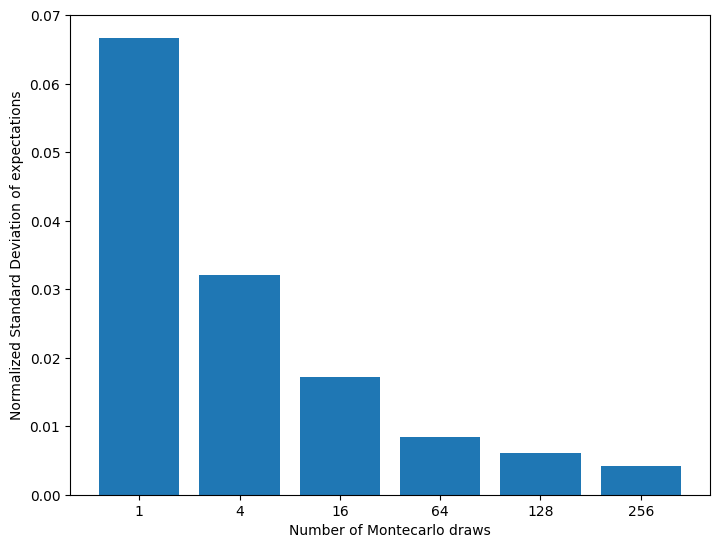

In [ ]:
# evaluate montecarlo estimation of expectation
env = Model()
rng_mc = random.PRNGKey(0)
params_test = train_state.params # Choose parameteres to test
nn_policy_test = train_state.apply_fn

def get_expectation_fn(nn_policy, params, env):
  def expectation(n_draws, rng,  obs):
    policy = nn_policy(params, obs)
    mc_obs = env.mc_shocks(rng, mc_draws=n_draws)
    mc_nextobs = jax.vmap(env.step, in_axes=(None, None,0))(obs, policy, mc_obs)
    mc_nextpols = nn_policy(params,jnp.stack(mc_nextobs))
    exp = jnp.mean(jax.vmap(env.expect_realization)(mc_nextobs, mc_nextpols), axis=0)
    return exp[0]
  return expectation

rng_mc, *mc_rngs = jax.random.split(rng_mc, 1000 + 1)

# obs_list = list(obs_quantiles)
obs_list = [jnp.zeros_like(env.initial_obs(rng_mc))]
n_draws_list = [1,4,16,64,128,256]
# n_draws_list = [500, 1000]
rng_list =list(mc_rngs)

mc_explist = {n_draws_list[i]: [] for i in range(len(n_draws_list))}
mc_error = {f"error_{n_draws_list[i]}_draws": [] for i in range(len(n_draws_list))}
for i in range(len(n_draws_list)):
  for j in range(len(rng_list)):
    for k in range(len(obs_list)):
      # exp_jitted = jax.jit(get_expectation_fn(nn_forward, params, env)).lower(n_draws_list[i], rng_list[j], obs_list[k]).compile
      mc_explist[n_draws_list[i]].append(get_expectation_fn(nn_policy_test, params_test, env)(n_draws_list[i], rng_list[j],  obs_list[k]))
      # mc_eval[(i,j,k)] = exp_jitted(n_draws_list[i], rng_list[j],  obs_list[k])
  mc_error[f"error_{n_draws_list[i]}_draws"] = jnp.std(jnp.array(mc_explist[n_draws_list[i]]))/jnp.mean(jnp.array(mc_explist[n_draws_list[i]]))
print(mc_error)

error_list = [float(mc_error[f"error_{n_draws_list[i]}_draws"]) for i in range(len(n_draws_list))]
print(error_list)
n_drawsstr_list = [str(n_draws_list[i]) for i in range(len(n_draws_list))]
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(n_drawsstr_list, error_list)
plt.xlabel('Number of Montecarlo draws')
plt.ylabel('Normalized Standard Deviation of expectations')
# plt.show
fig.savefig(exper_config['save_dir']+exper_config['exper_name']+'/mc_eval.jpg', bbox_inches="tight", pad_inches=1)


# First order condition in DSS

In [ ]:
econ_model = Model()
rng = random.PRNGKey(0)
nn_simul = NeuralNet(exper_config["layers"] + [econ_model.n_actions])
train_state_restored = checkpoints.restore_checkpoint(ckpt_dir=working_dir + "Experiments/" +restore_exper_name, target = None)
params = train_state_restored["params"]
opt_state = train_state_restored["opt_state"]
train_state = TrainState.create(apply_fn=nn_simul.apply, params=params, tx=optax.adam(0.05))
train_state.replace(opt_state=opt_state)
obs = jnp.zeros_like(econ_model.obs_ss)
policy = jnp.ones_like(econ_model.policies_ss)
policy_DSS = train_state.apply_fn(train_state.params, obs)
Pkss = jnp.exp(econ_model.policies_ss[2*econ_model.n_sectors:3*econ_model.n_sectors])
mc_shocks = econ_model.mc_shocks(rng, 128)
# mc_nextobs = jax.vmap(econ_model.step, in_axes = (None,None,0))(obs, policy_DSS, mc_shocks)
mc_nextobs = jax.vmap(econ_model.step, in_axes = (None,None,0))(obs, policy, mc_shocks)
# mc_nextobs = jax.vmap(env.step_loglinear, in_axes = (None,0))(obs, mc_shocks)
mc_nextpols = jax.vmap(env.policy_loglinear)(mc_nextobs)
# mc_nextpols = train_state.apply_fn(train_state.params, mc_nextobs)
expect = jnp.mean(jax.vmap(econ_model.expect_realization)(mc_nextobs, mc_nextpols), axis=0)
policy_DSS = train_state.apply_fn(train_state.params, obs)[6*econ_model.n_sectors:7*econ_model.n_sectors]
print(policy_DSS)
FOC_error = (econ_model.beta * expect)/Pkss -1
print("FOC_error", FOC_error)

[1.00640831 1.01701157 0.96925336 0.9865059  0.98955982 0.97941243
 0.97919939 0.9959174  0.99626219 0.98246924 0.98986951 1.00448409
 0.98977011 0.97944002 0.98986548 1.01007098 0.99783351 0.98124202
 0.96932596 1.04860957 0.98931968 0.98706802 0.98902378 0.99762487
 0.98952434 0.99033877 0.98325148 0.98165065 0.98618067 0.99505991
 0.98626103 1.02411411 0.99433102 0.97984816 1.01947314 0.975193
 1.00838564]
FOC_error [-3.53645194e-03  8.72722135e-04 -7.47706732e-05 -1.18377694e-04
 -4.93828513e-04 -6.07123146e-05  1.72781929e-04 -5.29114468e-04
  3.72632854e-03  2.32854973e-03 -1.09841735e-03 -1.86785099e-04
 -2.32891330e-04  1.25931046e-04  1.24491255e-04  5.42506252e-04
  6.87324561e-04 -3.79267291e-04  9.98802475e-04 -3.32888743e-03
  8.41509711e-04 -4.03093093e-04  1.15173342e-04  1.70694383e-04
  2.58340018e-04  1.16880105e-03 -5.03267696e-04 -3.65718722e-04
  5.01870938e-04  8.52163779e-04  4.86480807e-04  5.81326786e-04
  8.72807308e-04  1.22172566e-03  1.17108970e-03  1.20376

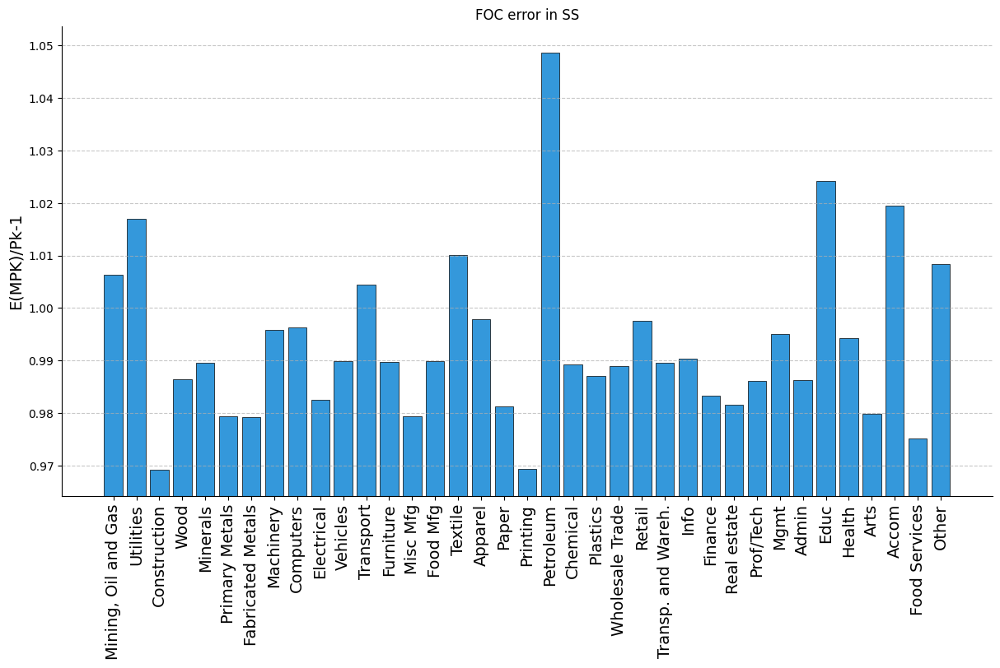

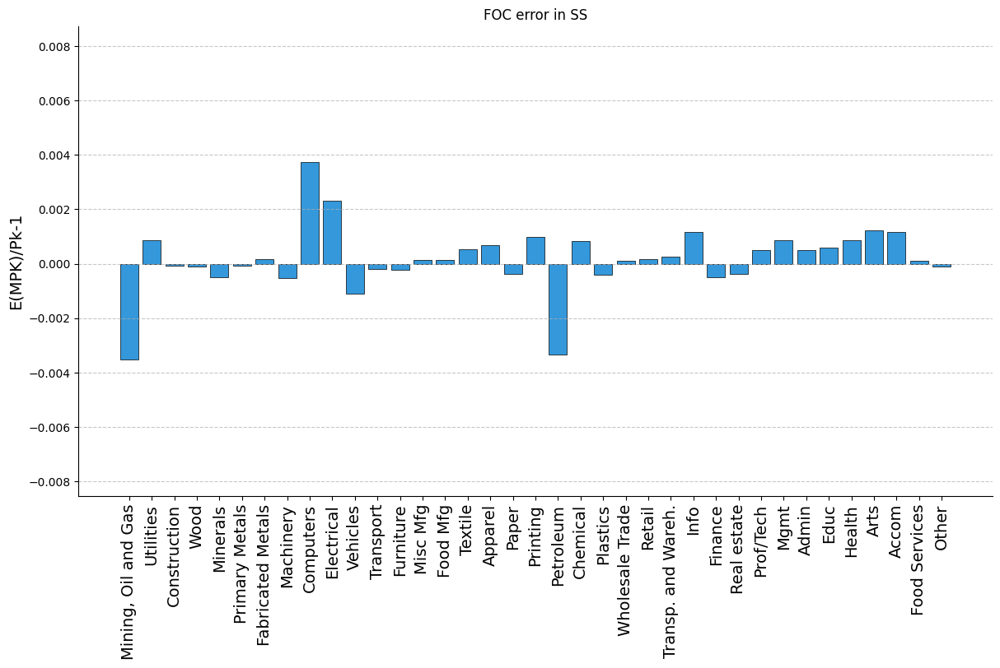

In [ ]:
def create_hist(variable_vector):
  # Create a  bar chart
  fig, ax = plt.subplots(figsize=(12, 8))  # Increased vertical size
  bars = ax.bar(np.arange(len(variable_vector)), variable_vector, color='#3498db', edgecolor='black', linewidth=0.5)  # Blue for positive, red for negative

  # Add title
  # ax.set_title('Capital Stochastic Steady State', fontsize=16, fontweight='bold')

  # Extend y-axis range
  ax.set_ylim(min(variable_vector) - 0.005, max(variable_vector) + 0.005)

  # Add x-axis labels with rotation
  ax.set_xticks(np.arange(len(variable_vector)))
  ax.set_xticklabels(labels, rotation=90, ha='center', fontsize=14)  # Adjust rotation and font size as needed

  # Customize layout and display the chart
  ax.grid(axis='y', linestyle='--', alpha=0.7)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  plt.tight_layout()
  plt.title(f"FOC error in SS")
  plt.ylabel(f'E(MPK)/Pk-1',fontsize=14)
  plt.show()
  # Save figure
  fig.savefig(config_simul['save_dir'] + config_simul['restore_exper_name'] + f'/FOCloss_DSS.jpg', bbox_inches="tight", pad_inches=1)
  plt.show()

create_hist(policy_DSS)
create_hist(FOC_error)


In [ ]:
table_data = [Vc, Vc_loglinear, Vc_Css, Vc_Lss, Vc_ssmean]
print(table_data)
table_titles = ["Full Nonlinear", "Loglinear", "C fixed at St.St.", "L fixed at St.St.",  "Mean at St.St."]
table_data_strings = [str(round(float(value*100),2)) + "\%" for value in table_data]

# Initialize the LaTeX table string
latex_table = "\\begin{tabular}{" + "c" * 5 + "}\n\\hline\n"

# Add column titles
latex_table += " & ".join(table_titles) + " \\\\\n\\hline\n"

# Add rows of values

latex_table += " & ".join(table_data_strings) + " \\\\\n"

# End the table
latex_table += "\\hline\n \\end{tabular}"

# Print the LaTeX table string
print(latex_table)
latex_filename = config_simul['save_dir'] + config_simul['restore_exper_name'] + f'/welfare_table.tex'

# Save the LaTeX code to the specified file
with open(latex_filename, 'w') as file:
    file.write(latex_table)

[Array(-0.01052167, dtype=float64), Array(-0.00113627, dtype=float64), Array(0.00405371, dtype=float64), Array(-0.01509314, dtype=float64), Array(-0.00063794, dtype=float64)]
\begin{tabular}{ccccc}
\hline
Full Nonlinear & Loglinear & C fixed at St.St. & L fixed at St.St. & Mean at St.St. \\
\hline
-1.05\% & -0.11\% & 0.41\% & -1.51\% & -0.06\% \\
\hline
 \end{tabular}


# Spectral Density

In [ ]:
from scipy.signal import welch

def extract_spectral_density(trajectory, trajectory_loglinear, sector_index, env):
    # Extract time series of interest
    Cagg, Cagg_loglinear = trajectory[:, 11 * env.n_sectors], trajectory_loglinear[:, 11 * env.n_sectors]
    Lagg, Lagg_loglinear = trajectory[:, 11 * env.n_sectors + 1], trajectory_loglinear[:, 11 * env.n_sectors + 1]
    Yagg, Yagg_loglinear = trajectory[:, 11 * env.n_sectors + 2], trajectory_loglinear[:, 11 * env.n_sectors + 2]
    Iagg, Iagg_loglinear = trajectory[:, 11 * env.n_sectors + 3], trajectory_loglinear[:, 11 * env.n_sectors + 3]
    Magg, Magg_loglinear = trajectory[:, 11 * env.n_sectors + 4], trajectory_loglinear[:, 11 * env.n_sectors + 4]
    C_j, C_j_loglinear = trajectory[:, sector_index - 1], trajectory_loglinear[:, sector_index - 1]
    L_j, L_j_loglinear = trajectory[:, env.n_sectors + sector_index - 1], trajectory_loglinear[:, env.n_sectors + sector_index - 1]
    Pk_j, Pk_j_loglinear = trajectory[:, 2 * env.n_sectors + sector_index - 1], trajectory_loglinear[:, 2 * env.n_sectors + sector_index - 1]
    Pm_j, Pm_j_loglinear = trajectory[:, 3 * env.n_sectors + sector_index - 1], trajectory_loglinear[:, 3 * env.n_sectors + sector_index - 1]
    M_j, M_j_loglinear = trajectory[:, 4 * env.n_sectors + sector_index - 1], trajectory_loglinear[:, 4 * env.n_sectors + sector_index - 1]
    Mout_j, Mout_j_loglinear = trajectory[:, 5 * env.n_sectors + sector_index - 1], trajectory_loglinear[:, 5 * env.n_sectors + sector_index - 1]
    I_j, I_j_loglinear = trajectory[:, 6 * env.n_sectors + sector_index - 1], trajectory_loglinear[:, 6 * env.n_sectors + sector_index - 1]
    Iout_j, Iout_j_loglinear = trajectory[:, 7 * env.n_sectors + sector_index - 1], trajectory_loglinear[:, 7 * env.n_sectors + sector_index - 1]
    P_j, P_j_loglinear = trajectory[:, 8 * env.n_sectors + sector_index - 1], trajectory_loglinear[:, 8 * env.n_sectors + sector_index - 1]
    Q_j, Q_j_loglinear = trajectory[:, 9 * env.n_sectors + sector_index - 1], trajectory_loglinear[:, 9 * env.n_sectors + sector_index - 1]
    Y_j, Y_j_loglinear = trajectory[:, 10 * env.n_sectors + sector_index - 1], trajectory_loglinear[:, 10 * env.n_sectors + sector_index - 1]

    def create_spectral_density(var, var_loglinear, label, legend):
        f, p = welch(var, fs=1.0, nperseg=1024)
        f_ll, p_ll = welch(var_loglinear, fs=1.0, nperseg=1024)

        # Create a new figure and axes for each variable pair
        fig, ax = plt.subplots(figsize=(10, 6))

        # Plot power spectral density for the variable pair with custom legends
        ax.semilogy(f, p, label=label, color='blue', alpha=0.7)
        ax.semilogy(f_ll, p_ll, label=f'Loglinear {label}' , color='red', alpha=0.7)

        # Customize the plot
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Power/Frequency (dB/Hz)')
        ax.set_title(f'Power Spectral Density of{legend}', fontweight='bold', fontsize=14)
        plt.tight_layout()
        plt.legend()

        #Save the figure

        fig.savefig(config_simul['save_dir'] + config_simul['restore_exper_name'] + f'/Spectral Density _{label}.jpg', bbox_inches="tight", pad_inches=1)
        plt.show()

        # Show the plot for the current variable pair
        plt.show()

    # Applying the function to different variables
    create_spectral_density(Cagg, Cagg_loglinear, "Agg. Consumption", " Agreggate Consumption")
    create_spectral_density(Lagg, Lagg_loglinear, "Agg. Labor", "  Agreggate Labor")
    create_spectral_density(Yagg, Yagg_loglinear, "Agg. production", "  Aggregate Production")
    create_spectral_density(Iagg, Iagg_loglinear, "Agg. Investment", " Aggregate Investment")
    create_spectral_density(Magg, Magg_loglinear, "Agg. Intermediate Goods", "  Aggregate Intermediate Goods")
    create_spectral_density(C_j, C_j_loglinear, f"Sector {sector_index} Consumption", f" Sector {sector_index} Consumption")
    create_spectral_density(L_j, L_j_loglinear, f"Sector {sector_index} Labor", f" Sector {sector_index} Labor")
    create_spectral_density(Y_j, Y_j_loglinear, f"Sector {sector_index} Production", f" Sector {sector_index} Production")
    create_spectral_density(I_j, I_j_loglinear, f"Sector {sector_index} Investment", f" Sector {sector_index} Investment")
    create_spectral_density(M_j, M_j_loglinear, f"Sector {sector_index} Intermediate Goods", f" Sector {sector_index} Intermediate Goods")



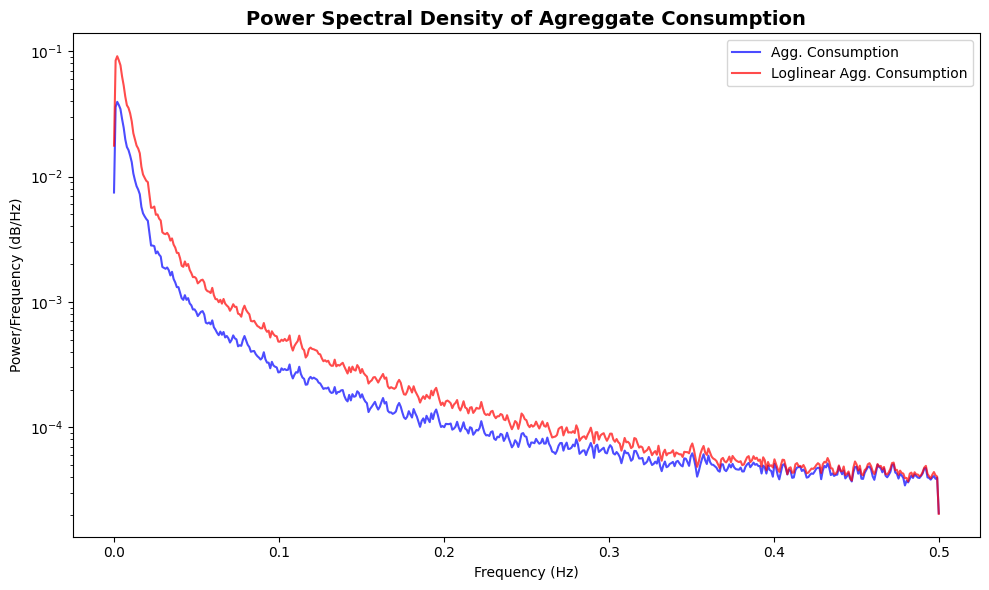

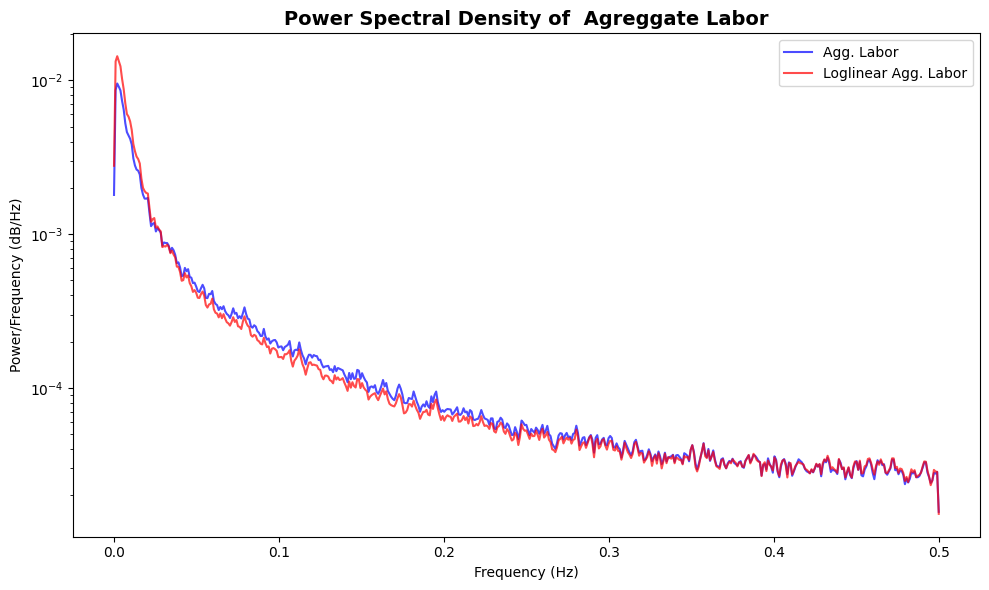

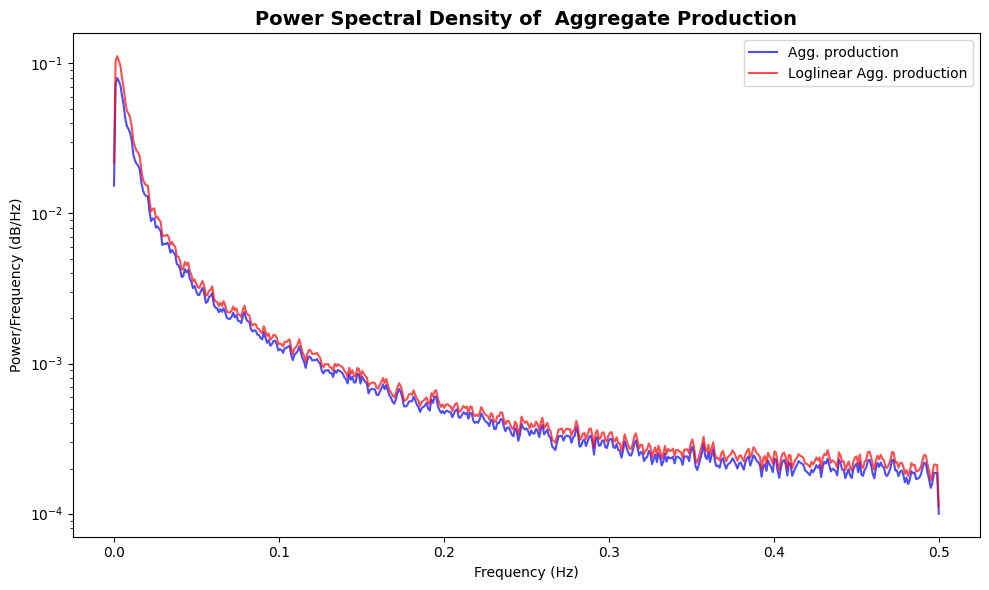

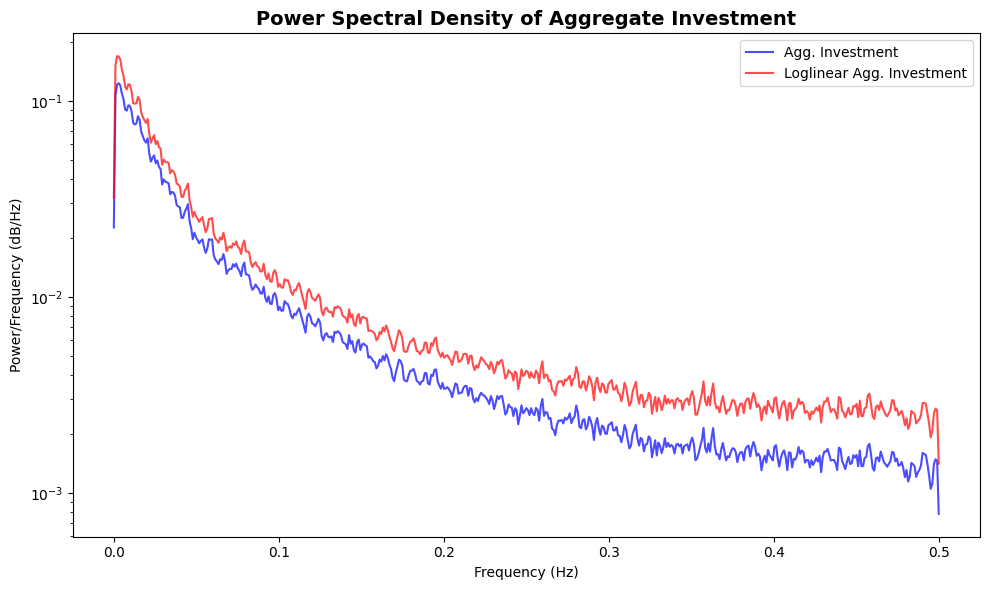

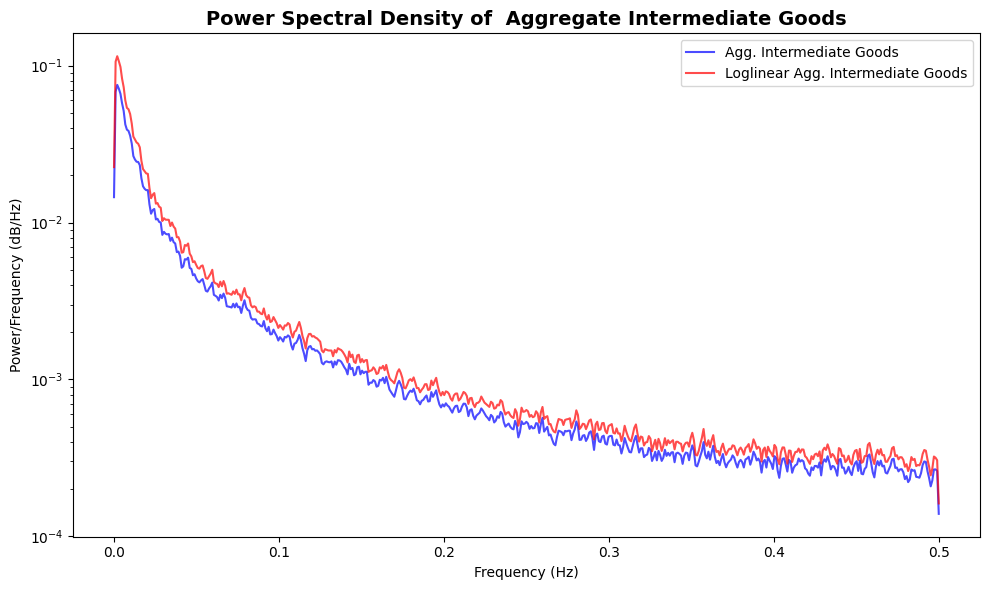

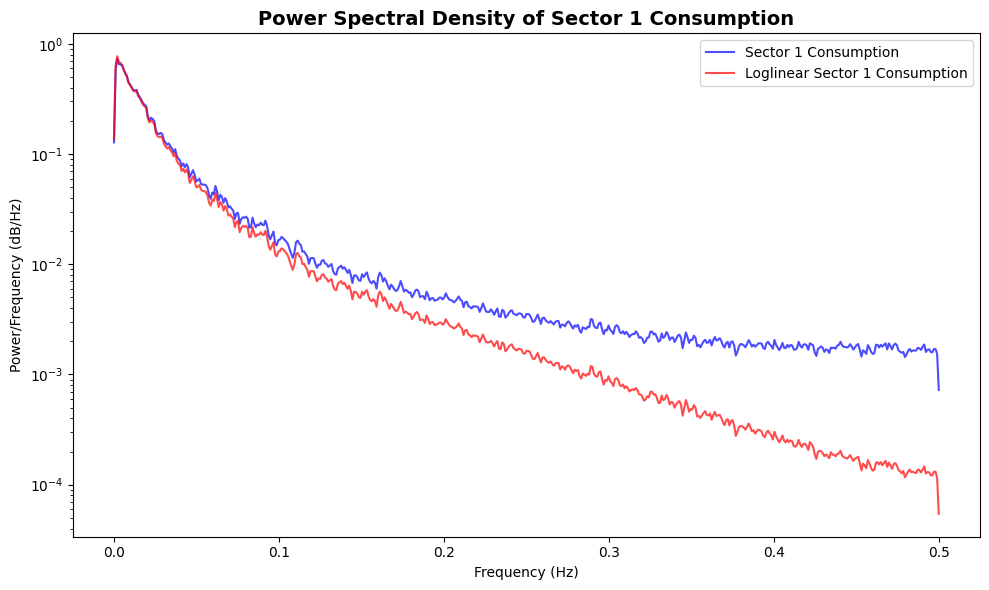

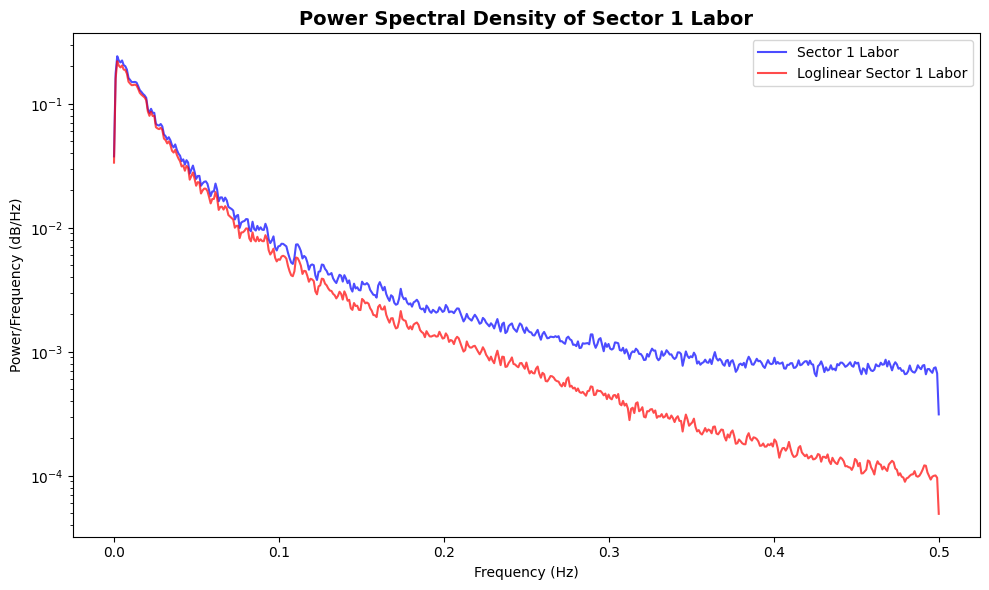

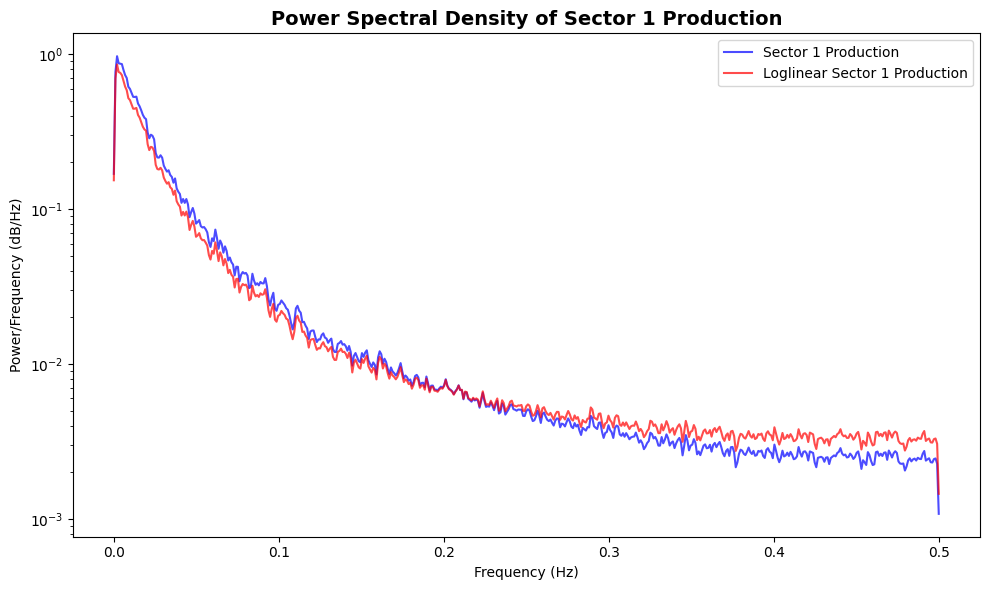

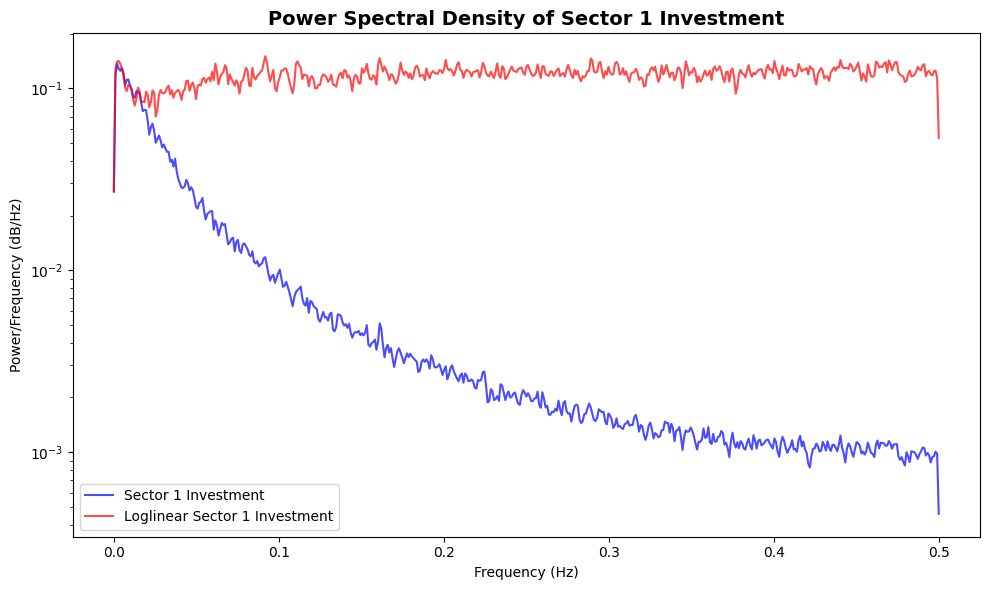

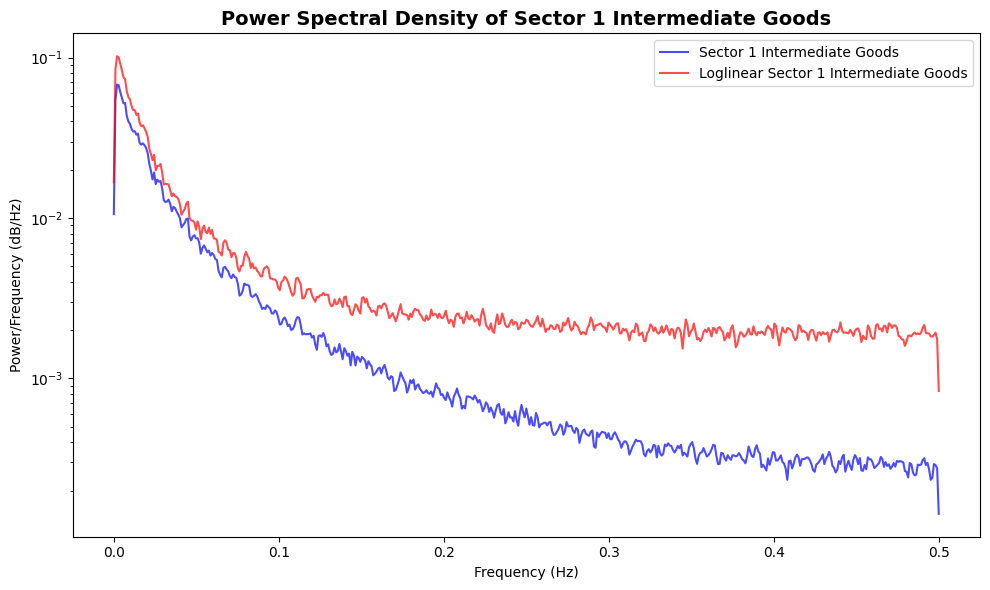

In [ ]:
env= Model()
extract_spectral_density(simul_policies,simul_policies_loglinear,1,env)

# Test Results

We will first test that the environment works as its supposed to. First, we check if the error in the steady state is 0 under the loglinear policy. for that, we will firsr create a function that calculates the loss in the steady state

### Test 1: steady state

In [ ]:
# Test policies in steady state
env = Model()
params_test = final_train_state.params # Choose parameteres to test
nn_policy_test = final_train_state.apply_fn
rng_test = random.PRNGKey(1)

# test steady state policies
obs_init = env.initial_obs(rng_test)
obs_ss = jnp.zeros_like(obs_init, dtype=jnp.float32)
policy_ss = nn_policy_test(params_test, obs_ss) # nn_policy is the nn policy that comes from the training experiment
print("Pretrain Policy in ss (should be ~ 1):", policy_ss)

# check that steady state policies takes a zero step
shock_ss = jnp.array([0])
obs_next_ss = env.step(obs_ss, policy_ss, shock_ss)
print("Nex obs after ss policies (should be ~ 0):", obs_next_ss)
# print("Neural Net Gives 0 step in StSt?",jnp.allclose(obs_next_ss, obs_ss, rtol=1e-02))
print("Difference between next obs after applying nn_policy and stst", obs_next_ss-obs_ss)

# calculate expectation in StSt
start = time()
exp_ss = env.expect_realization(obs_ss, policy_ss)
print("Expectation in SS:", exp_ss)
finish = time()
print(f"executing an expectation realization took {(finish-start)*1000} miliseconds")

# calculate loss in STST
start = time()
mean_loss, mean_accuracy, min_accuracy = env.loss(obs_ss,exp_ss, policy_ss)
print("Mean Loss in SS:", mean_loss, "Mean accuracy in SS:", mean_accuracy, "Min. accuracy in SS:", min_accuracy)
finish = time()
print(f"executing the loss function {(finish-start)*1000} miliseconds")


Pretrain Policy in ss (should be ~ 1): [0.9985242]
Nex obs after ss policies (should be ~ 0): [-4.4345856e-05  0.0000000e+00]
Difference between next obs after applying nn_policy and stst [-4.4345856e-05  0.0000000e+00]
Expectation in SS: 0.56312555
executing an expectation realization took 41.3203239440918 miliseconds
Mean Loss in SS: 1.4210855e-14 Mean accuracy in SS: 0.9999999 Min. accuracy in SS: 0.9999999
executing the loss function 9.791135787963867 miliseconds


### Test 2: step and loss function

Now we test that the step function and loss function works correctly.

In [ ]:
env = Model()
rng_test = random.PRNGKey(0)
params_test = final_train_state.params # Choose parameteres to test
nn_policy_test = final_train_state.apply_fn
# test envreset
obs_init = env.initial_obs(rng_test)
print("shape of initial obs:", obs_init.shape)

# test step
shock = env.sample_shock(rng_test)
policy = nn_policy_test(params_test, obs_init)
obs_next = env.step(obs_init,policy,shock)
print("shape of next obs", obs_next.shape)

# test expectation
mc_shocks = env.mc_shocks(rng_test, config["mc_draws"])
mc_nextobs = jax.vmap(env.step, in_axes=(None, None,0))(obs_init, policy, mc_shocks)
mc_nextpols = nn_policy_test(params_test,jnp.stack(mc_nextobs))
exp = jnp.mean(jax.vmap(env.expect_realization)(mc_nextobs, mc_nextpols))
print("shape of exp", exp.shape)
print("exp", exp)

#test loss
mean_loss, mean_accuracy, min_accuracy  = env.loss(obs_init, exp, policy)
print("Mean Loss in init obs:", mean_loss, "Mean accuracy in init obs:", mean_accuracy, "Min. accuracy in init obs:", min_accuracy)



shape of initial obs: (2,)
shape of next obs (2,)
shape of exp ()
exp 0.53553444
Mean Loss in init obs: 1.0706799e-08 Mean accuracy in init obs: 0.9998965 Min. accuracy in init obs: 0.9998965


### Test 3: Simulating the environment (only states and policy, no loss)

In [ ]:
# Simulate env
env = Model()
params_test = final_train_state.params # Choose parameteres to test
nn_policy_test = final_train_state.apply_fn
rng_test = random.PRNGKey(1)
obs_init = env.initial_obs(rng_test)

def period_step_fn(obs, shock, nn_params):
  policy = nn_policy_test(nn_params, obs)
  obs_next = env.step(obs, policy, jnp.array([shock]))  # apply period steps for each row shock in shocks.
  return obs_next, (obs_next, policy)

n_periods = 1000000
shocks = env.sample_shock(rng_test, n_draws=n_periods)
period_step = jax.tree_util.Partial(period_step_fn, nn_params = params_test)
start = time()
obs_final, obs_policy_pair = lax.scan(period_step,obs_init,shocks)
finish = time()
print(f"Simulating {n_periods} with only state evolution given policy took {(finish-start)} seconds")

obs, policy = obs_policy_pair
print('mean for each state (should be ~ 0)')
print(jnp.mean(obs,axis=0))
print('std for each state (if normalized, should be ~ 1)')
print(jnp.std(obs, axis=0))
print('average policy', jnp.mean(policy,axis=0))

Simulating 1000000 with only state evolution given policy took 0.28539276123046875 seconds
mean for each state (should be ~ 0)
[1.8740162e-04 8.0411519e-05]
std for each state (if normalized, should be ~ 1)
[0.03095767 0.02291827]
average policy [1.0006654]


## Analysis

We now perform three analysis. First, we analyse business cycle frequencies and amplifications.

In [ ]:
""" Calculate fourier transform """

# simulate 100000 periods
rng_test = random.PRNGKey(0)
env = Model()
n_periods = 1000000
state_init = jnp.array(jnp.log(jax.random.uniform(rng_test,(2*env.n_sectors,),minval=0.9,maxval=1.1)))
shocks = jax.random.multivariate_normal(rng_test, jnp.zeros((env.n_sectors,)), env.Sigma_A, shape=(n_periods,))
_, state_policy_pairs = lax.scan(env.step,state_init,shocks)
states, _ = state_policy_pairs
print(states.shape) #check that last dimension is the time dimension
fourier = jax.scipy.fft.dct(states)
del states
del shocks


TypeError: ignored

## Obsolete

In [ ]:
# def loss(self, rng, state, policy_params):

  #   # process state
  #   state = state*self.states_sd
  #   K = jnp.exp(state[:self.n_sectors]+self.states_ss[:self.n_sectors])
  #   a = state[self.n_sectors:]+self.states_ss[self.n_sectors:]

  #   # calculate the policy variables
  #   policy = self.policy_fn(policy_params,state)
  #   I = policy[:self.n_sectors]
  #   Q = policy[self.n_sectors:2*self.n_sectors]
  #   P = policy[2*self.n_sectors:3*self.n_sectors]
  #   L = policy[3*self.n_sectors:]

  #   #Rest of variables
  #   A = jnp.exp(a)
  #   Lagg = jnp.sum(L)  # Aggregate labor
  #   Pagg = jnp.dot(jnp.transpose(self.xi),P**(1-self.sigma_c))**(1/(1-self.sigma_c)) # Agg price
  #   Cagg = 1/Pagg  # Agg consumption
  #   C = self.xi * (P/Pagg)**(-self.sigma_c) * Cagg  # Sectoral Consumption
  #   Pm = (jnp.dot(jnp.transpose(self.Gamma_M),P**(1-self.sigma_m)))**(1/(1-self.sigma_m)) #  Interm. Price Index
  #   M = self.mu * (Pm/P)**(-self.sigma_q) * Q  # Sectoral Intermediates
  #   Mout = P**(-self.sigma_m) * jnp.dot(self.Gamma_M,Pm**(self.sigma_m)*M) # interm sold by sector
  #   Pk = (jnp.dot(jnp.transpose(self.Gamma_I),P**(1-self.sigma_I)))**(1/(1-self.sigma_I)) #  Capital Price Index
  #   Iout = P**(-self.sigma_I) * jnp.dot(self.Gamma_I,Pk**(self.sigma_I)*I) # New Capital sold by sector
  #   Y = (A * (
  #       self.alpha**(1/self.sigma_y)*K**((self.sigma_y-1)/self.sigma_y) +
  #       (1-self.alpha)**(1/self.sigma_y)*L**((self.sigma_y-1)/self.sigma_y)
  #       )**(self.sigma_y/(self.sigma_y-1)))

  #   # Now we calculate the expectation term through montecarlo. We know K_next
  #   K_next = (1-self.delta)*K + I  # get next K

  #   # First, we get what is inside expectations for the realization of one shock
  #   def exp_realization(shock):
  #     # get next state
  #     a_next = self.rho*a + shock
  #     state_next = jnp.concatenate([jnp.log(K_next),a_next])-self.states_ss

  #     #calculate policies
  #     policy_next = self.policy_fn(policy_params,state_next)
  #     I_next = policy_next[:self.n_sectors]
  #     Q_next = policy_next[self.n_sectors:2*self.n_sectors]
  #     P_next = policy_next[2*self.n_sectors:3*self.n_sectors]
  #     L_next = policy_next[3*self.n_sectors:]

  #     # Solve for the rest of the endogenous variables
  #     A_next = jnp.exp(a_next)
  #     Lagg = jnp.sum(L)
  #     Pk_next = (jnp.dot(jnp.transpose(self.Gamma_I),P_next**(1-self.sigma_I)))**(1/(1-self.sigma_I))
  #     Y_next = (A_next * (
  #       self.alpha**(1/self.sigma_y)*K_next**((self.sigma_y-1)/self.sigma_y) +
  #       (1-self.alpha)**(1/self.sigma_y)*L_next**((self.sigma_y-1)/self.sigma_y)
  #       )**(self.sigma_y/(self.sigma_y-1)))

  #     # Solve for the expectation term
  #     exp_realization = (P_next*A_next**((self.sigma_y-1)/self.sigma_y) *
  #       ((1-self.mu)*Q_next/Y_next)**(1/self.sigma_q) *
  #       (self.alpha*Y_next/K_next)**(1/self.sigma_y) +
  #       (1-self.delta)*Pk_next)
  #     return exp_realization

  #   # Now we calculate the expectation through montecarlo
  #   def monte_carlo_exp(rng, mc_draws):
  #     shocks = jax.random.multivariate_normal(rng, jnp.zeros((self.n_sectors,)), self.Sigma_A, shape=(mc_draws,))
  #     exp = jnp.mean(jax.vmap(exp_realization)(shocks),axis=0)
  #     return exp
  #   # exp = monte_carlo_exp(rng, self.mc_draws)
  #   # rng, *mc_rngs  = random.split(rng,self.n_mcs+1)
  #   exp = monte_carlo_exp(rng,self.mc_draws)

  #   # Calculate model implied Q
  #   Qmod = ((
  #       (1-self.mu)**(1/self.sigma_q)*Y**((self.sigma_q-1)/self.sigma_q) +
  #       (self.mu)**(1/self.sigma_q)*M**((self.sigma_q-1)/self.sigma_q)
  #       )**(self.sigma_q/(self.sigma_q-1)))

  #   # Calculate right hand side of error eq for L
  #   Lmod = (P*A**((self.sigma_y-1)/self.sigma_y) *
  #     ((1-self.mu)*Q/Y)**(1/self.sigma_q) *
  #     ((1-self.alpha)*Y/L)**(1/self.sigma_y))

  #   Q_loss = Q / Qmod - 1
  #   Pk_loss = Pk/(self.beta*exp) - 1
  #   Market_loss = Q / (C+Mout+Iout) - 1
  #   L_loss = Lagg**(1/self.eps_l)/Lmod - 1
  #   loss = (jnp.sum(jnp.array([jnp.square(Q_loss),jnp.square(Pk_loss),jnp.square(Market_loss), jnp.square(L_loss)])))/self.n_actions

  #   return lax.stop_gradient(loss)

  # def expectation(self, rng, state, K_next, policy_params):
  #   K = jnp.exp(state[:self.n_sectors]+self.states_ss[:self.n_sectors])
  #   a = state[self.n_sectors:]

  #   def exp_realization(shock):
  #     # get next state
  #     a_next = self.rho*a + shock
  #     state_next = jnp.concatenate([jnp.log(K_next),a_next])-self.states_ss

  #     #calculate policies
  #     policy_next = self.policy_fn(policy_params,state_next)
  #     I_next = policy_next[:self.n_sectors]
  #     Q_next = policy_next[self.n_sectors:2*self.n_sectors]
  #     P_next = policy_next[2*self.n_sectors:3*self.n_sectors]
  #     L_next = policy_next[3*self.n_sectors:]

  #     # Solve for the rest of the endogenous variables
  #     A_next = jnp.exp(a_next)
  #     Lagg = jnp.sum(L)
  #     Pk_next = (jnp.dot(jnp.transpose(self.Gamma_I),P_next**(1-self.sigma_I)))**(1/(1-self.sigma_I))
  #     Y_next = (A_next * (
  #       self.alpha**(1/self.sigma_y)*K_next**((self.sigma_y-1)/self.sigma_y) +
  #       (1-self.alpha)**(1/self.sigma_y)*L_next**((self.sigma_y-1)/self.sigma_y)
  #       )**(self.sigma_y/(self.sigma_y-1)))

  #     # Solve for the expectation term
  #     exp_realization = (P_next*A_next**((self.sigma_y-1)/self.sigma_y) *
  #       ((1-self.mu)*Q_next/Y_next)**(1/self.sigma_q) *
  #       (self.alpha*Y_next/K_next)**(1/self.sigma_y) +
  #       (1-self.delta)*Pk_next)
  #     return exp_realization

  #   shocks = jax.random.multivariate_normal(rng, jnp.zeros((self.n_sectors,)), self.Sigma_A, shape=(self.mc_draws,))
  #   exp = jnp.mean(jax.vmap(exp_realization)(shocks), axis=0)
  #   return exp

In [ ]:
# Environment
# class ProdNetRbc_SS():
#   """A JAX implementation of an RBC model with Production Networks."""

#   def __init__(self, params = params, states_ss=states_ss, policies_ss=policies_ss, states_sd = states_sd, policy_layers=[1024,1024]):

#     self.alpha = params["alpha"]
#     self.beta = params["beta"]
#     self.delta = params["delta"]
#     self.rho = params["rho"]
#     self.eps_l = params["eps_l"]
#     self.sigma_c = params["sigma_c"]
#     self.sigma_m = params["sigma_m"]
#     self.sigma_q = params["sigma_q"]
#     self.sigma_y = params["sigma_y"]
#     self.sigma_I = params["sigma_I"]
#     self.xi = jnp.array(params["xi"])
#     self.mu = jnp.array(params["mu"])
#     self.Gamma_M = jnp.array(params["Gamma_M"])
#     self.Gamma_I = jnp.array(params["Gamma_I"])
#     self.n_sectors = params["n_sectors"]
#     self.states_ss = jnp.concatenate([states_ss,jnp.zeros(shape=(self.n_sectors,))])
#     self.policies_ss = jnp.array(policies_ss)
#     self.n_actions = 4*self.n_sectors
#     self.states_sd = states_sd
#   def initial_state(self):
#     state_init = jnp.zeros(shape=(2*self.n_sectors,))
#     return lax.stop_gradient(state_init)

#   def step(self, state):
#     state = state*self.states_sd
#     K = jnp.exp(state[:self.n_sectors]+self.states_ss[:self.n_sectors])
#     a = state[self.n_sectors:]
#     policy = jnp.exp(self.policies_ss)
#     K_next = (1-self.delta)*K + policy[:self.n_sectors]
#     a_next = self.rho*a
#     state_next = (jnp.concatenate([jnp.log(K_next),a_next])-self.states_ss)/self.states_sd
#     # return lax.stop_gradient(state_next), lax.stop_gradient(state_next)
#     return lax.stop_gradient(state_next)


#   def loss(self, state):
#     state = state*self.states_sd
#     # process state
#     K = jnp.exp(state[:self.n_sectors]+self.states_ss[:self.n_sectors])

#     # calculate the policy variables
#     policy = jnp.exp(self.policies_ss)
#     I = policy[:self.n_sectors]
#     Q = policy[self.n_sectors:2*self.n_sectors]
#     P = policy[2*self.n_sectors:3*self.n_sectors]
#     L = policy[3*self.n_sectors:]

#     #Rest of variables
#     Lagg = jnp.sum(L)  # Aggregate labor
#     Pagg = jnp.dot(jnp.transpose(self.xi),P**(1-self.sigma_c))**(1/(1-self.sigma_c)) # Agg price
#     Cagg = 1/Pagg  # Agg consumption
#     C = self.xi * (P/Pagg)**(-self.sigma_c) * Cagg  # Sectoral Consumption
#     Pm = (jnp.dot(jnp.transpose(self.Gamma_M),P**(1-self.sigma_m)))**(1/(1-self.sigma_m)) #  Interm. Price Index
#     M = self.mu * (Pm/P)**(-self.sigma_q) * Q  # Sectoral Intermediates
#     Mout = P**(-self.sigma_m) * jnp.dot(self.Gamma_M,Pm**(self.sigma_m)*M) # interm sold by sector
#     Pk = (jnp.dot(jnp.transpose(self.Gamma_I),P**(1-self.sigma_I)))**(1/(1-self.sigma_I)) #  Capital Price Index
#     Iout = P**(-self.sigma_I) * jnp.dot(self.Gamma_I,Pk**(self.sigma_I)*I) # New Capital sold by sector
#     Y = (
#         (
#         self.alpha**(1/self.sigma_y)*K**((self.sigma_y-1)/self.sigma_y) +
#         (1-self.alpha)**(1/self.sigma_y)*L**((self.sigma_y-1)/self.sigma_y)
#         )**(self.sigma_y/(self.sigma_y-1)))

#     print(Y)
#     # Now we calculate the expectation term through montecarlo. We know K_next
#     K_next = (1-self.delta)*K + I  # get next K
#     exp = (
#         P *
#         ((1-self.mu)*Q/Y)**(1/self.sigma_q) *
#         (self.alpha*Y/K_next)**(1/self.sigma_y) +
#         (1-self.delta)*Pk
#         )
#     # Now we get what is inside expectations for each realization of the shock
#     # def exp_realization():
#     #   # a_next = self.rho*a
#     #   # state_next = jnp.concatenate([jnp.log(K_next),a_next])-self.states_ss

#     #   #calculate policies
#     #   # policy_next = policy
#     #   # I_next = policy_next[:self.n_sectors]
#     #   # Q_next = policy_next[self.n_sectors:2*self.n_sectors]
#     #   # P_next = policy_next[2*self.n_sectors:3*self.n_sectors]
#     #   # L_next = policy_next[3*self.n_sectors:]

#     #   # Solve for the rest of the endogenous variables
#     #   # A_next = jnp.exp(a_next)
#     #   # Lagg = jnp.sum(L)
#     #   # Pk_next = (jnp.dot(jnp.transpose(Gamma_I),P_next**(1-self.sigma_I)))**(1/(1-self.sigma_I))
#     #   # Y_next = (A_next * (
#     #   #   self.alpha**(1/self.sigma_y)*K_next**((self.sigma_y-1)/self.sigma_y) +
#     #   #   (1-self.alpha)**(1/self.sigma_y)*L_next**((self.sigma_y-1)/self.sigma_y)
#     #   #   )**(self.sigma_y/(self.sigma_y-1)))

#     #   # Solve for the expectation term
#     #   # exp_realization = (P_next*A_next**((self.sigma_y-1)/self.sigma_y) *
#     #   #   ((1-self.mu)*Q_next/Y_next)**(1/self.sigma_q) *
#     #   #   (self.alpha*Y_next/K_next)**(1/self.sigma_y) +
#     #   #   (1-self.delta)*Pk_next)
#     #   exp_realization = (P*A**((self.sigma_y-1)/self.sigma_y) *
#     #     ((1-self.mu)*Q/Y)**(1/self.sigma_q) *
#     #     (self.alpha*Y/K_next)**(1/self.sigma_y) +
#     #     (1-self.delta)*Pk)
#     #   return exp_realization

#     # Now we calculate the expectation

#     # Calculate model implied Q
#     Qmod = ((
#         (1-self.mu)**(1/self.sigma_q)*Y**((self.sigma_q-1)/self.sigma_q) +
#         (self.mu)**(1/self.sigma_q)*M**((self.sigma_q-1)/self.sigma_q)
#         )**(self.sigma_q/(self.sigma_q-1)))

#     # Calculate right hand side of error eq for L
#     Lmod = (P *
#       ((1-self.mu)*Q/Y)**(1/self.sigma_q) *
#       ((1-self.alpha)*Y/L)**(1/self.sigma_y))

#     Q_loss = Q / Qmod - 1
#     Pk_loss = Pk/(self.beta*exp) - 1
#     Market_loss = Q / (C+Mout+Iout) - 1
#     L_loss = Lagg**(1/self.eps_l)/Lmod - 1
#     loss = (jnp.sum(jnp.array([jnp.square(Q_loss),jnp.square(Pk_loss),jnp.square(Market_loss), jnp.square(L_loss)])))/self.n_actions

#     return lax.stop_gradient(loss)

In [ ]:
def run_experiment(env, config):
  """Runs experiment."""
  cores_count = len(jax.devices())  # get available TPU cores.
  nn_policy = NeuralNet(config["layers"] + [env.n_actions])
  optim = optax.adam(config["learning_rate"])  # define optimiser.

  rng, rng_e = random.split(random.PRNGKey(config["seed"]), 2)  # prng keys.
  dummy_obs = env.initial_obs(rng_e)  # dummy for net init.
  params = params # initialise params.
  nn_forward = nn_policy.apply
  mean_loss = jnp.array([0.0]) # initialize loss
  # mean_abs_loss = jnp.array([0.0]) # initialize loss
  opt_state = optim.init(params)  # initialise optimiser stats.
  learn = jax.jit(get_epoch_learner_fn(env, nn_forward, optim.update, config["batch_size"], config["epoch_iters"]))
  # learn = jax.pmap(learn, axis_name='i')  # replicate over multiple cores.

  #  broadcast = lambda x: jnp.broadcast_to(x, (cores_count, config["n_batches"]) + x.shape)
  # params = jax.tree_map(broadcast, params)  # broadcast to cores and batch.
  # opt_state = jax.tree_map(broadcast, opt_state)  # broadcast to cores and batch
  # mean_loss = jax.tree_map(broadcast, mean_loss)
  # mean_abs_loss = jax.tree_map(broadcast, mean_abs_loss)

  # rng, *env_rngs = jax.random.split(rng, cores_count * config["n_batches"]+ 1)
  # env_obs = jax.vmap(env.initial_obs)(jnp.stack(env_rngs))  # init envs.
  # rng, *step_rngs = jax.random.split(rng, cores_count * config["n_batches"] + 1)
  # rng, *eval_rngs = jax.random.split(rng, cores_count * config["n_batches"] + 1)
  rng, env_rngs = jax.random.split(rng, cores_count * config["n_batches"]+ 1)
  env_obs = env.initial_obs(env_rngs)  # init envs.
  rng, step_rngs = jax.random.split(rng, cores_count * config["n_batches"] + 1)
  rng, eval_rngs = jax.random.split(rng, cores_count * config["n_batches"] + 1)

  # reshape = lambda x: x.reshape((cores_count, config["n_batches"]) + x.shape[1:])
  # step_rngs = reshape(jnp.stack(step_rngs))  # add dimension to pmap over.
  # eval_rngs = reshape(jnp.stack(eval_rngs))  # add dimension to pmap over.
  # env_obs = reshape(env_obs)  # add dimension to pmap over.

  mean_losses = []
  mean_accuracy = []
  num_steps = cores_count * config["epoch_iters"] * config["batch_size"] * config["n_batches"]

  with TimeIt(tag='COMPILATION'):
    learn(params, opt_state, step_rngs, env_obs, mean_loss)  # compiles

  #First run, we calculate periods per second
  with TimeIt(tag='EXECUTION', steps=num_steps):
    params, opt_state, step_rngs, env_obs, mean_loss = learn(
        params, opt_state, step_rngs, env_obs, mean_loss)

  #Rest of the runs
  for i in range(2,config["n_epochs"]+1):
    rng, step_rngs = jax.random.split(rng, cores_count * config["n_batches"] + 1)
    # step_rngs = reshape(jnp.stack(step_rngs))
    params, opt_state, step_rngs, env_obs, mean_loss = learn(
        params, opt_state, step_rngs, env_obs, mean_loss)

    mean_losses.append(jnp.mean(mean_loss))
    # mean_accuracy.append((1- jnp.mean(mean_abs_loss))*100)

    print('Iteration:', i*config["epoch_iters"],
          ", Mean_loss:", jnp.mean(mean_loss),
          ", Learning rate:", config["learning_rate"](i*config["epoch_iters"]),
          # ", Mean accuracy (%):", (1- jnp.mean(mean_abs_loss))*100
          )

    if i%config["reset_env_nepochs"]==0:
      env_obs = jnp.zeros_like(env_obs)
      print("ENV RESET")

  # Print best result
  # print("Maximum accuracy attained in training:", max(mean_accuracy))

  #Checkpoint
  checkpoints.save_checkpoint(ckpt_dir=config['save_dir']+config['exper_name'], target=params, step=config["n_epochs"]*config["epoch_iters"])

  # Plots
  plt.plot([i for i in range(len(mean_losses[100:]))], mean_losses[100:])
  plt.xlabel('Steps')
  plt.ylabel('Mean Losses')
  plt.savefig(config['save_dir']+config['exper_name']+'/mean_losses.jpg')
  plt.close()


  return params, optim, nn_policy, mean_losses, mean_accuracy

In [ ]:
def get_epoch_learner_fn(
    env, nn_forward, opt_update, batch_size, epoch_iters):
  """It runs and epoch with learing. This is what the compiler reads and parallelize (the minimal unit of computation)."""

  def period_loss_fn(nn_params, loss_rng, env_obs):

    # get rngs
    loss_rng, mc_rng = random.split(loss_rng,2)

    # Step the environemnt
    period_shock = jax.random.multivariate_normal(loss_rng, jnp.zeros((env.n_sectors,)), env.Sigma_A/100)
    policy = nn_forward(nn_params, env_obs)
    obs_final = env.step(env_obs, policy, period_shock)  # apply period steps for each row shock in shocks.

    # calculate exp
    mc_shocks = jax.random.multivariate_normal(mc_rng, jnp.zeros((env.n_sectors,)), env.Sigma_A, shape=(200000,))
    mc_nextobs = jax.vmap(env.step, in_axes=(None, None, 0))(env_obs, policy, mc_shocks)
    del mc_shocks
    mc_nextpols = nn_forward(nn_params,jnp.stack(mc_nextobs))
    exp = jnp.mean(jax.vmap(env.exp_realization)(mc_nextobs, mc_nextpols))

    loss = env.loss(env_obs, exp, policy)

    return loss, (obs_final, jnp.array([loss]))

  def update_fn(nn_params, opt_state, rng, env_obs, mean_loss):
    """Compute a gradient update from a single trajectory."""
    rng, loss_rng = random.split(rng,2)
    grads, aux_info  = jax.grad(  # compute gradient on a single trajectory.
        period_loss_fn, has_aux=True)(nn_params, loss_rng, env_obs)
    new_env_obs, mean_loss = aux_info
    # grads = lax.pmean(grads, axis_name='j')  # reduce mean (average grads) across cores.
    # grads = lax.pmean(grads, axis_name='i')  # reduce mean (average grads) across batch.
    updates, new_opt_state = opt_update(grads, opt_state)  # transform grads.
    new_params = optax.apply_updates(nn_params, updates)  # update parameters.
    return new_params, new_opt_state, rng, new_env_obs, mean_loss

  # def learner_fn(params, opt_state, rngs, env_obs, mean_loss):
  #   """Vectorise and repeat the update."""
  #   batched_update_fn = jax.vmap(update_fn, axis_name='j')  # vectorize across batch.
  #   def iterate_fn(_, val):  # repeat many times to avoid going back to Python.
  #     params, opt_state, rngs, env_obs, mean_loss = val
  #     return batched_update_fn(params, opt_state, rngs, env_obs, mean_loss)
  #   return lax.fori_loop(0, epoch_iters, iterate_fn, (
  #       params, opt_state, rngs, env_obs, mean_loss))

  return update_fn

In [ ]:
def get_epoch_update_fn(env, config):
  """It runs and epoch with learning. This is what the compiler reads and parallelize."""

  def sample_epis_obs(train_state, epis_rng):
    "sample obs of an episode"
    env_obs = env.initial_obs(epis_rng)
    epis_rng, *period_rngs = random.split(epis_rng, config["periods_per_epis"]+1)
    def period_step(env_obs, period_rng):
      policy = train_state.apply_fn(train_state.params, env_obs)                 # calculate policy
      period_shock = env.sample_shock(period_rng)         # Sample next obs
      obs_next = env.step(env_obs, policy, period_shock)  # apply period steps.
      return obs_next, obs_next # we pass it two times because of the syntax of the lax.scan loop
    _, epis_obs = lax.scan(period_step, env_obs, jnp.stack(period_rngs)) # we get the obs_batch
    return epis_obs

  def epis_loss_fn(params, nn_policy, epis_rng, obs_batch):
    """Loss function of an episode, which has periods_per_epis time periods."""
    epis_rng, *period_mc_rngs = random.split(epis_rng, config["periods_per_epis"]+1)
    policies_batch = nn_policy(params, obs_batch) # get the policies for the entire obs batch.

    def period_loss(obs, policy, period_mc_rng):
      """Loss function for an individual period."""
      mc_shocks = env.mc_shocks(period_mc_rng, config["mc_draws"])
      mc_nextobs = jax.vmap(env.step, in_axes = (None,None,0))(obs, policy, mc_shocks)
      mc_nextpols = nn_policy(params, mc_nextobs)
      expect = jnp.mean(jax.vmap(env.expect_realization)(mc_nextobs, mc_nextpols))
      mean_loss, mean_accuracy, min_accuracy = env.loss(obs, expect, policy) # calculate loss
      return mean_loss, mean_accuracy, min_accuracy

    # parallelize callculation of period_loss for the entire batch
    mean_losses, mean_accuracies, min_accuracies = jax.vmap(period_loss)(obs_batch, policies_batch, jnp.stack(period_mc_rngs))
    mean_loss = jnp.mean(mean_losses)                   # average accross periods
    mean_accuracy = jnp.mean(mean_accuracies)           # average accross periods
    min_accuracy = jnp.min(min_accuracies)              # min accross periods and across eqs within period
    metrics = jnp.array([mean_loss, mean_accuracy, min_accuracy]) # pass as auxiliary info
    return mean_loss, metrics

  def epis_update_fn(train_state, epis_rng):
    """Compute a gradient update from a single episode."""
    epis_obs = sample_epis_obs(train_state, epis_rng)
    grads, epis_metrics  = jax.grad(  # compute gradient on a single trajectory.
        epis_loss_fn, has_aux=True)(train_state.params, train_state.apply_fn, epis_rng, epis_obs)
    train_state = train_state.apply_gradients(grads=grads)
    return train_state, epis_metrics

  # def batch_update_fn(train_state, batch_rng):
  #   """Compute a gradient update from a single episode."""
  #   batch_rng, *epis_rng = random.split(batch_rng, config["epis_per_step"]+1)
  #   batch_obs = jax.vmap(sample_epis_obs, in_axes = (None,0))(train_state, jnp.stack(epis_rng))
  #   grads, epis_metrics  = jax.grad(  # compute gradient on a single trajectory.
  #       epis_loss_fn, has_aux=True)(train_state.params, train_state.apply_fn, epis_rng, batch_obs)
  #   train_state = train_state.apply_gradients(grads=grads)
  #   return train_state, epis_metrics

  def epoch_update_fn(train_state, epoch_rng):
    """Vectorise and repeat the update to complete an epoch, made aout of steps_per_epoch episodes."""
    epoch_rng, *epis_rngs = random.split(epoch_rng, config["steps_per_epoch"]+1)
    train_state, epoch_metrics = lax.scan(epis_update_fn, train_state, jnp.stack(epis_rngs))
    return train_state, epoch_rng, epoch_metrics

  return epoch_update_fn

Create Training function
No we define a function specifying an entire epoch of learning. This is the minimal unti lfo computation that we wil compile and pass to all the devices (devices are sunchronized to average gradients).

In [ ]:
def get_epoch_update_fn(env, config):
  """It runs and epoch with learning. This is what the compiler reads and parallelize."""

  def sample_epis_obs(train_state, epis_rng):
    "sample obs of an episode"
    env_obs = env.initial_obs(epis_rng)
    epis_rng, *period_rngs = random.split(epis_rng, config["periods_per_epis"]+1)
    def period_step(env_obs, period_rng):
      policy = train_state.apply_fn(train_state.params, env_obs)                 # calculate policy
      period_shock = config["simul_vol_scale"]*env.sample_shock(period_rng)         # Sample next obs
      obs_next = env.step(env_obs, policy, period_shock)  # apply period steps.
      return obs_next, obs_next # we pass it two times because of the syntax of the lax.scan loop
    _, epis_obs = lax.scan(period_step, env_obs, jnp.stack(period_rngs)) # we get the obs_batch
    return epis_obs

  def epis_loss_fn(params, nn_policy, epis_rng, obs_batch):
    """Loss function of an episode, which has periods_per_epis time periods."""
    epis_rng, *period_mc_rngs = random.split(epis_rng, config["periods_per_epis"]+1)
    policies_batch = nn_policy(params, obs_batch) # get the policies for the entire obs batch.

    def period_loss(obs, policy, period_mc_rng):
      """Loss function for an individual period."""
      mc_shocks = env.mc_shocks(period_mc_rng, config["mc_draws"])
      mc_nextobs = jax.vmap(env.step, in_axes = (None,None,0))(obs, policy, mc_shocks)
      mc_nextpols = nn_policy(params, mc_nextobs)
      expect = jnp.mean(jax.vmap(env.expect_realization)(mc_nextobs, mc_nextpols))
      mean_loss, mean_accuracy, min_accuracy = env.loss(obs, expect, policy) # calculate loss
      return mean_loss, mean_accuracy, min_accuracy

    # parallelize callculation of period_loss for the entire batch
    mean_losses, mean_accuracies, min_accuracies = jax.vmap(period_loss)(obs_batch, policies_batch, jnp.stack(period_mc_rngs))
    mean_loss = jnp.mean(mean_losses)                   # average accross periods
    mean_accuracy = jnp.mean(mean_accuracies)           # average accross periods
    min_accuracy = jnp.min(min_accuracies)              # min accross periods and across eqs within period
    metrics = jnp.array([mean_loss, mean_accuracy, min_accuracy]) # pass as auxiliary info
    return mean_loss, metrics

  def step_loss_fn(params, nn_policy, epis_rng, step_obs):
    mean_losses, step_metrics = jax.vmap(epis_loss_fn,in_axes = (None,None,0,0))(
        params, nn_policy, jnp.stack(epis_rng), step_obs)
    mean_loss = jnp.mean(mean_losses)
    step_metrics = jnp.mean(step_metrics,axis=0)
    return mean_loss, step_metrics

  def step_update_fn(train_state, step_rng):
    """Compute a gradient update from a single episode."""
    step_rng, *epis_rng = random.split(step_rng, config["epis_per_step"]+1)
    step_obs = jax.vmap(sample_epis_obs, in_axes = (None,0))(train_state, jnp.stack(epis_rng))
    grads, step_metrics  = jax.grad(step_loss_fn, has_aux=True)(
        train_state.params, train_state.apply_fn, epis_rng, step_obs)
    train_state = train_state.apply_gradients(grads=grads)
    return train_state, step_metrics

  def epoch_update_fn(train_state, epoch_rng):
    """Vectorise and repeat the update to complete an epoch, made aout of steps_per_epoch episodes."""
    epoch_rng, *step_rngs = random.split(epoch_rng, config["steps_per_epoch"]+1)
    train_state, epoch_metrics = lax.scan(step_update_fn, train_state, jnp.stack(step_rngs))
    return train_state, epoch_rng, epoch_metrics

  return epoch_update_fn